# AirBnb listings

## Librerias

In [4]:
pip install pandas numpy openpyxl chardet missingno 

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.2.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [5]:
pip install folium

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.2.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [6]:
pip install plotly

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.2.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


## Dataframe

In [7]:
import pandas as pd
df = pd.read_csv('data/listings.csv', sep=',')

In [8]:
# Display the first few rows of the DataFrame
print(df.head(10))

      id                                              name  host_id host_name  \
0  21853                              Bright and airy room    83531     Abdel   
1  30320                       Great Vacational Apartments   130907      Dana   
2  30959                   Beautiful loft in Madrid Center   132883    Angela   
3  40916                   Holiday Apartment Madrid Center   130907      Dana   
4  62423      MAGIC ARTISTIC HOUSE IN THE CENTER OF MADRID   303845    Arturo   
5  70059                     Tu hogar en centro de Madrid.   353616     Diana   
6  70310   Heart of Malasaña Cozy, Quiet & Sunny Apartment   353738    Raquel   
7  72150  Sunny attic duplex flat with terrace next to Sol   364585       Vin   
8  82481                  Retiro Park, Stay at cosy studio   448981  Mercedes   
9  84719                 Cool Apart. (10min Center + WIFI)   259229    Felipe   

  neighbourhood_group neighbourhood  latitude  longitude        room_type  \
0              Latina      Cárm

In [9]:
# Get an overview of the dataset
print("\nDataset information:")
print(df.info())


Dataset information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25288 entries, 0 to 25287
Data columns (total 18 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              25288 non-null  int64  
 1   name                            25288 non-null  object 
 2   host_id                         25288 non-null  int64  
 3   host_name                       25269 non-null  object 
 4   neighbourhood_group             25288 non-null  object 
 5   neighbourhood                   25288 non-null  object 
 6   latitude                        25288 non-null  float64
 7   longitude                       25288 non-null  float64
 8   room_type                       25288 non-null  object 
 9   price                           19274 non-null  float64
 10  minimum_nights                  25288 non-null  int64  
 11  number_of_reviews               25288 non-null  int64  
 12  last_revie

In [10]:
# Check for missing values in each column
print("\nMissing values in each column:")
print(df.isnull().sum())


Missing values in each column:
id                                    0
name                                  0
host_id                               0
host_name                            19
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                              6014
minimum_nights                        0
number_of_reviews                     0
last_review                        5197
reviews_per_month                  5197
calculated_host_listings_count        0
availability_365                      0
number_of_reviews_ltm                 0
license                           22310
dtype: int64


In [ ]:
print("\nEmpty strings in each column:")
for column in df.columns:
    empty_count = (df[column] == '').sum()
    if empty_count > 0:
        print(f"{column}: {empty_count} empty strings")


Empty strings in each column:


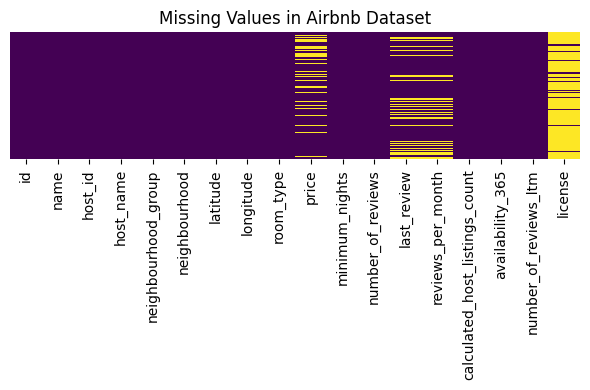

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(6, 4))
sns.heatmap(df.isnull(), cbar=False, yticklabels=False, cmap="viridis")  
plt.title('Missing Values in Airbnb Dataset')
plt.tight_layout()  


## Data Cleaning and Exploration

#### Precio (rellenar vacíos)

In [ ]:
missing_price_before = df['price'].isnull().sum()
print(f"Missing price values before imputation: {missing_price_before}")


Missing price values before imputation: 6014


C:\Users\gmont\AppData\Local\Temp\ipykernel_25008\2688284499.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bars = sns.barplot(x=neighborhood_prices.index,


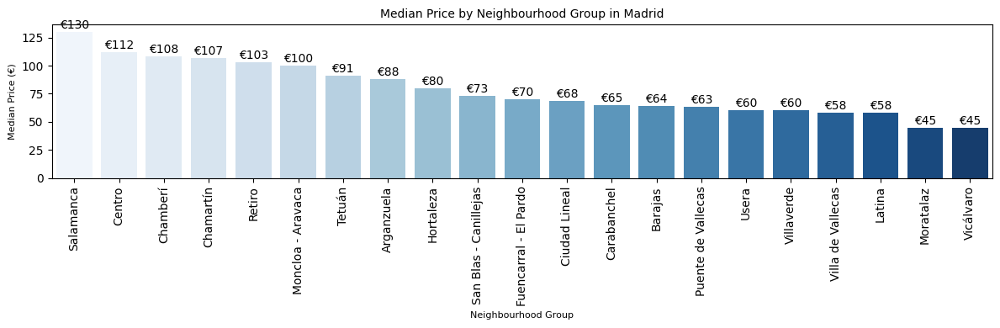

Median price by neighbourhood group:
neighbourhood_group
Salamanca                130.0
Centro                   112.0
Chamberí                 108.0
Chamartín                107.0
Retiro                   103.0
Moncloa - Aravaca        100.0
Tetuán                    91.0
Arganzuela                88.0
Hortaleza                 80.0
San Blas - Canillejas     73.0
Fuencarral - El Pardo     70.0
Ciudad Lineal             68.5
Carabanchel               65.0
Barajas                   64.0
Puente de Vallecas        63.0
Usera                     60.0
Villaverde                60.0
Villa de Vallecas         58.0
Latina                    58.0
Moratalaz                 45.0
Vicálvaro                 45.0
Name: price, dtype: float64


In [ ]:
neighborhood_prices = df.groupby('neighbourhood_group')['price'].median().sort_values(ascending=False)

plt.figure(figsize=(12, 4))
bars = sns.barplot(x=neighborhood_prices.index, 
                   y=neighborhood_prices.values, 
                   palette=sns.color_palette("Blues", n_colors=len(neighborhood_prices)))

for i, value in enumerate(neighborhood_prices.values):
    bars.text(i, value + 3, f'€{value:.0f}', ha='center')

plt.title('Median Price by Neighbourhood Group in Madrid', fontsize=10)
plt.xlabel('Neighbourhood Group', fontsize=8)
plt.ylabel('Median Price (€)', fontsize=8)
plt.xticks(rotation=90)
plt.tight_layout()

plt.show()

print("Median price by neighbourhood group:")
print(neighborhood_prices)

In [ ]:
df['price'] = df.groupby(['neighbourhood', 'room_type'])['price'].transform(
    lambda x: x.fillna(x.median()))

missing_after_step1 = df['price'].isnull().sum()
if missing_after_step1 > 0:
    print(f"Still missing {missing_after_step1} prices after neighbourhood + room_type imputation")
    df['price'] = df.groupby(['neighbourhood_group', 'room_type'])['price'].transform(
        lambda x: x.fillna(x.median()))

missing_after_step2 = df['price'].isnull().sum()
if missing_after_step2 > 0:
    print(f"Still missing {missing_after_step2} prices after neighbourhood_group + room_type imputation")
    df['price'] = df.groupby('room_type')['price'].transform(
        lambda x: x.fillna(x.median()))

missing_after_step3 = df['price'].isnull().sum()
if missing_after_step3 > 0:
    print(f"Still missing {missing_after_step3} prices after room_type imputation")
    overall_median = df['price'].median()
    df['price'] = df['price'].fillna(overall_median)
    print(f"Filled remaining with overall median: {overall_median}")

final_missing = df['price'].isnull().sum()
print(f"Final missing price values: {final_missing}")


Still missing 20 prices after neighbourhood + room_type imputation
Still missing 12 prices after neighbourhood_group + room_type imputation
Final missing price values: 0


c:\Users\gmont\OneDrive\Documentos\TFM\venv\Lib\site-packages\numpy\lib\_nanfunctions_impl.py:1241: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
c:\Users\gmont\OneDrive\Documentos\TFM\venv\Lib\site-packages\numpy\lib\_nanfunctions_impl.py:1241: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
c:\Users\gmont\OneDrive\Documentos\TFM\venv\Lib\site-packages\numpy\lib\_nanfunctions_impl.py:1241: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
c:\Users\gmont\OneDrive\Documentos\TFM\venv\Lib\site-packages\numpy\lib\_nanfunctions_impl.py:1241: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
c:\Users\gmont\OneDrive\Documentos\TFM\venv\Lib\site-packages\numpy\lib\_nanfunctions_impl.py:1241: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
c:\Users\gmont\OneDrive\Documentos\

C:\Users\gmont\AppData\Local\Temp\ipykernel_25008\2688284499.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bars = sns.barplot(x=neighborhood_prices.index,


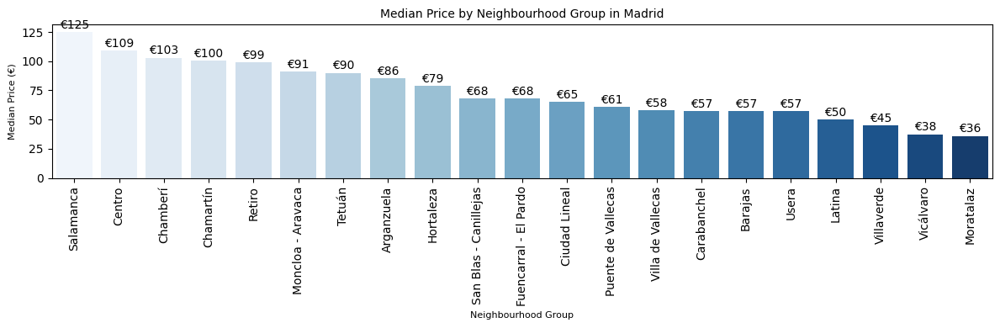

Median price by neighbourhood group:
neighbourhood_group
Salamanca                125.0
Centro                   109.0
Chamberí                 103.0
Chamartín                100.5
Retiro                    99.0
Moncloa - Aravaca         91.0
Tetuán                    90.0
Arganzuela                85.5
Hortaleza                 79.0
San Blas - Canillejas     68.0
Fuencarral - El Pardo     68.0
Ciudad Lineal             65.0
Puente de Vallecas        61.0
Villa de Vallecas         58.0
Carabanchel               57.0
Barajas                   57.0
Usera                     57.0
Latina                    50.0
Villaverde                45.0
Vicálvaro                 37.5
Moratalaz                 36.0
Name: price, dtype: float64


In [ ]:
neighborhood_prices = df.groupby('neighbourhood_group')['price'].median().sort_values(ascending=False)

plt.figure(figsize=(12, 4))
bars = sns.barplot(x=neighborhood_prices.index, 
                   y=neighborhood_prices.values, 
                   palette=sns.color_palette("Blues", n_colors=len(neighborhood_prices)))

for i, value in enumerate(neighborhood_prices.values):
    bars.text(i, value + 3, f'€{value:.0f}', ha='center')

plt.title('Median Price by Neighbourhood Group in Madrid', fontsize=10)
plt.xlabel('Neighbourhood Group', fontsize=8)
plt.ylabel('Median Price (€)', fontsize=8)
plt.xticks(rotation=90)
plt.tight_layout()

plt.show()

print("Median price by neighbourhood group:")
print(neighborhood_prices)

### Información estadística

In [ ]:
numeric_summary = df.describe()
print("Summary statistics for numerical columns:")
print(numeric_summary)

Summary statistics for numerical columns:
                 id       host_id      latitude     longitude         price  \
count  2.528800e+04  2.528800e+04  25288.000000  25288.000000  25288.000000   
mean   6.439293e+17  2.583530e+08     40.421572     -3.693851    125.585693   
std    5.357949e+17  2.083118e+08      0.023441      0.027972    379.913184   
min    2.185300e+04  7.952000e+03     40.331400     -3.883990      8.000000   
25%    3.676095e+07  5.168513e+07     40.409288     -3.707420     58.000000   
50%    8.115619e+17  2.228602e+08     40.420382     -3.700932     94.000000   
75%    1.142574e+18  4.488906e+08     40.431617     -3.684771    131.000000   
max    1.369179e+18  6.821759e+08     40.577290     -3.545904  23124.000000   

       minimum_nights  number_of_reviews  reviews_per_month  \
count    25288.000000       25288.000000       20091.000000   
mean         8.828061          47.688508           1.778151   
std         31.799013          89.272627           1.9141

In [ ]:
categorical_cols = df.select_dtypes(include=['object']).columns
categorical_summary = {}

for col in categorical_cols:
    unique_count = df[col].nunique()
    value_counts = df[col].value_counts().head(5)
    
    categorical_summary[col] = {
        'unique_values': unique_count,
        'top_5_values': value_counts
    }

print("\nSummary for categorical columns:")
for col, summary in categorical_summary.items():
    print(f"\n{col}:")
    print(f"  Number of unique values: {summary['unique_values']}")
    print(f"  Top 5 most common values:")
    for value, count in summary['top_5_values'].items():
        print(f"    {value}: {count}")


Summary for categorical columns:

name:
  Number of unique values: 23757
  Top 5 most common values:
    Habitación en piso compartido: 61
    Habitación con baño privado: 32
    Habitación en Madrid: 22
    Habitación: 21
    Fantastic residence ``FUNWAY´´ north zone Madrid: 19

host_name:
  Number of unique values: 4190
  Top 5 most common values:
    Francisco Andres: 445
    Home Club: 356
    Ukio: 341
    MIT House: 340
    Javier: 330

neighbourhood_group:
  Number of unique values: 21
  Top 5 most common values:
    Centro: 10499
    Salamanca: 1684
    Chamberí: 1643
    Tetuán: 1575
    Arganzuela: 1378

neighbourhood:
  Number of unique values: 128
  Top 5 most common values:
    Embajadores: 2801
    Universidad: 2240
    Palacio: 1818
    Sol: 1326
    Justicia: 1272

room_type:
  Number of unique values: 4
  Top 5 most common values:
    Entire home/apt: 16805
    Private room: 8281
    Shared room: 120
    Hotel room: 82

last_review:
  Number of unique values: 1903
  T

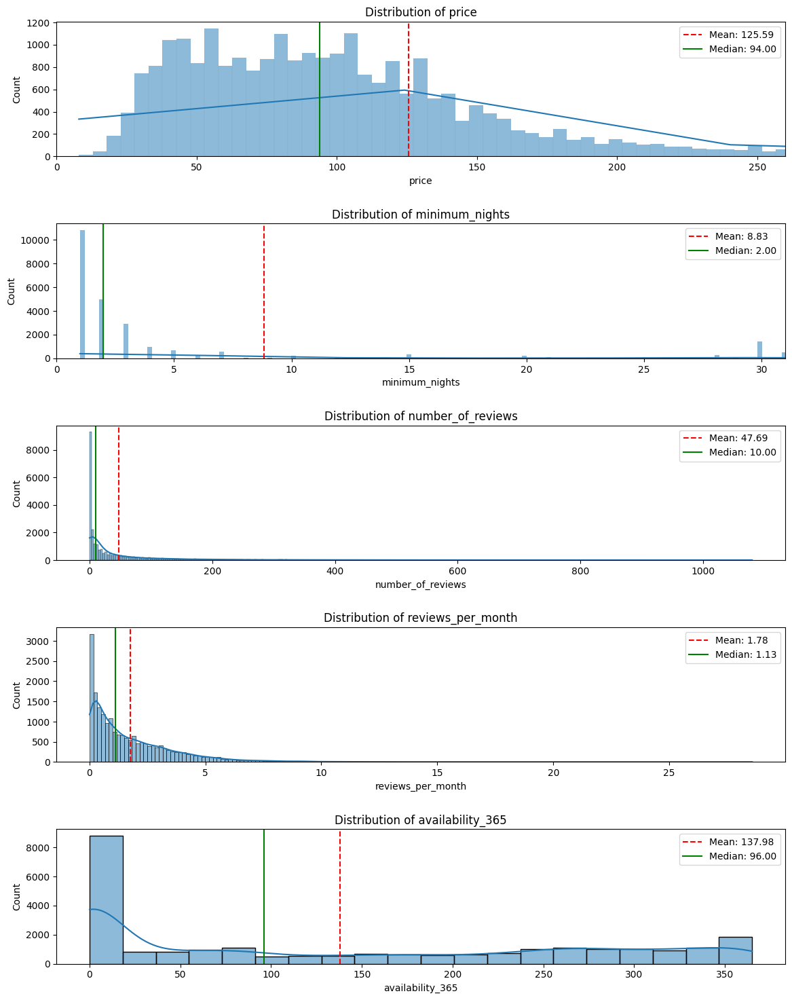

In [ ]:
numeric_cols_to_plot = ['price', 'minimum_nights', 'number_of_reviews', 
                        'reviews_per_month', 'availability_365']

fig, axes = plt.subplots(len(numeric_cols_to_plot), 1, figsize=(12, 15))
fig.tight_layout(pad=3.0)

for i, col in enumerate(numeric_cols_to_plot):
    if df[col].isnull().sum() > 0:
        valid_data = df[col].dropna()
    else:
        valid_data = df[col]
    
    sns.histplot(valid_data, kde=True, ax=axes[i])
    
    if col == 'price':
        axes[i].set_xlim(0, df[col].quantile(0.95))  
    elif col == 'minimum_nights':
        axes[i].set_xlim(0, df[col].quantile(0.95))
    
    axes[i].set_title(f'Distribution of {col}')
    
    mean_val = valid_data.mean()
    median_val = valid_data.median()
    axes[i].axvline(mean_val, color='r', linestyle='--', label=f'Mean: {mean_val:.2f}')
    axes[i].axvline(median_val, color='g', linestyle='-', label=f'Median: {median_val:.2f}')
    axes[i].legend()

plt.subplots_adjust(hspace=0.5)
plt.show()

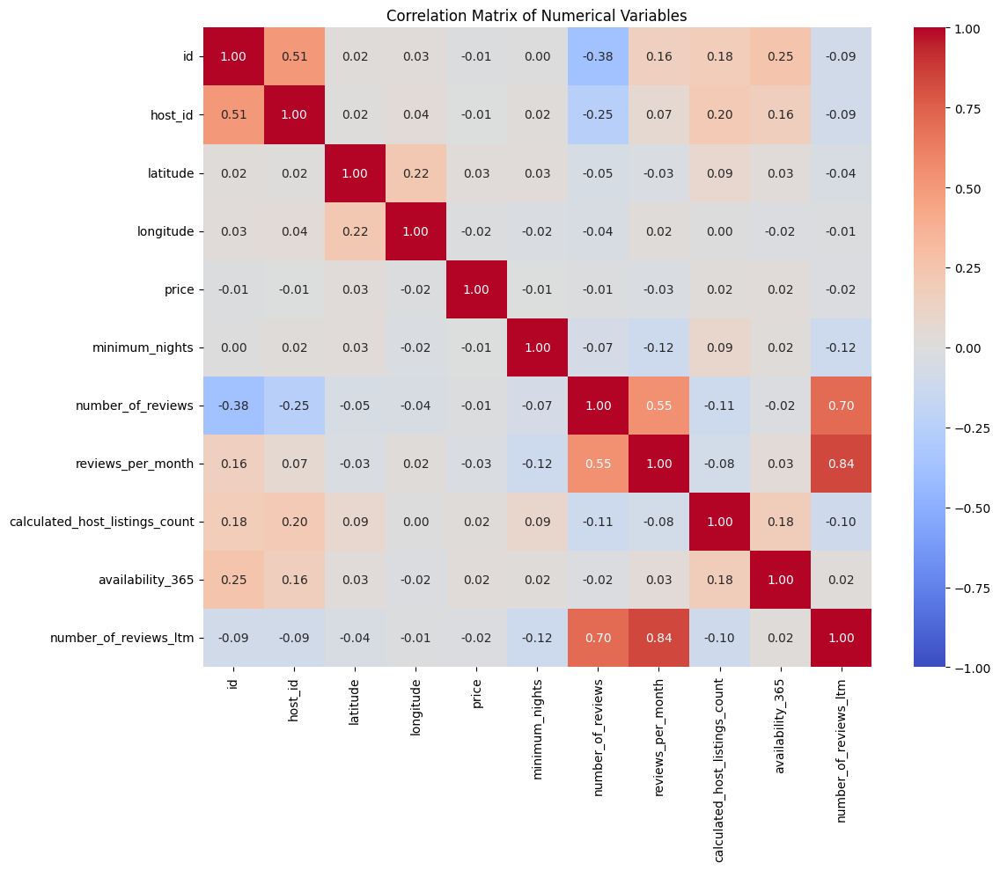

In [ ]:
correlation_matrix = df.select_dtypes(include=['float64', 'int64']).corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, fmt='.2f')
plt.title('Correlation Matrix of Numerical Variables')
plt.tight_layout()
plt.show()

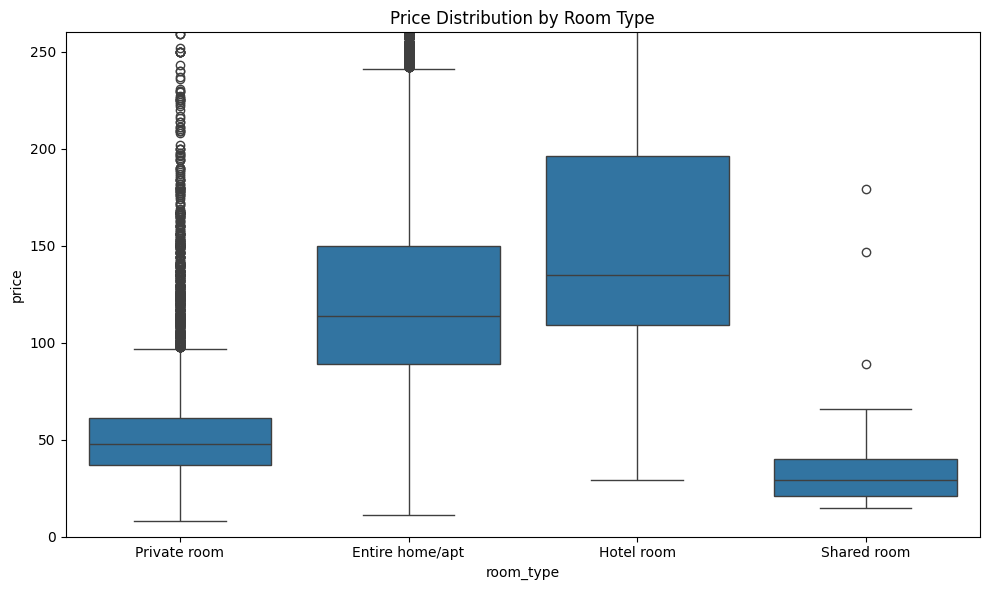

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='room_type', y='price', data=df)
plt.title('Price Distribution by Room Type')
plt.ylim(0, df['price'].quantile(0.95))  
plt.tight_layout()
plt.show()

In [ ]:
anomalous_private = df[(df['room_type'] == 'Private room') & (df['price'] > 100)]
print(f"Private rooms con precio > 100€: {len(anomalous_private)}")

Private rooms con precio > 100€: 671


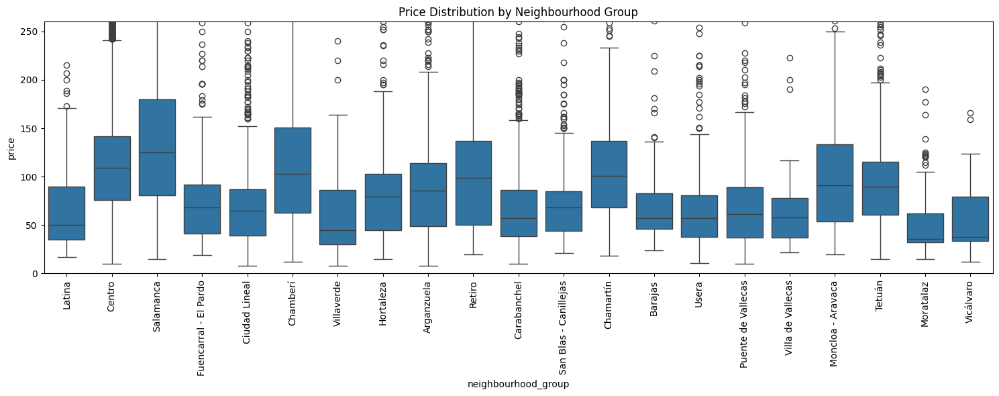

In [ ]:
plt.figure(figsize=(15, 6))
sns.boxplot(x='neighbourhood_group', y='price', data=df)
plt.title('Price Distribution by Neighbourhood Group')
plt.ylim(0, df['price'].quantile(0.95))
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

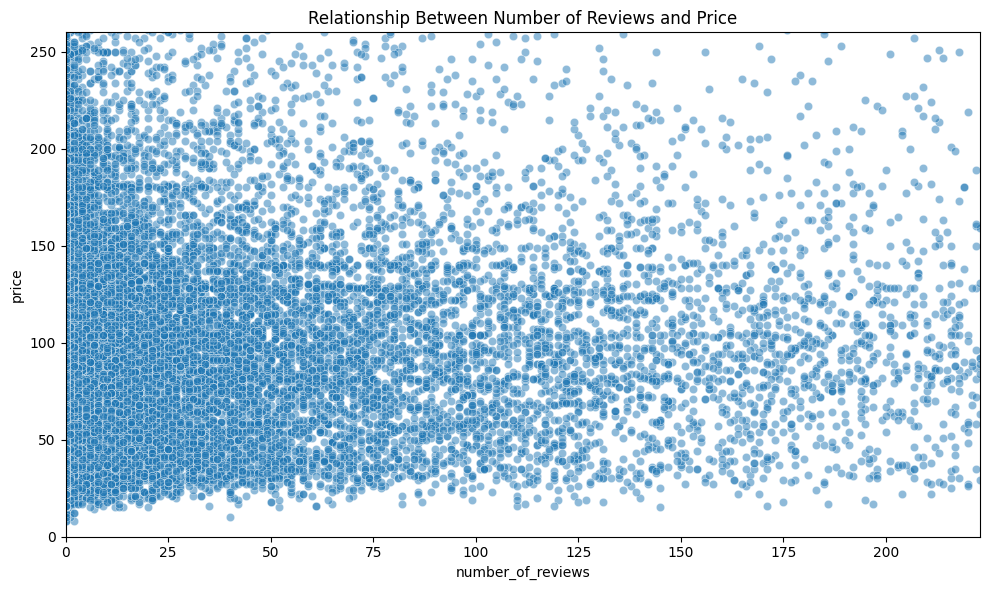

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='number_of_reviews', y='price', data=df, alpha=0.5)
plt.title('Relationship Between Number of Reviews and Price')
plt.ylim(0, df['price'].quantile(0.95))
plt.xlim(0, df['number_of_reviews'].quantile(0.95))
plt.tight_layout()
plt.show()

## Exploratory Data Analysis (EDA)

#### 1. Distribution of prices across neighborhoods

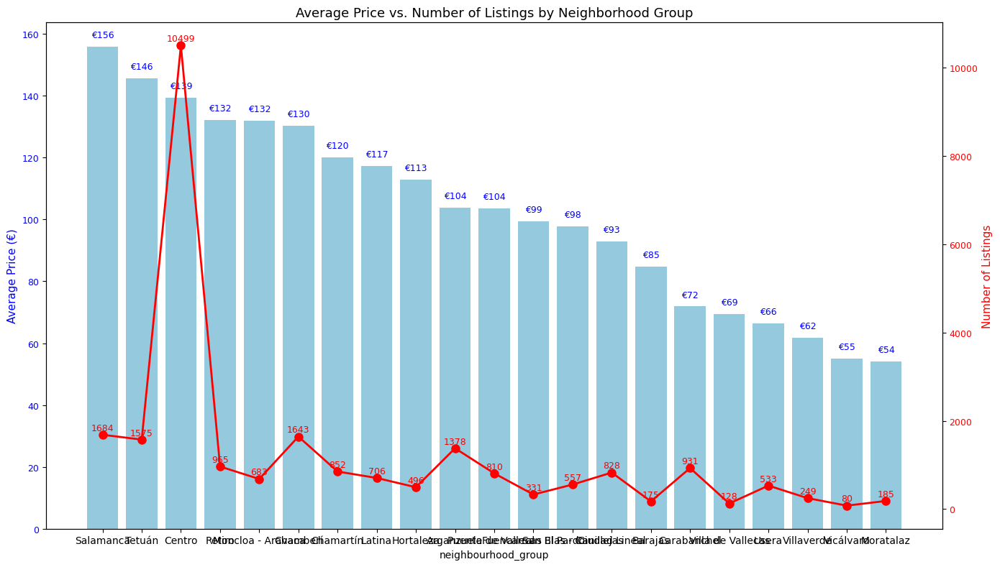

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

neighborhood_group_counts = df['neighbourhood_group'].value_counts()
neighborhood_group_avg_prices = df.groupby('neighbourhood_group')['price'].mean()

sorted_groups = neighborhood_group_avg_prices.sort_values(ascending=False).index

fig, ax1 = plt.subplots(figsize=(14, 8))
ax2 = ax1.twinx()

bars = sns.barplot(x=sorted_groups, y=neighborhood_group_avg_prices[sorted_groups], ax=ax1, color='skyblue')
ax1.set_ylabel('Average Price (€)', fontsize=11, color='blue')
ax1.tick_params(axis='y', labelcolor='blue', labelsize=9)

for i, value in enumerate(neighborhood_group_avg_prices[sorted_groups].values):
    ax1.text(i, value + 3, f'€{value:.0f}', ha='center', fontsize=9, color='blue')

ax2.plot(range(len(sorted_groups)), neighborhood_group_counts[sorted_groups], 'ro-', linewidth=2, markersize=8)
ax2.set_ylabel('Number of Listings', fontsize=11, color='red')
ax2.tick_params(axis='y', labelcolor='red', labelsize=9)

for i, value in enumerate(neighborhood_group_counts[sorted_groups].values):
    ax2.text(i, value + 100, f'{value}', ha='center', fontsize=9, color='red')

plt.title('Average Price vs. Number of Listings by Neighborhood Group', fontsize=13)
plt.xlabel('Neighborhood Group', fontsize=11)

plt.xticks(range(len(sorted_groups)), sorted_groups, rotation=90, fontsize=9)

plt.subplots_adjust(bottom=0.2)

plt.tight_layout()
plt.show()

#### 1.1 Distribution of prices across neighborhood groups

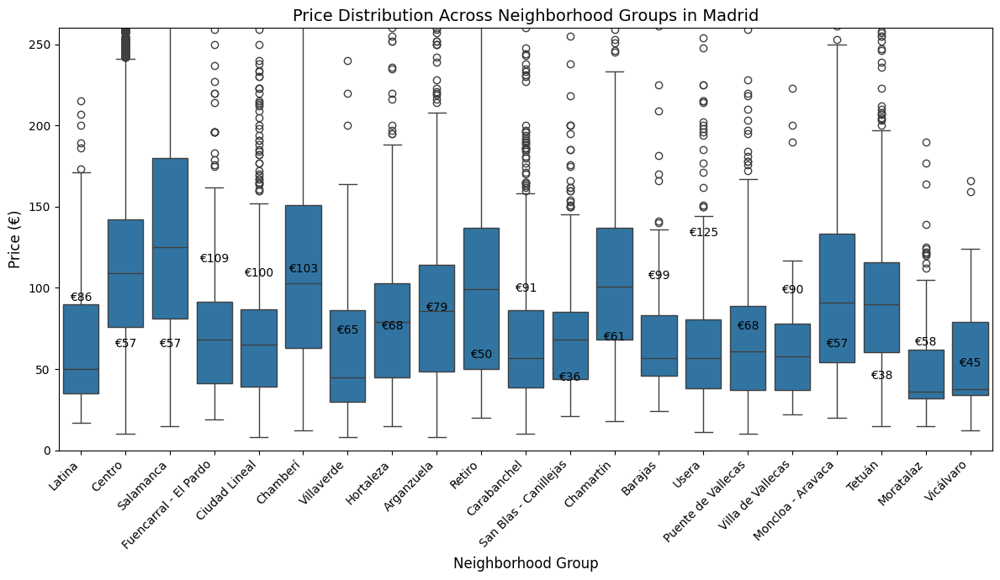

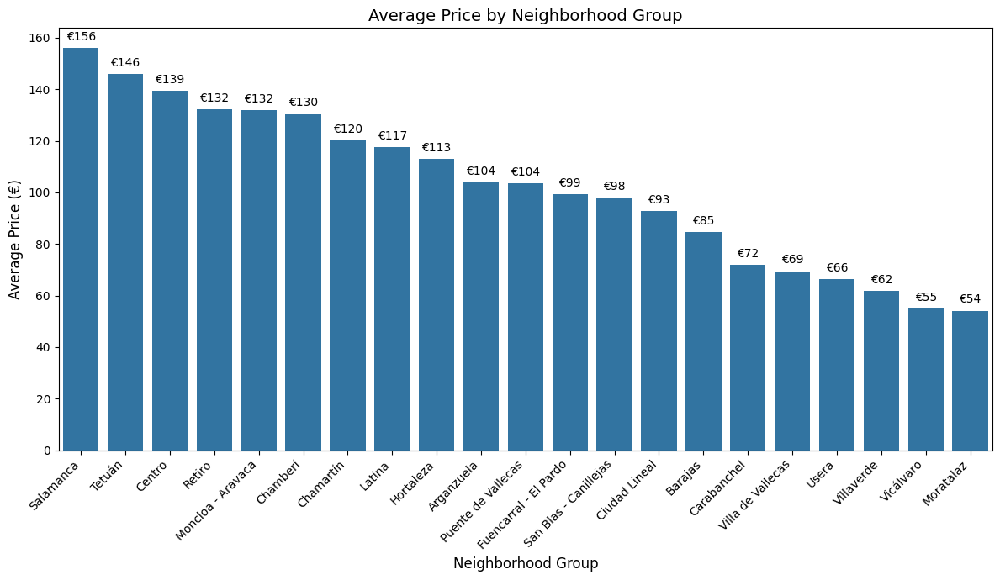

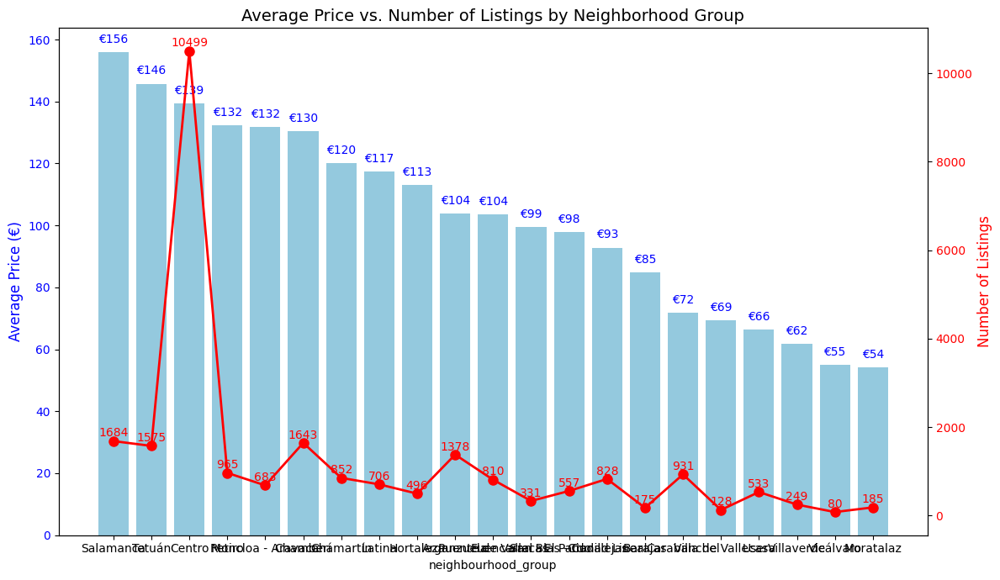

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

plt.figure(figsize=(12, 7))
ax = sns.boxplot(x='neighbourhood_group', y='price', data=df)
plt.title('Price Distribution Across Neighborhood Groups in Madrid', fontsize=14)
plt.xlabel('Neighborhood Group', fontsize=12)
plt.ylabel('Price (€)', fontsize=12)
plt.xticks(rotation=45, ha='right')

plt.ylim(0, df['price'].quantile(0.95))

medians = df.groupby('neighbourhood_group')['price'].median()
positions = range(len(medians))
for i, median in enumerate(medians):
    ax.text(positions[i], median + 5, f'€{median:.0f}', ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()

avg_prices = df.groupby('neighbourhood_group')['price'].mean().sort_values(ascending=False)

plt.figure(figsize=(12, 7))
bars = sns.barplot(x=avg_prices.index, y=avg_prices.values)

for i, value in enumerate(avg_prices.values):
    bars.text(i, value + 3, f'€{value:.0f}', ha='center', fontsize=10)

plt.title('Average Price by Neighborhood Group', fontsize=14)
plt.xlabel('Neighborhood Group', fontsize=12)
plt.ylabel('Average Price (€)', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

neighborhood_group_counts = df['neighbourhood_group'].value_counts()
neighborhood_group_avg_prices = df.groupby('neighbourhood_group')['price'].mean()

sorted_groups = neighborhood_group_avg_prices.sort_values(ascending=False).index

fig, ax1 = plt.subplots(figsize=(12, 7))
ax2 = ax1.twinx()

bars = sns.barplot(x=sorted_groups, y=neighborhood_group_avg_prices[sorted_groups], ax=ax1, color='skyblue')
ax1.set_ylabel('Average Price (€)', fontsize=12, color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

for i, value in enumerate(neighborhood_group_avg_prices[sorted_groups].values):
    ax1.text(i, value + 3, f'€{value:.0f}', ha='center', fontsize=10, color='blue')

ax2.plot(range(len(sorted_groups)), neighborhood_group_counts[sorted_groups], 'ro-', linewidth=2, markersize=8)
ax2.set_ylabel('Number of Listings', fontsize=12, color='red')
ax2.tick_params(axis='y', labelcolor='red')

for i, value in enumerate(neighborhood_group_counts[sorted_groups].values):
    ax2.text(i, value + 100, f'{value}', ha='center', fontsize=10, color='red')

plt.title('Average Price vs. Number of Listings by Neighborhood Group', fontsize=14)
plt.xlabel('Neighborhood Group', fontsize=12)
plt.xticks(range(len(sorted_groups)), sorted_groups, rotation=45, ha='right')
plt.tight_layout()
plt.show()

### Room type frequency analysis

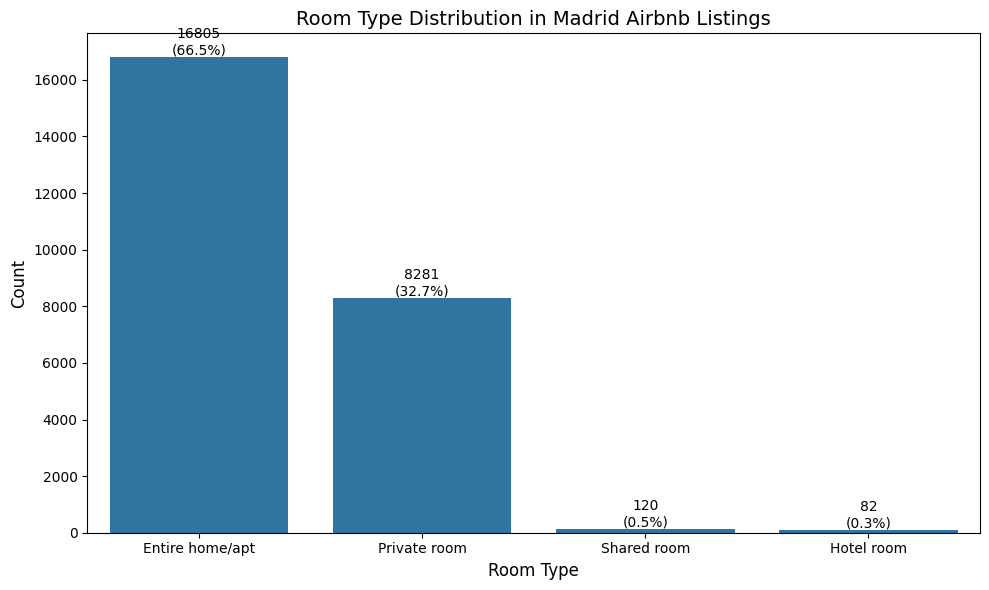

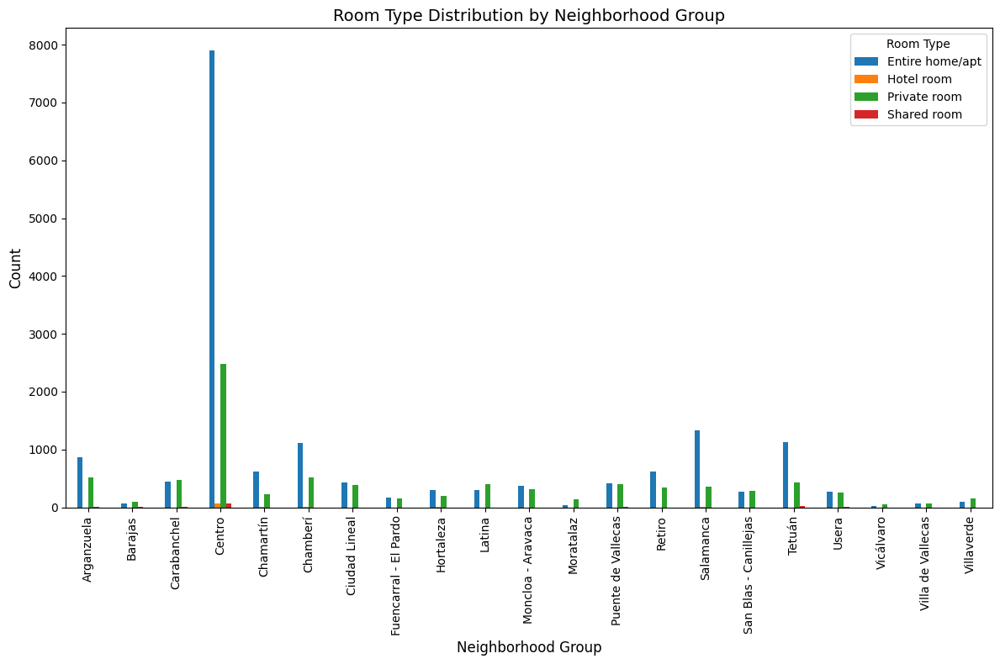

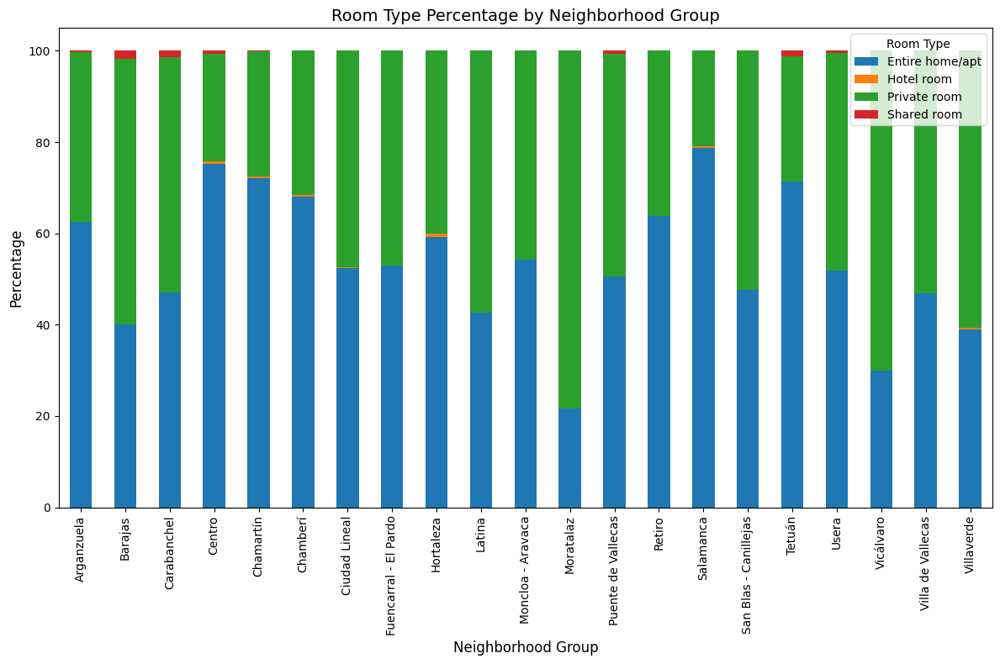

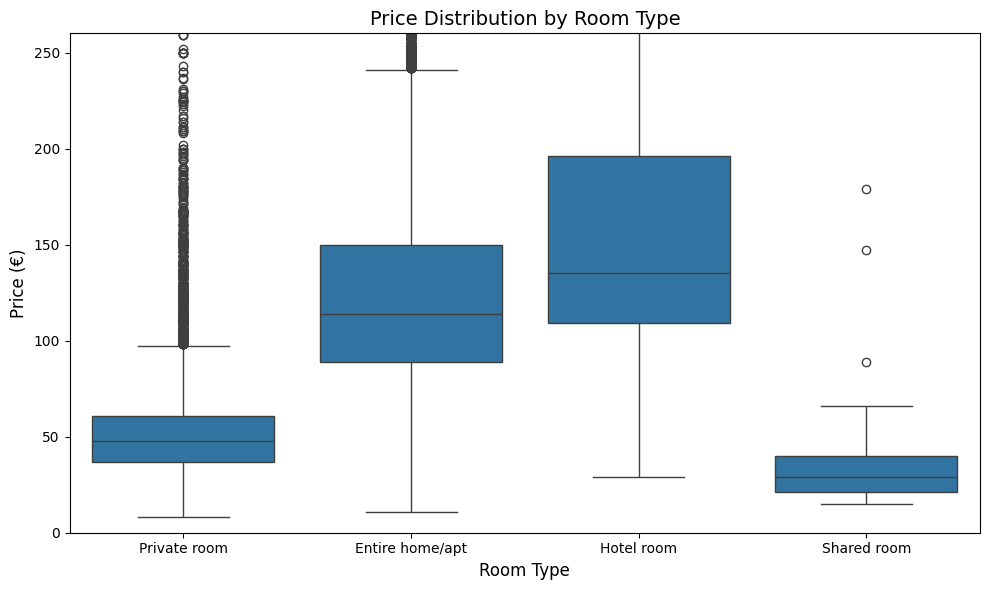

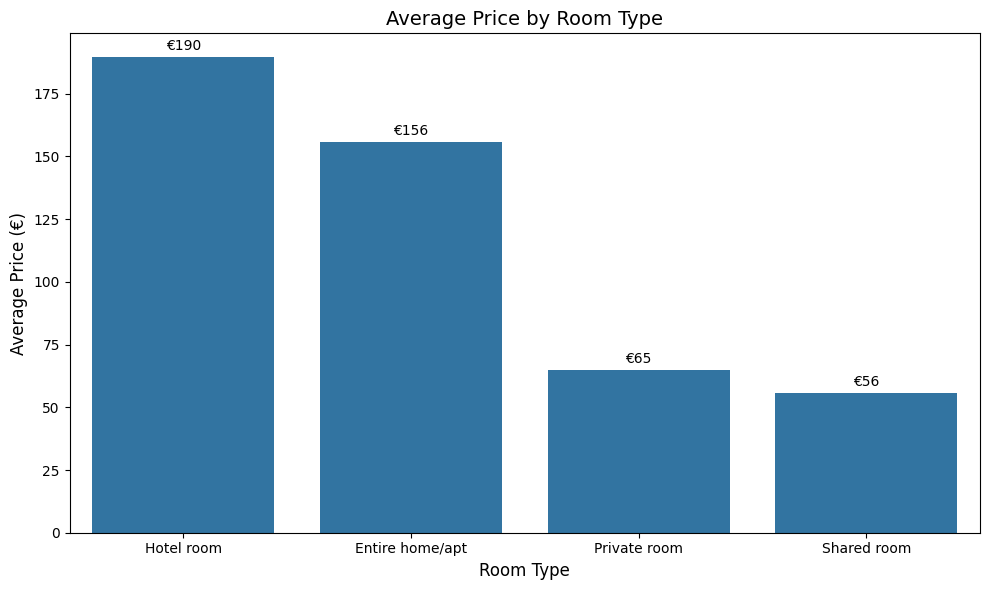

In [ ]:
room_type_counts = df['room_type'].value_counts()

room_type_percentage = (room_type_counts / room_type_counts.sum() * 100).round(1)

plt.figure(figsize=(10, 6))
ax = sns.countplot(x='room_type', data=df, order=room_type_counts.index)

for i, (count, percentage) in enumerate(zip(room_type_counts, room_type_percentage)):
    ax.text(i, count + 100, f'{count}\n({percentage}%)', ha='center', fontsize=10)

plt.title('Room Type Distribution in Madrid Airbnb Listings', fontsize=14)
plt.xlabel('Room Type', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.tight_layout()
plt.show()

room_by_area = pd.crosstab(df['neighbourhood_group'], df['room_type'])

room_by_area_pct = room_by_area.div(room_by_area.sum(axis=1), axis=0) * 100

plt.figure(figsize=(12, 8))
room_by_area.plot(kind='bar', ax=plt.gca())
plt.title('Room Type Distribution by Neighborhood Group', fontsize=14)
plt.xlabel('Neighborhood Group', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=90)
plt.legend(title='Room Type')
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 8))
room_by_area_pct.plot(kind='bar', stacked=True, ax=plt.gca())
plt.title('Room Type Percentage by Neighborhood Group', fontsize=14)
plt.xlabel('Neighborhood Group', fontsize=12)
plt.ylabel('Percentage', fontsize=12)
plt.xticks(rotation=90)
plt.legend(title='Room Type')
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 6))
sns.boxplot(x='room_type', y='price', data=df)
plt.title('Price Distribution by Room Type', fontsize=14)
plt.xlabel('Room Type', fontsize=12)
plt.ylabel('Price (€)', fontsize=12)
plt.ylim(0, df['price'].quantile(0.95))  
plt.tight_layout()
plt.show()

avg_price_by_room = df.groupby('room_type')['price'].mean().sort_values(ascending=False)

plt.figure(figsize=(10, 6))
bars = sns.barplot(x=avg_price_by_room.index, y=avg_price_by_room.values)

for i, value in enumerate(avg_price_by_room.values):
    bars.text(i, value + 3, f'€{value:.0f}', ha='center', fontsize=10)

plt.title('Average Price by Room Type', fontsize=14)
plt.xlabel('Room Type', fontsize=12) 
plt.ylabel('Average Price (€)', fontsize=12)
plt.tight_layout()
plt.show()

### Geographic visualization using latitude/longitude

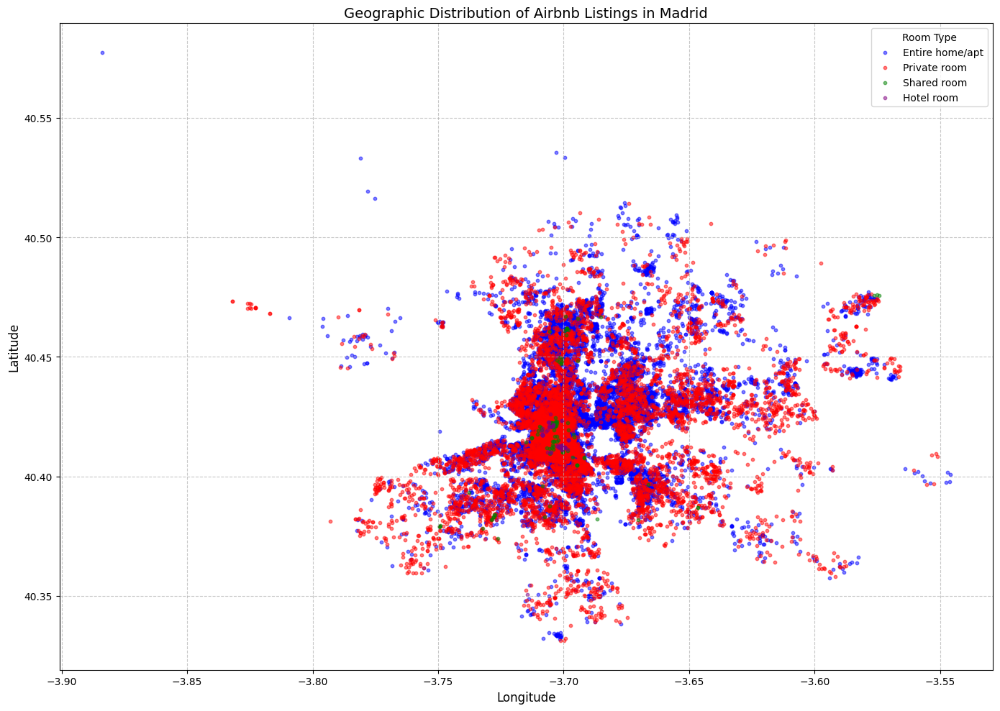

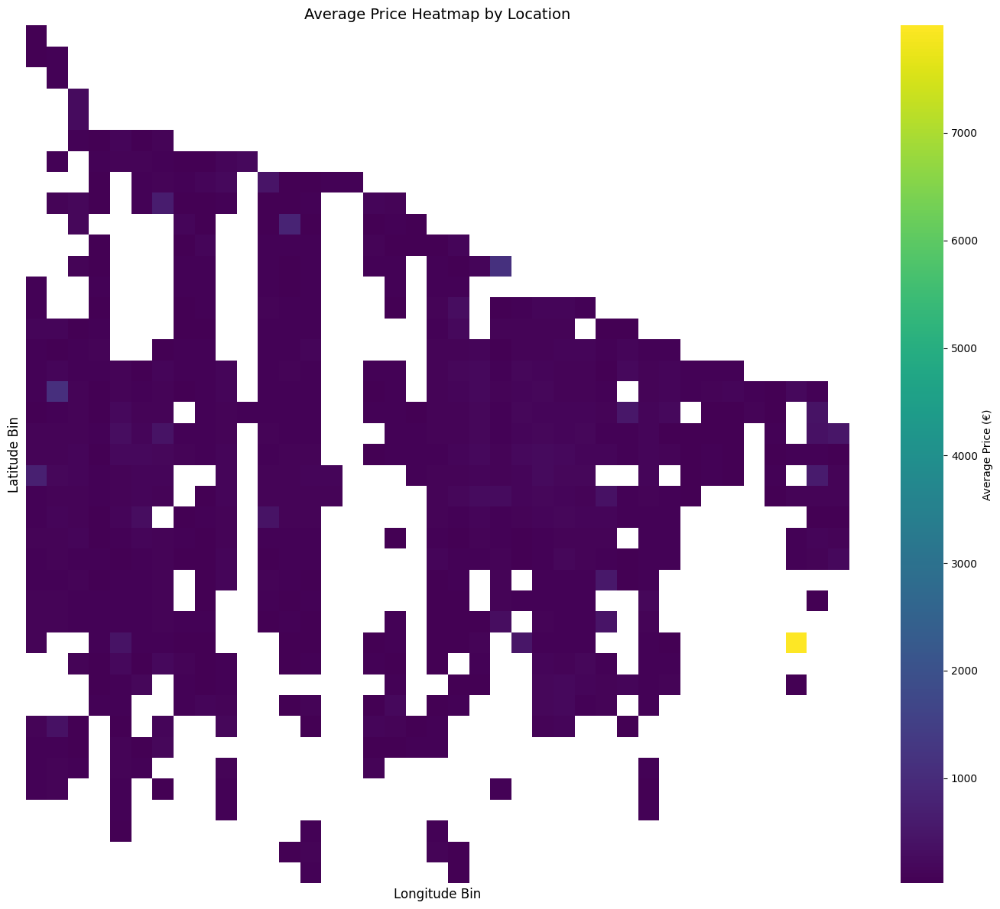

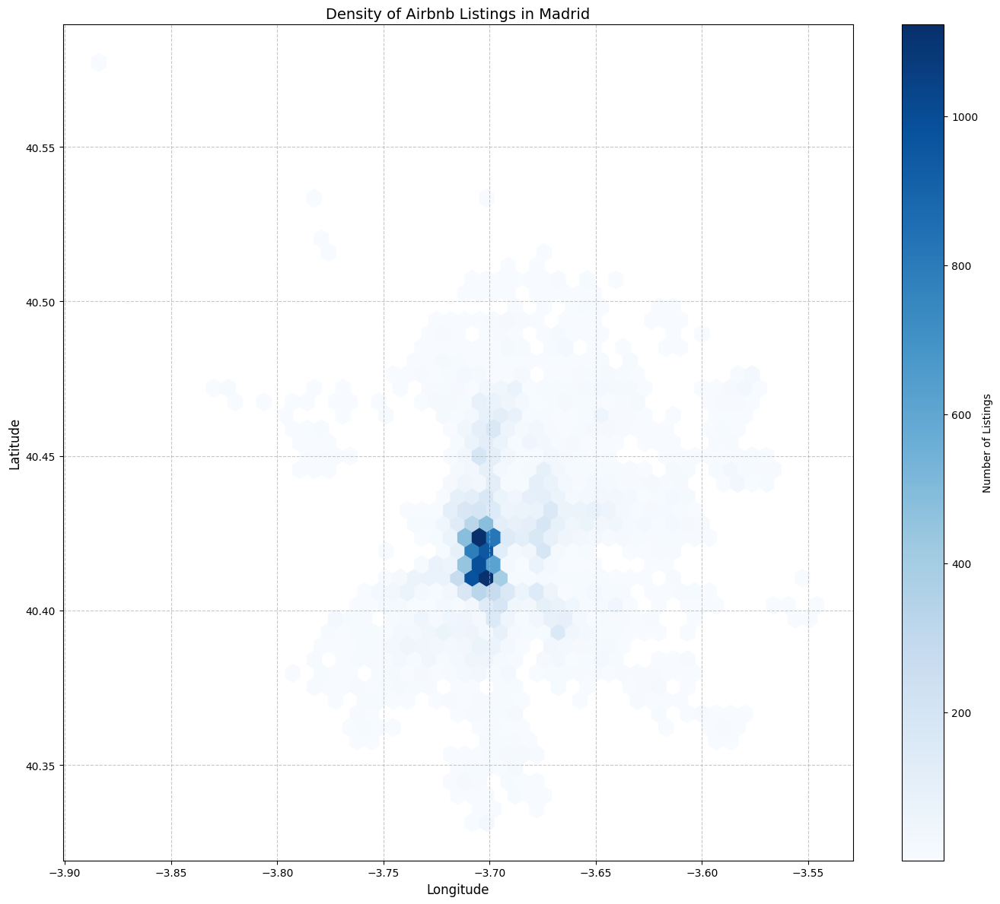

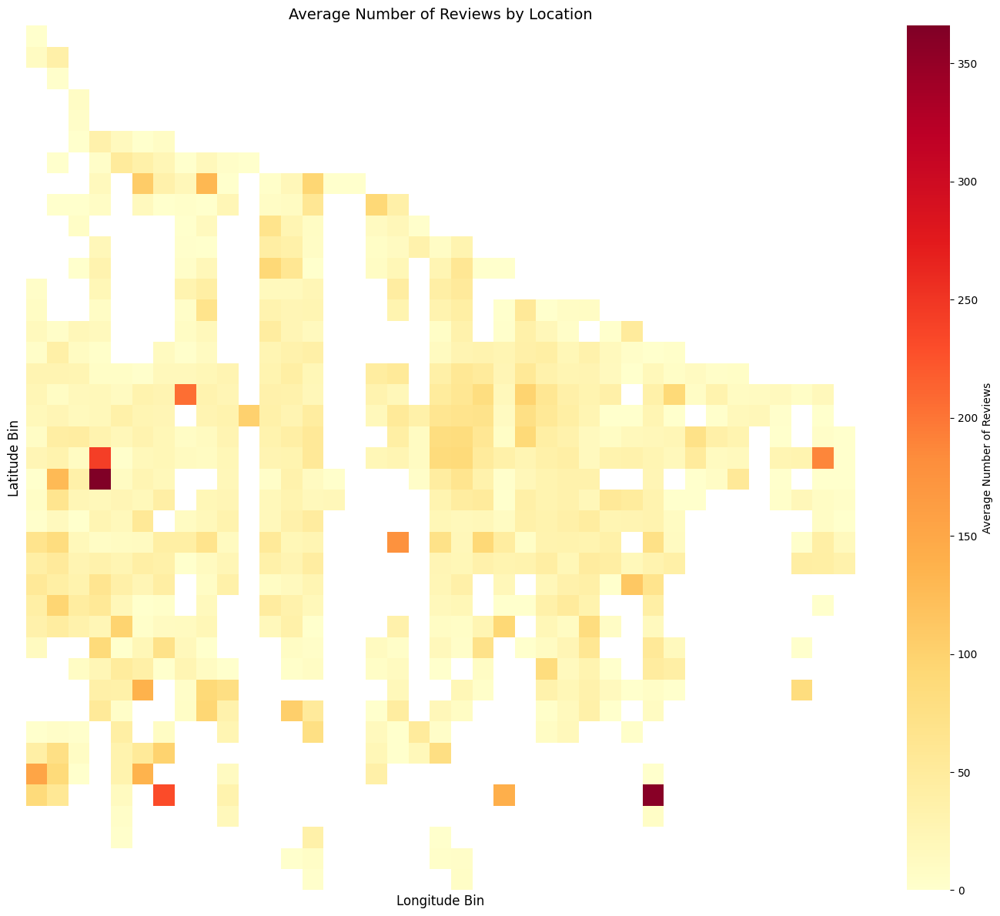

In [ ]:
plt.figure(figsize=(14, 10))

room_type_colors = {'Entire home/apt': 'blue', 'Private room': 'red', 'Shared room': 'green', 'Hotel room': 'purple'}

for room_type, color in room_type_colors.items():
    subset = df[df['room_type'] == room_type]
    plt.scatter(subset['longitude'], subset['latitude'], 
                c=color, alpha=0.5, s=10, label=room_type)

plt.title('Geographic Distribution of Airbnb Listings in Madrid', fontsize=14)
plt.xlabel('Longitude', fontsize=12)
plt.ylabel('Latitude', fontsize=12)
plt.legend(title='Room Type')

plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

lon_bins = np.linspace(df['longitude'].min(), df['longitude'].max(), 50)
lat_bins = np.linspace(df['latitude'].min(), df['latitude'].max(), 50)

df['lon_bin'] = pd.cut(df['longitude'], lon_bins, labels=False)
df['lat_bin'] = pd.cut(df['latitude'], lat_bins, labels=False)

price_grid = df.groupby(['lon_bin', 'lat_bin'])['price'].mean().unstack()

plt.figure(figsize=(14, 12))
ax = sns.heatmap(price_grid, cmap='viridis', cbar_kws={'label': 'Average Price (€)'})

plt.title('Average Price Heatmap by Location', fontsize=14)
plt.xlabel('Longitude Bin', fontsize=12)
plt.ylabel('Latitude Bin', fontsize=12)

ax.set_xticks([])
ax.set_yticks([])

plt.tight_layout()
plt.show()

plt.figure(figsize=(14, 12))
plt.hexbin(df['longitude'], df['latitude'], gridsize=50, cmap='Blues', mincnt=1)
plt.colorbar(label='Number of Listings')
plt.title('Density of Airbnb Listings in Madrid', fontsize=14)
plt.xlabel('Longitude', fontsize=12)
plt.ylabel('Latitude', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

review_grid = df.groupby(['lon_bin', 'lat_bin'])['number_of_reviews'].mean().unstack()

plt.figure(figsize=(14, 12))
ax = sns.heatmap(review_grid, cmap='YlOrRd', cbar_kws={'label': 'Average Number of Reviews'})

plt.title('Average Number of Reviews by Location', fontsize=14)
plt.xlabel('Longitude Bin', fontsize=12)
plt.ylabel('Latitude Bin', fontsize=12)

ax.set_xticks([])
ax.set_yticks([])

plt.tight_layout()
plt.show()

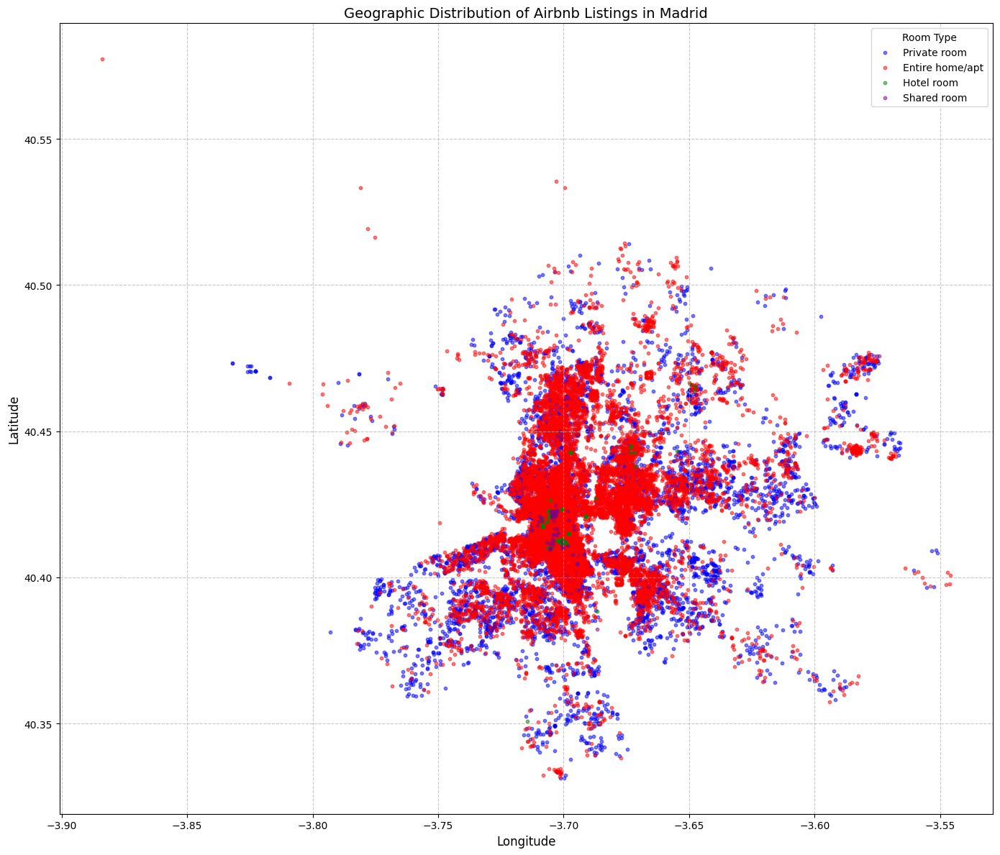

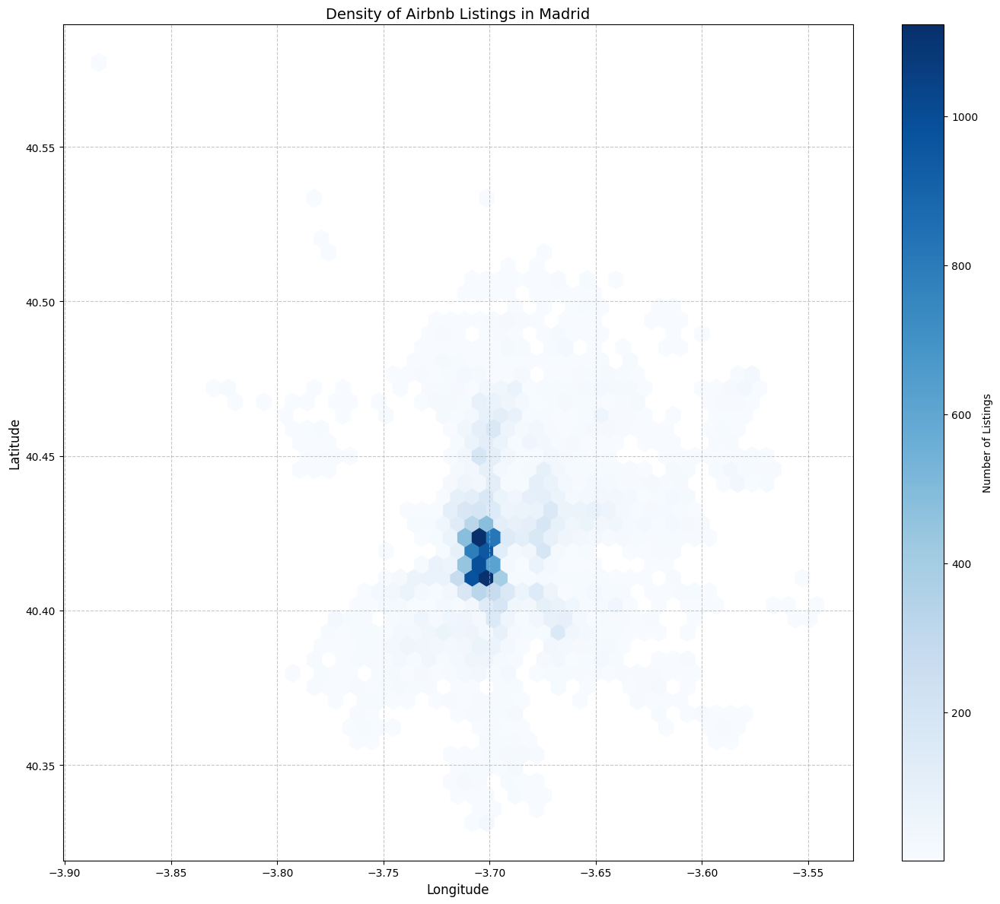

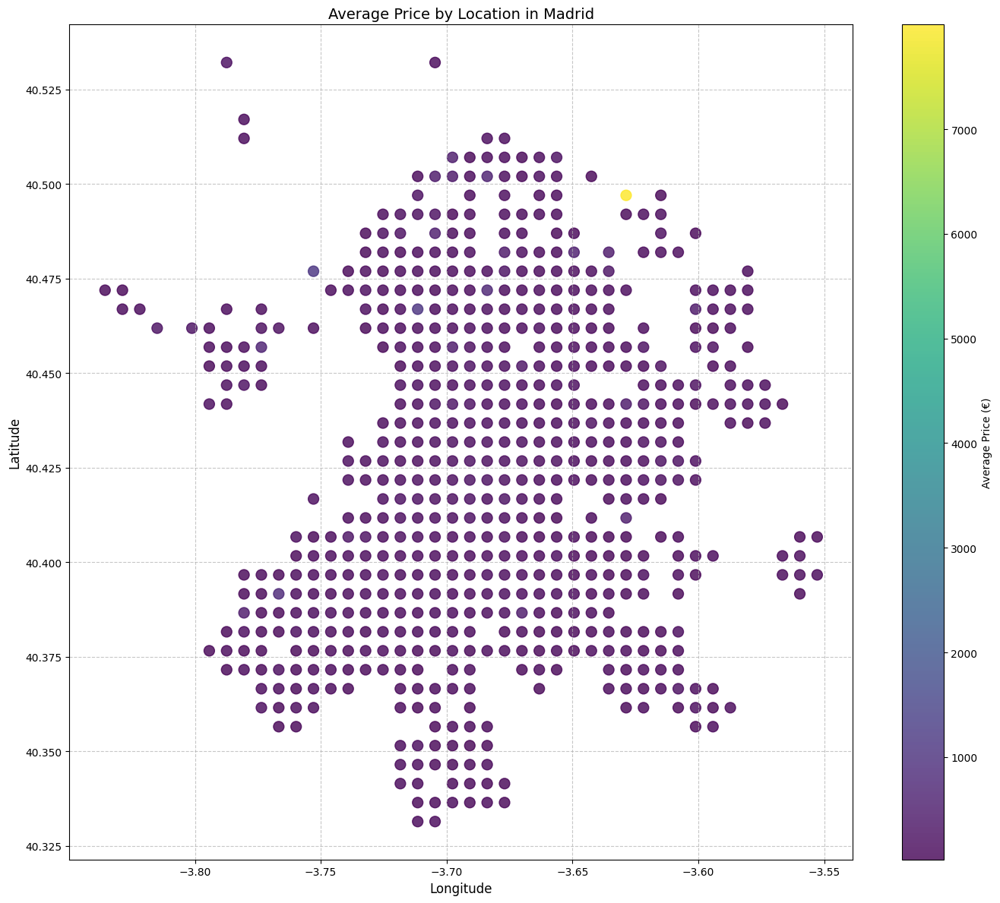

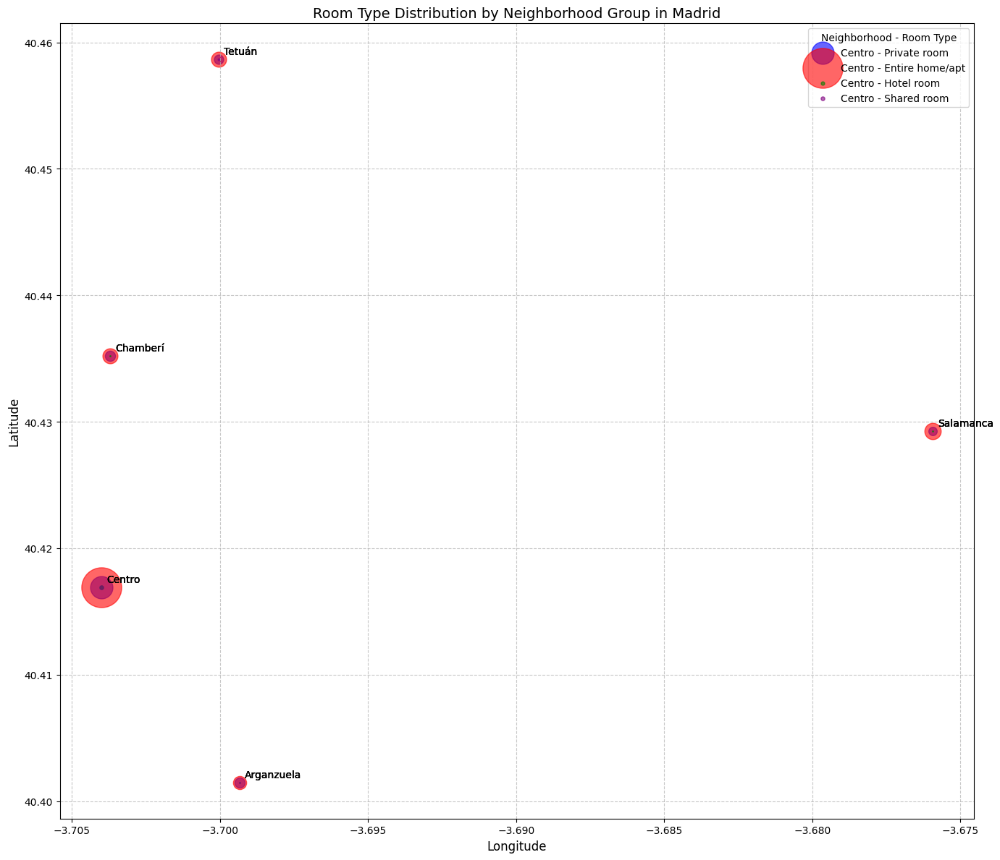

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

plt.figure(figsize=(14, 12))

room_types = df['room_type'].unique()
colors = ['blue', 'red', 'green', 'purple']  

for i, room_type in enumerate(room_types):
    subset = df[df['room_type'] == room_type]
    plt.scatter(subset['longitude'], subset['latitude'], 
                c=colors[i % len(colors)], 
                alpha=0.5, 
                s=10, 
                label=room_type)

plt.title('Geographic Distribution of Airbnb Listings in Madrid', fontsize=14)
plt.xlabel('Longitude', fontsize=12)
plt.ylabel('Latitude', fontsize=12)
plt.legend(title='Room Type')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

plt.figure(figsize=(14, 12))
hb = plt.hexbin(df['longitude'], df['latitude'], 
                gridsize=50, cmap='Blues', mincnt=1)
cb = plt.colorbar(hb, label='Number of Listings')
plt.title('Density of Airbnb Listings in Madrid', fontsize=14)
plt.xlabel('Longitude', fontsize=12)
plt.ylabel('Latitude', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

lon_bins = np.linspace(df['longitude'].min(), df['longitude'].max(), 50)
lat_bins = np.linspace(df['latitude'].min(), df['latitude'].max(), 50)

df['lon_bin'] = pd.cut(df['longitude'], lon_bins, labels=False)
df['lat_bin'] = pd.cut(df['latitude'], lat_bins, labels=False)

price_by_location = df.groupby(['lon_bin', 'lat_bin'])['price'].mean().reset_index()

plt.figure(figsize=(14, 12))
scatter = plt.scatter(
    lon_bins[price_by_location['lon_bin'].astype(int)],
    lat_bins[price_by_location['lat_bin'].astype(int)],
    c=price_by_location['price'],
    cmap='viridis',
    alpha=0.8,
    s=100  
)

plt.colorbar(scatter, label='Average Price (€)')

plt.title('Average Price by Location in Madrid', fontsize=14)
plt.xlabel('Longitude', fontsize=12)
plt.ylabel('Latitude', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

top_neighborhoods = df['neighbourhood_group'].value_counts().head(5).index
neighborhood_data = df[df['neighbourhood_group'].isin(top_neighborhoods)]

neighborhood_coords = neighborhood_data.groupby('neighbourhood_group')[['latitude', 'longitude']].mean()

room_counts = pd.crosstab(neighborhood_data['neighbourhood_group'], neighborhood_data['room_type'])

plt.figure(figsize=(14, 12))

for i, room_type in enumerate(room_types):
    if room_type not in room_counts.columns:
        continue
        
    sizes = room_counts[room_type]
    
    for neighborhood in top_neighborhoods:
        if neighborhood in sizes.index:
            plt.scatter(
                neighborhood_coords.loc[neighborhood, 'longitude'],
                neighborhood_coords.loc[neighborhood, 'latitude'],
                s=sizes[neighborhood] / 5,  
                c=colors[i % len(colors)],
                alpha=0.6,
                label=f"{neighborhood} - {room_type}" if neighborhood == top_neighborhoods[0] else ""
            )
            
            plt.annotate(
                neighborhood,
                (neighborhood_coords.loc[neighborhood, 'longitude'], 
                 neighborhood_coords.loc[neighborhood, 'latitude']),
                xytext=(5, 5),
                textcoords='offset points'
            )

plt.title('Room Type Distribution by Neighborhood Group in Madrid', fontsize=14)
plt.xlabel('Longitude', fontsize=12)
plt.ylabel('Latitude', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Neighborhood - Room Type')
plt.tight_layout()
plt.show()

In [ ]:
import plotly.express as px
import pandas as pd

sample_size = min(1000, len(df))
df_sample = df.sample(sample_size, random_state=42)

fig = px.scatter_mapbox(df_sample, 
                        lat="latitude", 
                        lon="longitude",
                        color="room_type",
                        hover_name="name",
                        hover_data=["price", "neighbourhood_group"],
                        zoom=10)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r": 0, "t": 30, "l": 0, "b": 0})

fig.write_html("madrid_airbnb_map.html")

print("Interactive map has been saved to 'madrid_airbnb_map.html'. Please open this file in your web browser.")

C:\Users\gmont\AppData\Local\Temp\ipykernel_25008\2571341515.py:12: DeprecationWarning: *scatter_mapbox* is deprecated! Use *scatter_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/
  fig = px.scatter_mapbox(df_sample,


Interactive map has been saved to 'madrid_airbnb_map.html'. Please open this file in your web browser.


In [ ]:
import plotly.express as px
import pandas as pd

sample_size = min(2000, len(df))
df_sample = df.sample(sample_size, random_state=42)

fig = px.scatter_mapbox(df_sample, 
                        lat="latitude", 
                        lon="longitude",
                        color="room_type",
                        size="price",  
                        size_max=15,
                        color_discrete_map={
                            "Entire home/apt": "blue",
                            "Private room": "red",
                            "Shared room": "green",
                            "Hotel room": "purple"
                        },
                        hover_name="name",
                        hover_data={
                            "price": True,
                            "neighbourhood_group": True,
                            "number_of_reviews": True,
                            "room_type": True,
                            "latitude": False,
                            "longitude": False
                        },
                        opacity=0.7,
                        zoom=10,
                        title="Madrid Airbnb Listings")

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(
    margin={"r": 0, "t": 50, "l": 0, "b": 0},
    height=800,
    width=1200
)

fig.write_html("madrid_airbnb_map.html")
print("Interactive map has been saved to 'madrid_airbnb_map.html'")

avg_price_by_nbhd = df.groupby('neighbourhood_group')['price'].mean().sort_values(ascending=False)
fig_bar = px.bar(
    x=avg_price_by_nbhd.index, 
    y=avg_price_by_nbhd.values,
    labels={'x': 'Neighborhood Group', 'y': 'Average Price (€)'},
    title="Average Price by Neighborhood Group",
    text=avg_price_by_nbhd.values.round(0)
)
fig_bar.update_traces(texttemplate='%{text}€', textposition='outside')
fig_bar.write_html("madrid_price_by_neighborhood.html")
print("Price by neighborhood chart saved to 'madrid_price_by_neighborhood.html'")

room_type_counts = df['room_type'].value_counts()
fig_pie = px.pie(
    values=room_type_counts.values, 
    names=room_type_counts.index,
    title="Room Type Distribution",
    color=room_type_counts.index,
    color_discrete_map={
        "Entire home/apt": "blue",
        "Private room": "red",
        "Shared room": "green",
        "Hotel room": "purple"
    }
)
fig_pie.update_traces(textinfo='percent+label')
fig_pie.write_html("madrid_room_types.html")
print("Room type distribution chart saved to 'madrid_room_types.html'")

fig_hist = px.histogram(
    df, 
    x="availability_365",
    nbins=20,
    title="Listing Availability Distribution",
    labels={'availability_365': 'Days Available (per year)', 'count': 'Number of Listings'},
    color_discrete_sequence=["orange"]
)
fig_hist.write_html("madrid_availability.html")
print("Availability histogram saved to 'madrid_availability.html'")

fig_scatter = px.scatter(
    df_sample,
    x="number_of_reviews",
    y="price",
    color="room_type",
    size="availability_365",  
    hover_name="name",
    color_discrete_map={
        "Entire home/apt": "blue",
        "Private room": "red",
        "Shared room": "green",
        "Hotel room": "purple"
    },
    title="Price vs. Reviews by Room Type",
    labels={
        "number_of_reviews": "Number of Reviews",
        "price": "Price (€)",
        "room_type": "Room Type",
        "availability_365": "Days Available"
    }
)
fig_scatter.update_layout(yaxis_range=[0, 300]) 
fig_scatter.write_html("madrid_price_vs_reviews.html")
print("Price vs. reviews scatter plot saved to 'madrid_price_vs_reviews.html'")

with open("madrid_airbnb_dashboard.html", "w") as f:
    f.write("""
    <!DOCTYPE html>
    <html>
    <head>
        <title>Madrid Airbnb Dashboard</title>
        <style>
            body { font-family: Arial, sans-serif; margin: 20px; }
            h1 { color: #333; text-align: center; }
            .container { display: flex; flex-wrap: wrap; justify-content: center; }
            .card { margin: 15px; padding: 10px; border: 1px solid #ddd; border-radius: 8px; width: 45%; }
            .card h2 { color: #0066cc; }
            .card iframe { width: 100%; height: 500px; border: none; }
            @media (max-width: 1200px) {
                .card { width: 90%; }
            }
        </style>
    </head>
    <body>
        <h1>Madrid Airbnb Interactive Dashboard</h1>
        <div class="container">
            <div class="card">
                <h2>Geographic Distribution</h2>
                <iframe src="madrid_airbnb_map.html"></iframe>
            </div>
            <div class="card">
                <h2>Price by Neighborhood Group</h2>
                <iframe src="madrid_price_by_neighborhood.html"></iframe>
            </div>
            <div class="card">
                <h2>Room Type Distribution</h2>
                <iframe src="madrid_room_types.html"></iframe>
            </div>
            <div class="card">
                <h2>Listing Availability</h2>
                <iframe src="madrid_availability.html"></iframe>
            </div>
            <div class="card">
                <h2>Price vs. Reviews</h2>
                <iframe src="madrid_price_vs_reviews.html"></iframe>
            </div>
        </div>
    </body>
    </html>
    """)

print("Main dashboard HTML file created as 'madrid_airbnb_dashboard.html'")
print("Open this file in your web browser to view all visualizations in one place.")

Interactive map has been saved to 'madrid_airbnb_map.html'


C:\Users\gmont\AppData\Local\Temp\ipykernel_25008\2400545824.py:9: DeprecationWarning:

*scatter_mapbox* is deprecated! Use *scatter_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/



Price by neighborhood chart saved to 'madrid_price_by_neighborhood.html'
Room type distribution chart saved to 'madrid_room_types.html'
Availability histogram saved to 'madrid_availability.html'
Price vs. reviews scatter plot saved to 'madrid_price_vs_reviews.html'
Main dashboard HTML file created as 'madrid_airbnb_dashboard.html'
Open this file in your web browser to view all visualizations in one place.


In [ ]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import numpy as np

df['last_review'] = pd.to_datetime(df['last_review'], errors='coerce')

df_with_reviews = df.dropna(subset=['last_review'])

df_with_reviews['review_month'] = df_with_reviews['last_review'].dt.month

month_names = {
    1: 'January', 2: 'February', 3: 'March', 4: 'April', 
    5: 'May', 6: 'June', 7: 'July', 8: 'August', 
    9: 'September', 10: 'October', 11: 'November', 12: 'December'
}
df_with_reviews['month_name'] = df_with_reviews['review_month'].map(month_names)

reviews_by_month = df_with_reviews.groupby('review_month').size()
reviews_by_month = reviews_by_month.reindex(range(1, 13), fill_value=0)  

months_order = list(range(1, 13))
month_names_ordered = [month_names[m] for m in months_order]

fig_monthly = px.bar(
    x=month_names_ordered,
    y=reviews_by_month.values,
    labels={'x': 'Month', 'y': 'Number of Reviews'},
    title='Seasonal Pattern: Reviews by Month (All Years)',
    color=reviews_by_month.values,
    color_continuous_scale='Viridis'
)

fig_monthly.update_layout(xaxis={'categoryorder': 'array', 'categoryarray': month_names_ordered})
fig_monthly.write_html("madrid_seasonality_by_month.html")
print("Seasonality by month chart saved to 'madrid_seasonality_by_month.html'")

df_with_reviews['review_year'] = df_with_reviews['last_review'].dt.year

year_month_counts = df_with_reviews.groupby(['review_year', 'review_month']).size().reset_index(name='count')

fig_by_year = px.line(
    year_month_counts, 
    x='review_month', 
    y='count', 
    color='review_year',
    title='Monthly Review Patterns by Year',
    labels={'review_month': 'Month', 'count': 'Number of Reviews', 'review_year': 'Year'},
    markers=True
)

fig_by_year.update_layout(
    xaxis=dict(
        tickmode='array',
        tickvals=list(range(1, 13)),
        ticktext=month_names_ordered
    )
)

fig_by_year.write_html("madrid_monthly_patterns_by_year.html")
print("Monthly patterns by year saved to 'madrid_monthly_patterns_by_year.html'")

seasonality_by_room_type = df_with_reviews.groupby(['room_type', 'review_month']).size().reset_index(name='count')

seasonality_by_room_type['month_name'] = seasonality_by_room_type['review_month'].map(month_names)

fig_room_type = px.line(
    seasonality_by_room_type,
    x='review_month',
    y='count',
    color='room_type',
    title='Seasonal Patterns by Room Type',
    labels={'review_month': 'Month', 'count': 'Number of Reviews', 'room_type': 'Room Type'},
    markers=True
)

fig_room_type.update_layout(
    xaxis=dict(
        tickmode='array',
        tickvals=list(range(1, 13)),
        ticktext=month_names_ordered
    )
)

fig_room_type.write_html("madrid_seasonality_by_room_type.html")
print("Seasonality by room type saved to 'madrid_seasonality_by_room_type.html'")

seasonality_by_neighborhood = df_with_reviews.groupby(['neighbourhood_group', 'review_month']).size().reset_index(name='count')

heatmap_data = seasonality_by_neighborhood.pivot(
    index='neighbourhood_group', 
    columns='review_month', 
    values='count'
).fillna(0)

heatmap_data = heatmap_data.reindex(columns=range(1, 13), fill_value=0)

fig_heatmap = px.imshow(
    heatmap_data,
    labels=dict(x="Month", y="Neighborhood Group", color="Number of Reviews"),
    x=month_names_ordered,
    y=heatmap_data.index,
    color_continuous_scale="Viridis",
    title="Review Activity by Neighborhood and Month"
)

fig_heatmap.update_layout(
    xaxis=dict(side="bottom")
)

fig_heatmap.write_html("madrid_seasonality_heatmap.html")
print("Seasonality heatmap saved to 'madrid_seasonality_heatmap.html'")

with open("madrid_airbnb_dashboard.html", "w") as f:
    f.write("""
    <!DOCTYPE html>
    <html>
    <head>
        <title>Madrid Airbnb Dashboard</title>
        <style>
            body { font-family: Arial, sans-serif; margin: 20px; }
            h1 { color: #333; text-align: center; }
            .container { display: flex; flex-wrap: wrap; justify-content: center; }
            .card { margin: 15px; padding: 10px; border: 1px solid #ddd; border-radius: 8px; width: 45%; }
            .card h2 { color: #0066cc; }
            .card iframe { width: 100%; height: 500px; border: none; }
            @media (max-width: 1200px) {
                .card { width: 90%; }
            }
        </style>
    </head>
    <body>
        <h1>Madrid Airbnb Interactive Dashboard</h1>
        <div class="container">
            <div class="card">
                <h2>Geographic Distribution</h2>
                <iframe src="madrid_airbnb_map.html"></iframe>
            </div>
            <div class="card">
                <h2>Price by Neighborhood Group</h2>
                <iframe src="madrid_price_by_neighborhood.html"></iframe>
            </div>
            <div class="card">
                <h2>Room Type Distribution</h2>
                <iframe src="madrid_room_types.html"></iframe>
            </div>
            <div class="card">
                <h2>Listing Availability</h2>
                <iframe src="madrid_availability.html"></iframe>
            </div>
            <div class="card">
                <h2>Price vs. Reviews</h2>
                <iframe src="madrid_price_vs_reviews.html"></iframe>
            </div>
            <div class="card">
                <h2>Seasonal Patterns by Month</h2>
                <iframe src="madrid_seasonality_by_month.html"></iframe>
            </div>
            <div class="card">
                <h2>Monthly Patterns by Year</h2>
                <iframe src="madrid_monthly_patterns_by_year.html"></iframe>
            </div>
            <div class="card">
                <h2>Seasonality by Room Type</h2>
                <iframe src="madrid_seasonality_by_room_type.html"></iframe>
            </div>
            <div class="card">
                <h2>Seasonality by Neighborhood</h2>
                <iframe src="madrid_seasonality_heatmap.html"></iframe>
            </div>
        </div>
    </body>
    </html>
    """)

print("Main dashboard HTML file updated with seasonality visualizations.")

C:\Users\gmont\AppData\Local\Temp\ipykernel_25008\1189681331.py:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\gmont\AppData\Local\Temp\ipykernel_25008\1189681331.py:21: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\gmont\AppData\Local\Temp\ipykernel_25008\1189681331.py:45: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Seasonality by month chart saved to 'madrid_seasonality_by_month.html'
Monthly patterns by year saved to 'madrid_monthly_patterns_by_year.html'
Seasonality by room type saved to 'madrid_seasonality_by_room_type.html'
Seasonality heatmap saved to 'madrid_seasonality_heatmap.html'
Main dashboard HTML file updated with seasonality visualizations.


### Host analysis (hosts with multiple listings)



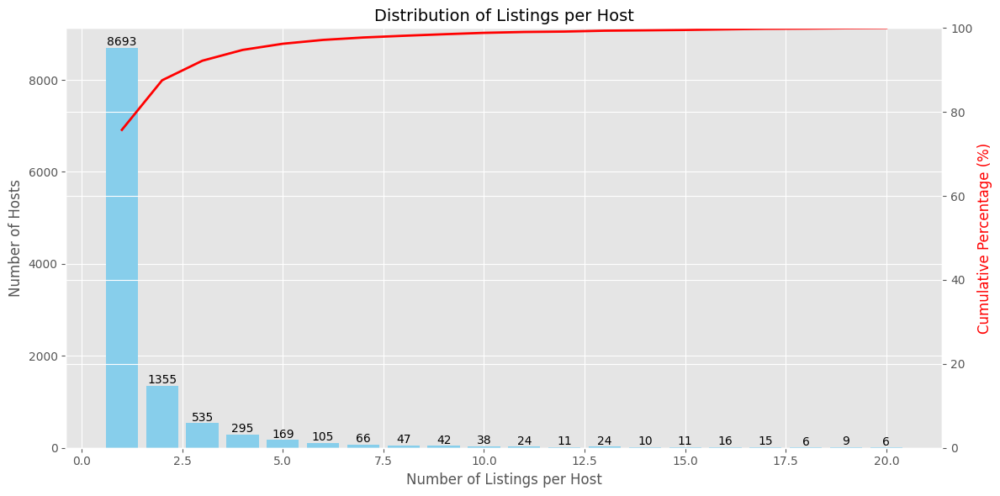

C:\Users\gmont\AppData\Local\Temp\ipykernel_25008\229786557.py:48: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



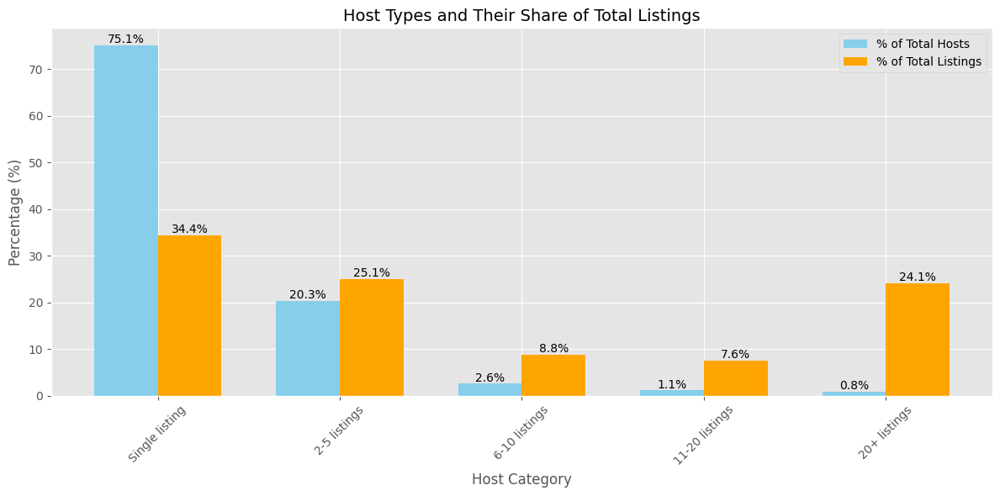

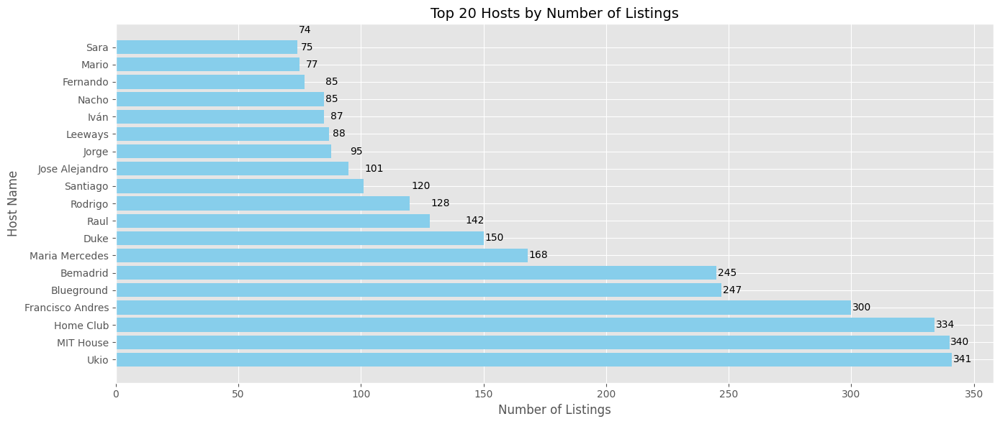

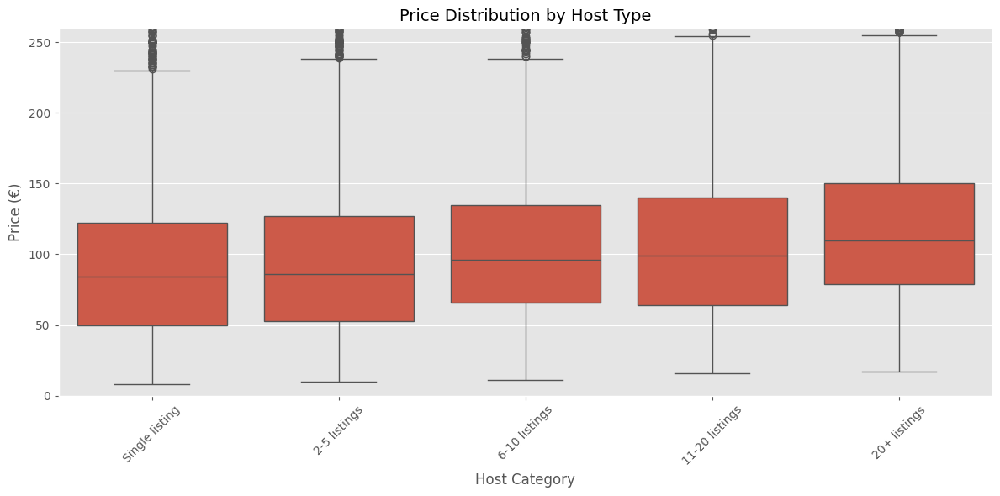

<Figure size 1200x600 with 0 Axes>

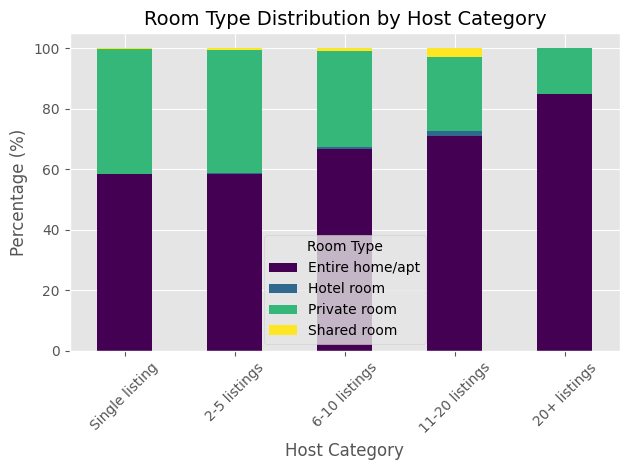

<Figure size 1400x600 with 0 Axes>

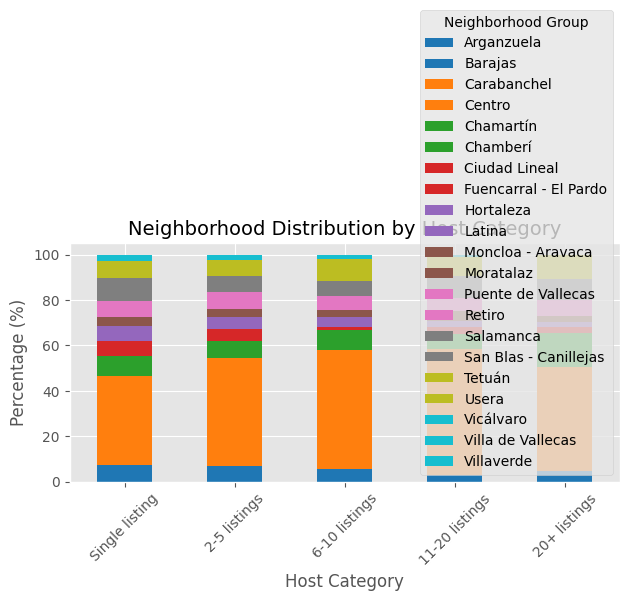

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np


plt.style.use('ggplot')


host_listing_counts = df.groupby('host_id').size().reset_index(name='listing_count')

plt.figure(figsize=(12, 6))
host_distribution = host_listing_counts['listing_count'].value_counts().sort_index()
host_distribution = host_distribution[host_distribution.index <= 20]

ax1 = plt.subplot()
bars = ax1.bar(host_distribution.index, host_distribution.values, color='skyblue')

for i, v in enumerate(host_distribution.values):
    ax1.text(i+1, v+50, str(v), ha='center')

cumulative_percentage = (host_distribution.cumsum() / host_distribution.sum() * 100)
ax2 = ax1.twinx()
ax2.plot(cumulative_percentage.index, cumulative_percentage.values, 'r-', linewidth=2)
ax2.set_ylim(0, 100)

ax1.set_xlabel('Number of Listings per Host')
ax1.set_ylabel('Number of Hosts')
ax2.set_ylabel('Cumulative Percentage (%)', color='r')
plt.title('Distribution of Listings per Host', fontsize=14)
plt.tight_layout()
plt.show()

host_listing_counts['host_category'] = pd.cut(
    host_listing_counts['listing_count'],
    bins=[0, 1, 5, 10, 20, float('inf')],
    labels=['Single listing', '2-5 listings', '6-10 listings', '11-20 listings', '20+ listings']
)

host_category_summary = host_listing_counts.groupby('host_category').agg(
    number_of_hosts=('host_id', 'count'),
    total_listings=('listing_count', 'sum')
).reset_index()

host_category_summary['percentage_of_hosts'] = host_category_summary['number_of_hosts'] / host_category_summary['number_of_hosts'].sum() * 100
host_category_summary['percentage_of_listings'] = host_category_summary['total_listings'] / host_category_summary['total_listings'].sum() * 100

plt.figure(figsize=(12, 6))
x = range(len(host_category_summary))
width = 0.35

plt.bar(x, host_category_summary['percentage_of_hosts'], width, color='skyblue', label='% of Total Hosts')
plt.bar([i + width for i in x], host_category_summary['percentage_of_listings'], width, color='orange', label='% of Total Listings')

plt.xlabel('Host Category')
plt.ylabel('Percentage (%)')
plt.title('Host Types and Their Share of Total Listings', fontsize=14)
plt.xticks([i + width/2 for i in x], host_category_summary['host_category'], rotation=45)
plt.legend()

for i, v in enumerate(host_category_summary['percentage_of_hosts']):
    plt.text(i, v+0.5, f'{v:.1f}%', ha='center')
    
for i, v in enumerate(host_category_summary['percentage_of_listings']):
    plt.text(i + width, v+0.5, f'{v:.1f}%', ha='center')

plt.tight_layout()
plt.show()

top_hosts = host_listing_counts.sort_values('listing_count', ascending=False).head(20)
top_hosts_with_names = top_hosts.merge(df[['host_id', 'host_name']].drop_duplicates(), on='host_id')

plt.figure(figsize=(14, 6))
bars = plt.barh(top_hosts_with_names['host_name'], top_hosts_with_names['listing_count'], color='skyblue')

for i, v in enumerate(top_hosts_with_names['listing_count']):
    plt.text(v+0.5, i, str(v), va='center')

plt.xlabel('Number of Listings')
plt.ylabel('Host Name')
plt.title('Top 20 Hosts by Number of Listings', fontsize=14)
plt.tight_layout()
plt.show()

host_categories = host_listing_counts[['host_id', 'listing_count', 'host_category']]
df_with_host_info = pd.merge(df, host_categories, on='host_id')

plt.figure(figsize=(12, 6))
sns.boxplot(x='host_category', y='price', data=df_with_host_info)
plt.ylim(0, df_with_host_info['price'].quantile(0.95))  
plt.xlabel('Host Category')
plt.ylabel('Price (€)')
plt.title('Price Distribution by Host Type', fontsize=14)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

room_by_host = pd.crosstab(
    df_with_host_info['host_category'], 
    df_with_host_info['room_type'], 
    normalize='index'
) * 100

plt.figure(figsize=(12, 6))
room_by_host.plot(kind='bar', stacked=True, colormap='viridis')
plt.xlabel('Host Category')
plt.ylabel('Percentage (%)')
plt.title('Room Type Distribution by Host Category', fontsize=14)
plt.legend(title='Room Type')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

neighborhood_by_host = pd.crosstab(
    df_with_host_info['host_category'], 
    df_with_host_info['neighbourhood_group'], 
    normalize='index'
) * 100

plt.figure(figsize=(14, 6))
neighborhood_by_host.plot(kind='bar', stacked=True, colormap='tab10')
plt.xlabel('Host Category')
plt.ylabel('Percentage (%)')
plt.title('Neighborhood Distribution by Host Category', fontsize=14)
plt.legend(title='Neighborhood Group')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

## Feature Engineering

### Distancia de Madrid

                                           name neighbourhood_group  \
0                          Bright and airy room              Latina   
1                   Great Vacational Apartments              Centro   
2               Beautiful loft in Madrid Center              Centro   
3               Holiday Apartment Madrid Center              Centro   
4  MAGIC ARTISTIC HOUSE IN THE CENTER OF MADRID              Centro   

   distance_to_center_km center_distance_category  
0               3.640370                   3-5 km  
1               0.412889                   < 1 km  
2               0.652115                   < 1 km  
3               0.528517                   < 1 km  
4               0.528164                   < 1 km  


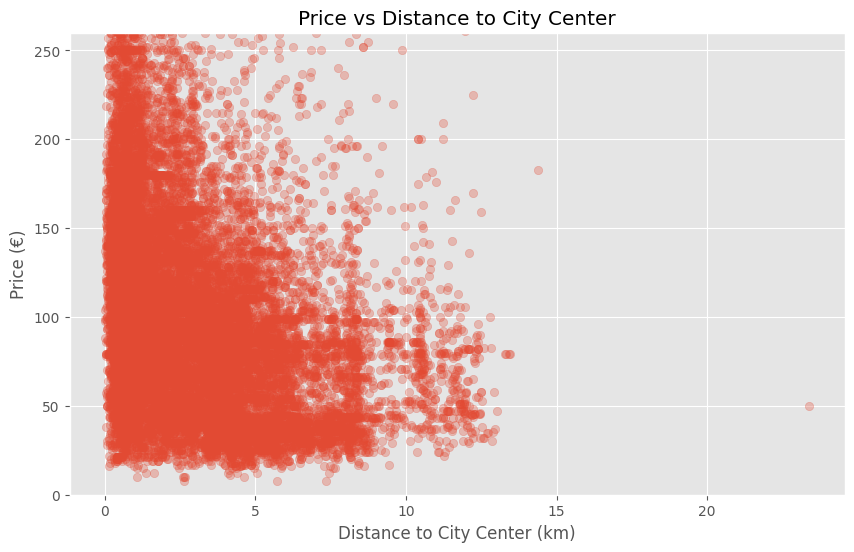

C:\Users\gmont\AppData\Local\Temp\ipykernel_25008\3099392855.py:64: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



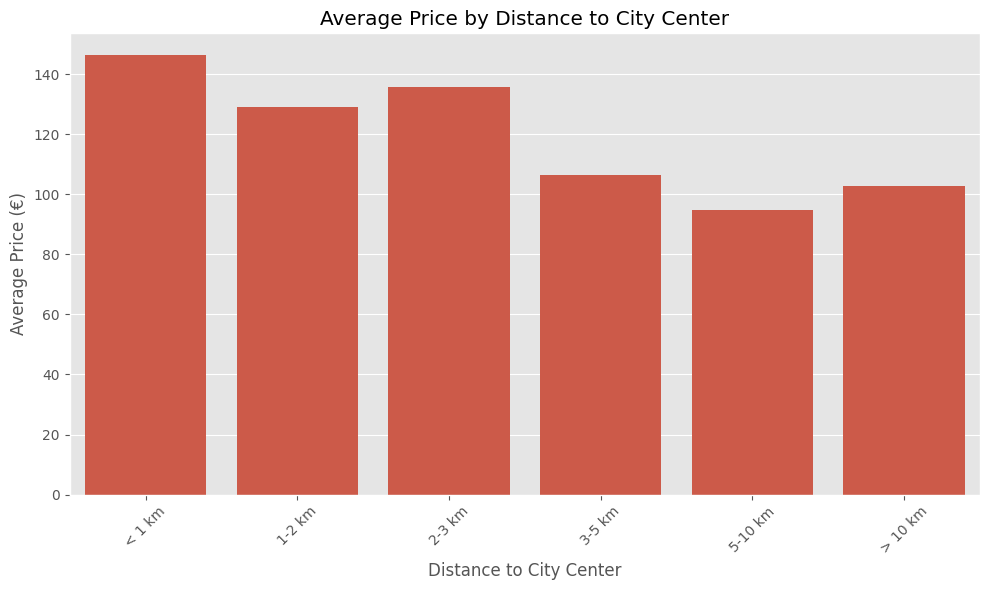

In [ ]:
from math import radians, cos, sin, asin, sqrt

MADRID_CENTER_LAT = 40.41831
MADRID_CENTER_LON = -3.70275

def haversine_distance(lat1, lon1, lat2, lon2):
    """
    Calculate the great circle distance between two points 
    on the earth (specified in decimal degrees)
    """
    lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])
    
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * asin(sqrt(a))
    
    r = 6371
    
    return c * r

df['distance_to_center_km'] = df.apply(
    lambda row: haversine_distance(
        row['latitude'], row['longitude'], 
        MADRID_CENTER_LAT, MADRID_CENTER_LON
    ),
    axis=1
)

distance_bins = [0, 1, 2, 3, 5, 10, float('inf')]
distance_labels = ['< 1 km', '1-2 km', '2-3 km', '3-5 km', '5-10 km', '> 10 km']

df['center_distance_category'] = pd.cut(
    df['distance_to_center_km'], 
    bins=distance_bins, 
    labels=distance_labels
)

print(df[['name', 'neighbourhood_group', 'distance_to_center_km', 'center_distance_category']].head())

import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
plt.scatter(df['distance_to_center_km'], df['price'], alpha=0.3)
plt.xlabel('Distance to City Center (km)')
plt.ylabel('Price (€)')
plt.title('Price vs Distance to City Center')
plt.ylim(0, df['price'].quantile(0.95))  
plt.show()

avg_price_by_distance = df.groupby('center_distance_category')['price'].mean().reset_index()

plt.figure(figsize=(10, 6))
sns.barplot(x='center_distance_category', y='price', data=avg_price_by_distance)
plt.xlabel('Distance to City Center')
plt.ylabel('Average Price (€)')
plt.title('Average Price by Distance to City Center')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
print(df.head(10))

      id                                              name  host_id host_name  \
0  21853                              Bright and airy room    83531     Abdel   
1  30320                       Great Vacational Apartments   130907      Dana   
2  30959                   Beautiful loft in Madrid Center   132883    Angela   
3  40916                   Holiday Apartment Madrid Center   130907      Dana   
4  62423      MAGIC ARTISTIC HOUSE IN THE CENTER OF MADRID   303845    Arturo   
5  70059                     Tu hogar en centro de Madrid.   353616     Diana   
6  70310   Heart of Malasaña Cozy, Quiet & Sunny Apartment   353738    Raquel   
7  72150  Sunny attic duplex flat with terrace next to Sol   364585       Vin   
8  82481                  Retiro Park, Stay at cosy studio   448981  Mercedes   
9  84719                 Cool Apart. (10min Center + WIFI)   259229    Felipe   

  neighbourhood_group neighbourhood  latitude  longitude        room_type  \
0              Latina      Cárm

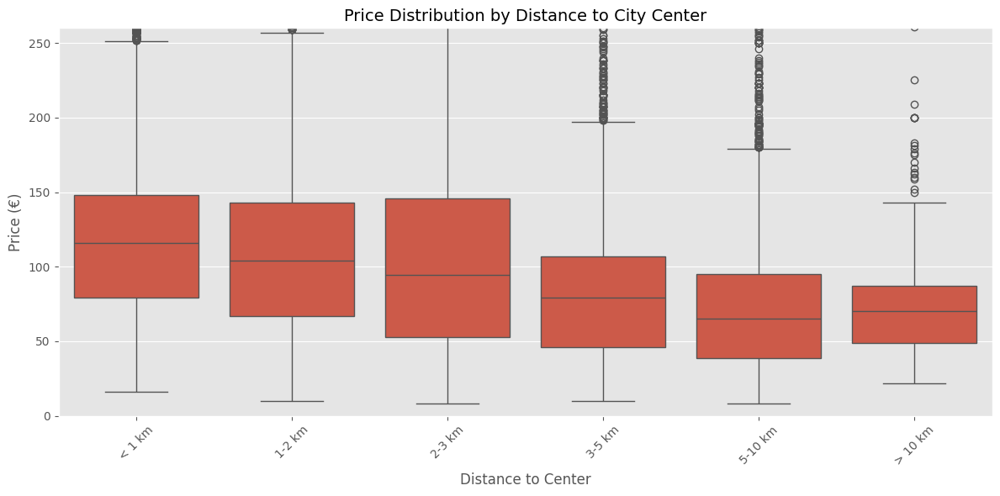

C:\Users\gmont\AppData\Local\Temp\ipykernel_25008\3051055125.py:64: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



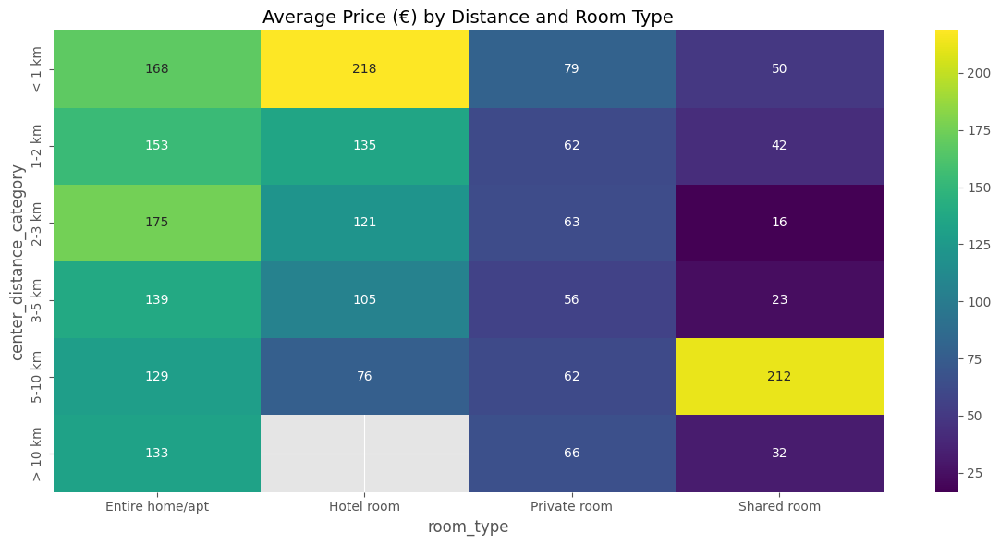

Price premium per km closer to city center: €6.13


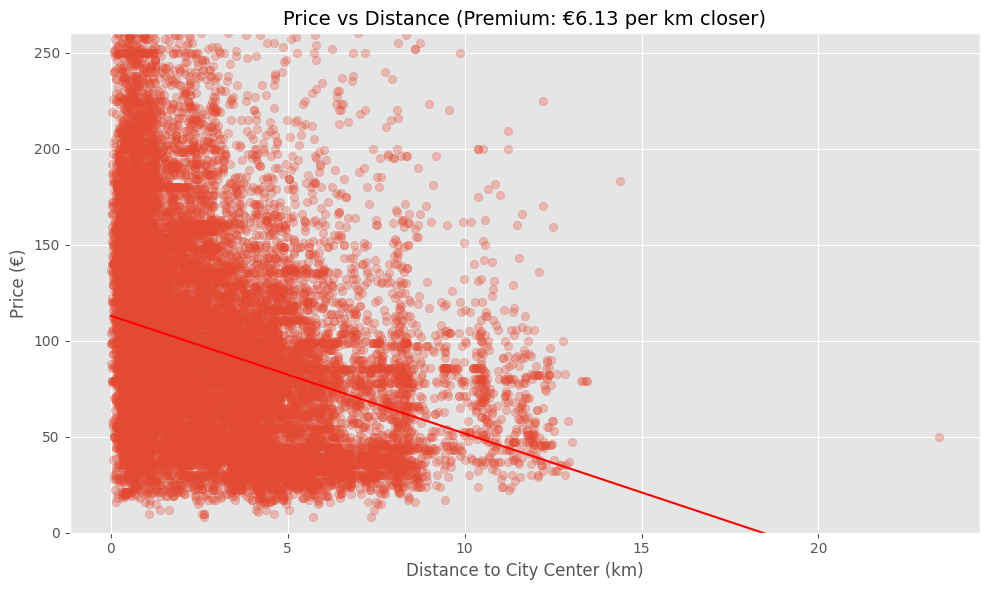

C:\Users\gmont\AppData\Local\Temp\ipykernel_25008\3051055125.py:109: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



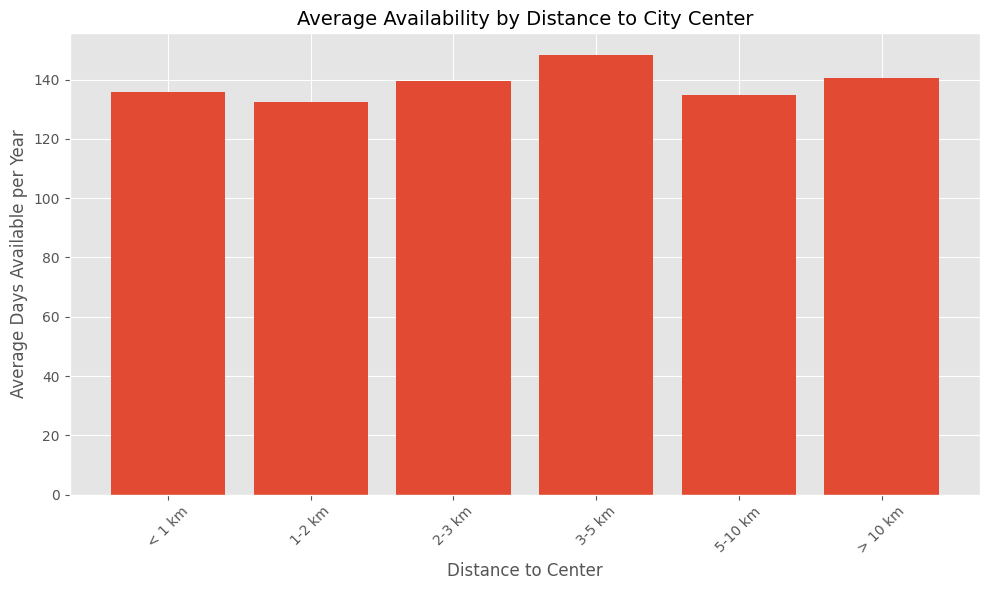

C:\Users\gmont\AppData\Local\Temp\ipykernel_25008\3051055125.py:120: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



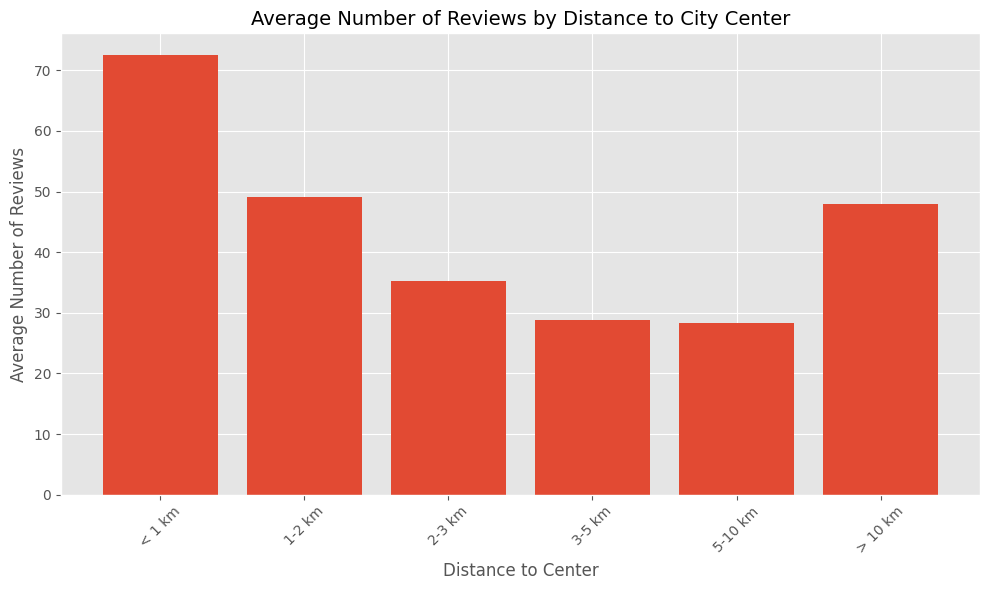

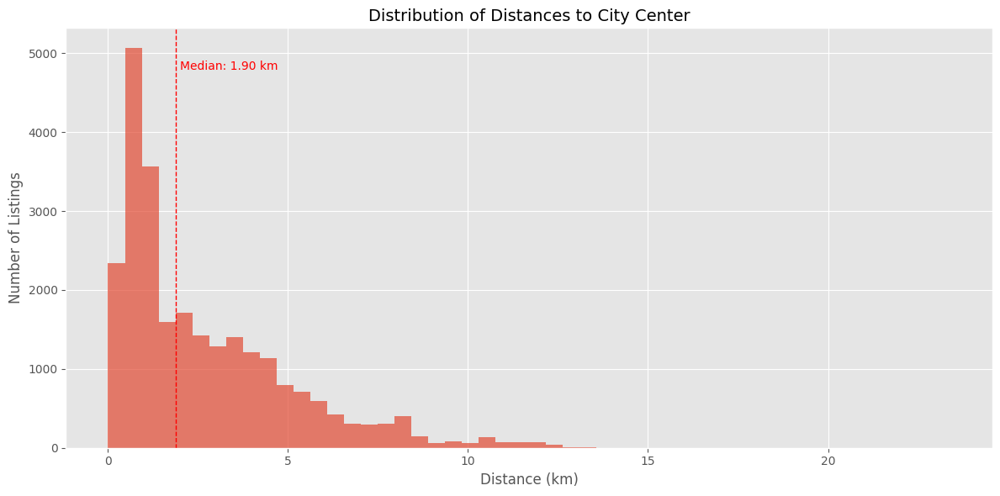

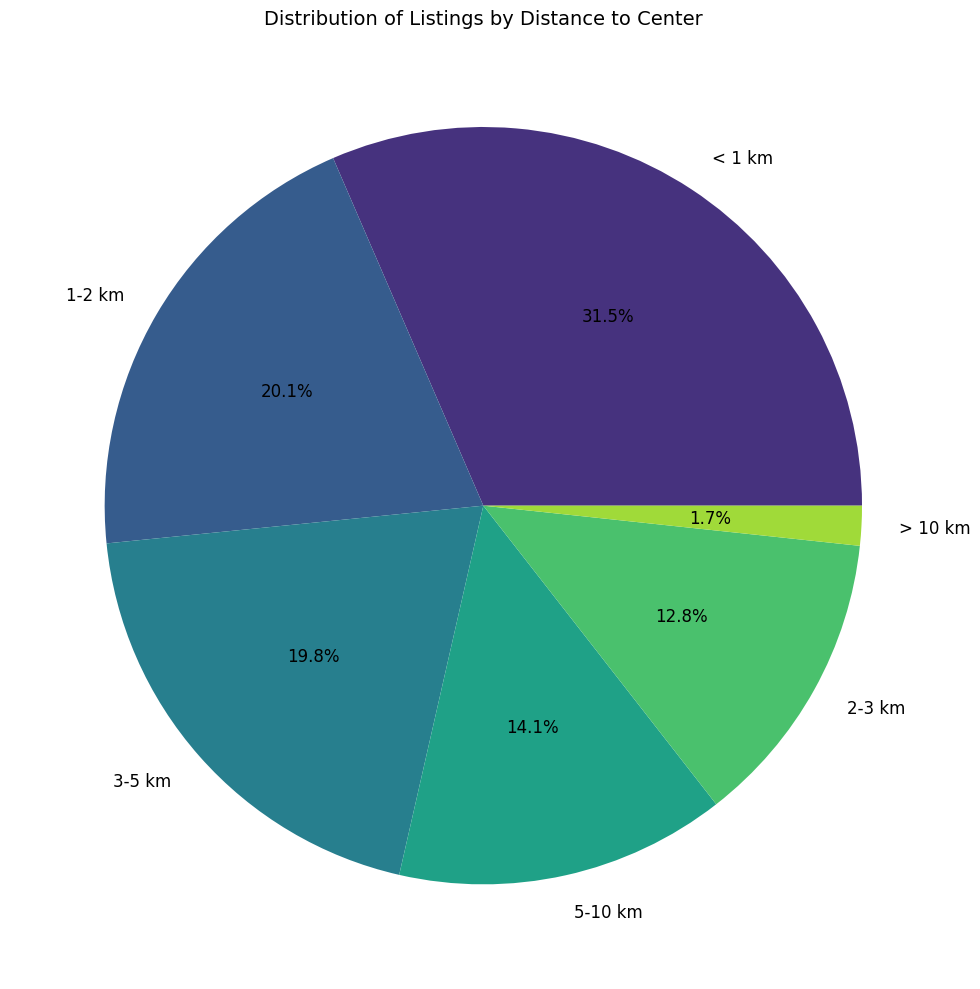

R-squared of complex model (distance + neighborhood + room type): 0.4471


In [ ]:
import numpy as np
import pandas as pd
from math import radians, cos, sin, asin, sqrt
import matplotlib.pyplot as plt
import seaborn as sns

MADRID_CENTER_LAT = 40.41831
MADRID_CENTER_LON = -3.70275

def haversine_distance(lat1, lon1, lat2, lon2):
    """
    Calculate the great circle distance between two points 
    on the earth (specified in decimal degrees)
    """
    lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])
    
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * asin(sqrt(a))
    
    r = 6371
    
    return c * r

df['distance_to_center_km'] = df.apply(
    lambda row: haversine_distance(
        row['latitude'], row['longitude'], 
        MADRID_CENTER_LAT, MADRID_CENTER_LON
    ),
    axis=1
)

distance_bins = [0, 1, 2, 3, 5, 10, float('inf')]
distance_labels = ['< 1 km', '1-2 km', '2-3 km', '3-5 km', '5-10 km', '> 10 km']

df['center_distance_category'] = pd.cut(
    df['distance_to_center_km'], 
    bins=distance_bins, 
    labels=distance_labels
)

plt.figure(figsize=(12, 6))
sns.boxplot(x='center_distance_category', y='price', data=df)
plt.title('Price Distribution by Distance to City Center', fontsize=14)
plt.xlabel('Distance to Center', fontsize=12)
plt.ylabel('Price (€)', fontsize=12)
plt.ylim(0, df['price'].quantile(0.95))  
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 6))
distance_room_price = df.groupby(['center_distance_category', 'room_type'])['price'].mean().unstack()
sns.heatmap(distance_room_price, annot=True, fmt='.0f', cmap='viridis')
plt.title('Average Price (€) by Distance and Room Type', fontsize=14)
plt.tight_layout()
plt.show()

from sklearn.linear_model import LinearRegression

price_filter = df['price'] <= df['price'].quantile(0.95)
model_df = df[price_filter]

X = model_df['distance_to_center_km'].values.reshape(-1, 1)
y = model_df['price'].values

model = LinearRegression()
model.fit(X, y)

price_premium_per_km = -model.coef_[0]  

print(f"Price premium per km closer to city center: €{price_premium_per_km:.2f}")

plt.figure(figsize=(10, 6))
plt.scatter(model_df['distance_to_center_km'], model_df['price'], alpha=0.3)
plt.plot(
    np.sort(model_df['distance_to_center_km']), 
    model.predict(np.sort(model_df['distance_to_center_km']).reshape(-1, 1)), 
    color='red'
)
plt.xlabel('Distance to City Center (km)', fontsize=12)
plt.ylabel('Price (€)', fontsize=12)
plt.title(f'Price vs Distance (Premium: €{price_premium_per_km:.2f} per km closer)', fontsize=14)
plt.ylim(0, model_df['price'].max())
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 6))
avg_availability = df.groupby('center_distance_category')['availability_365'].mean()
plt.bar(avg_availability.index, avg_availability.values)
plt.title('Average Availability by Distance to City Center', fontsize=14)
plt.xlabel('Distance to Center', fontsize=12)
plt.ylabel('Average Days Available per Year', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 6))
avg_reviews = df.groupby('center_distance_category')['number_of_reviews'].mean()
plt.bar(avg_reviews.index, avg_reviews.values)
plt.title('Average Number of Reviews by Distance to City Center', fontsize=14)
plt.xlabel('Distance to Center', fontsize=12)
plt.ylabel('Average Number of Reviews', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 6))
plt.hist(df['distance_to_center_km'], bins=50, alpha=0.7)
plt.axvline(df['distance_to_center_km'].median(), color='red', linestyle='dashed', linewidth=1)
plt.text(df['distance_to_center_km'].median()+0.1, plt.ylim()[1]*0.9, 
         f'Median: {df["distance_to_center_km"].median():.2f} km', color='red')
plt.title('Distribution of Distances to City Center', fontsize=14)
plt.xlabel('Distance (km)', fontsize=12)
plt.ylabel('Number of Listings', fontsize=12)
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 10))
df['center_distance_category'].value_counts().plot.pie(
    autopct='%1.1f%%', 
    textprops={'fontsize': 12},
    colors=sns.color_palette('viridis', len(distance_labels))
)
plt.title('Distribution of Listings by Distance to Center', fontsize=14)
plt.ylabel('')  
plt.tight_layout()
plt.show()

from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

features = ['distance_to_center_km', 'neighbourhood_group', 'room_type']
X_complex = model_df[features]
y_complex = model_df['price']

preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(), ['neighbourhood_group', 'room_type'])
    ],
    remainder='passthrough'
)

pipe = Pipeline([
    ('preprocessor', preprocessor),
    ('regressor', LinearRegression())
])

pipe.fit(X_complex, y_complex)

from sklearn.metrics import r2_score
y_pred = pipe.predict(X_complex)
r2 = r2_score(y_complex, y_pred)
print(f"R-squared of complex model (distance + neighborhood + room type): {r2:.4f}")


### Tourist  attractions

Top 10 attractions by review count: ['El Retiro Park', 'Plaza Mayor', 'Puerta del Sol', 'Mercado de San Miguel', 'Museo Nacional del Prado', 'Royal Palace of Madrid', 'Museo Nacional Centro de Arte Reina Sofía', 'Temple of Debod', 'Puerta de Alcalá', 'Cibeles Fountain']


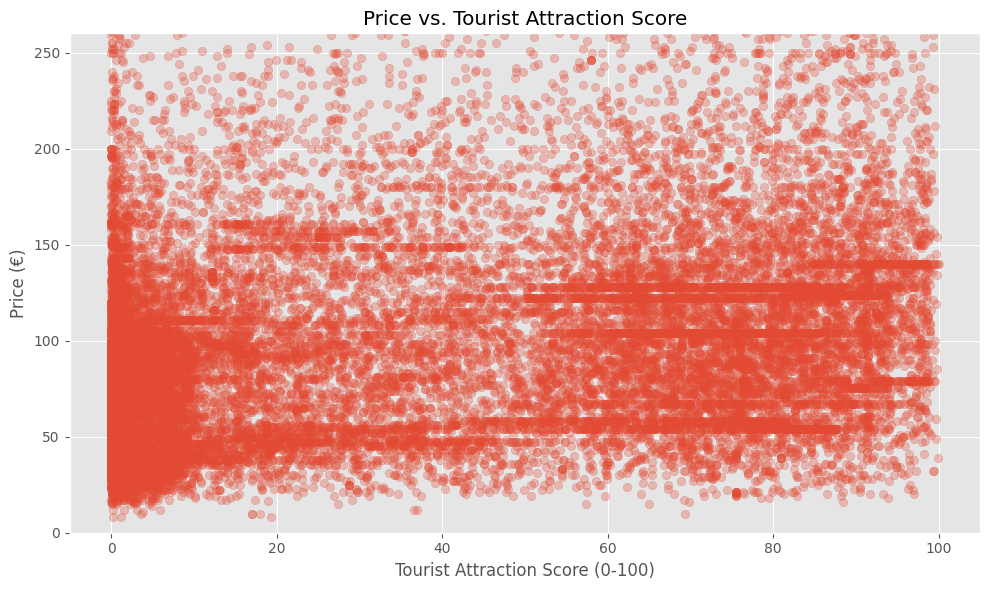

C:\Users\gmont\AppData\Local\Temp\ipykernel_25008\1073495400.py:89: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



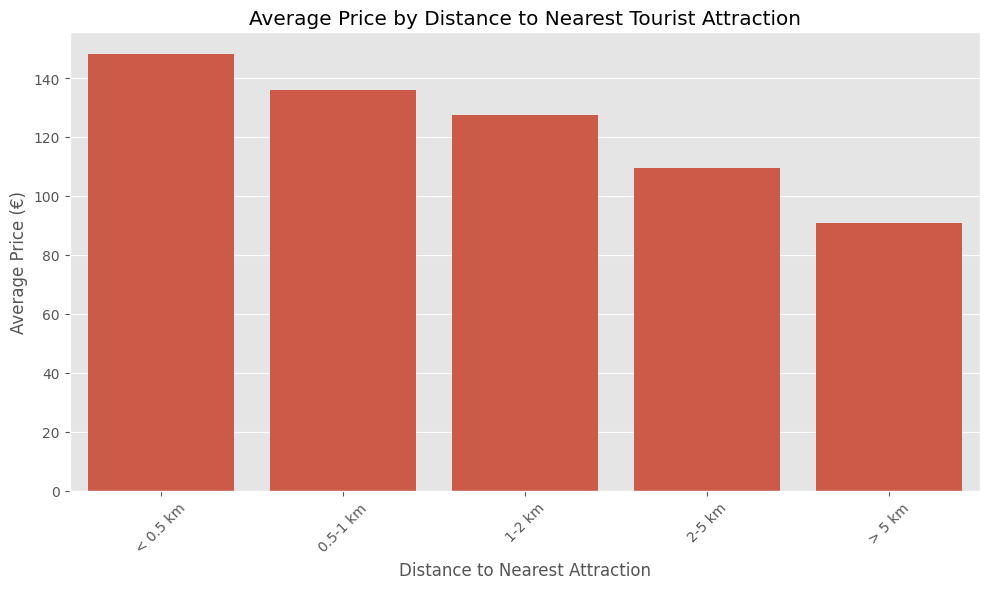

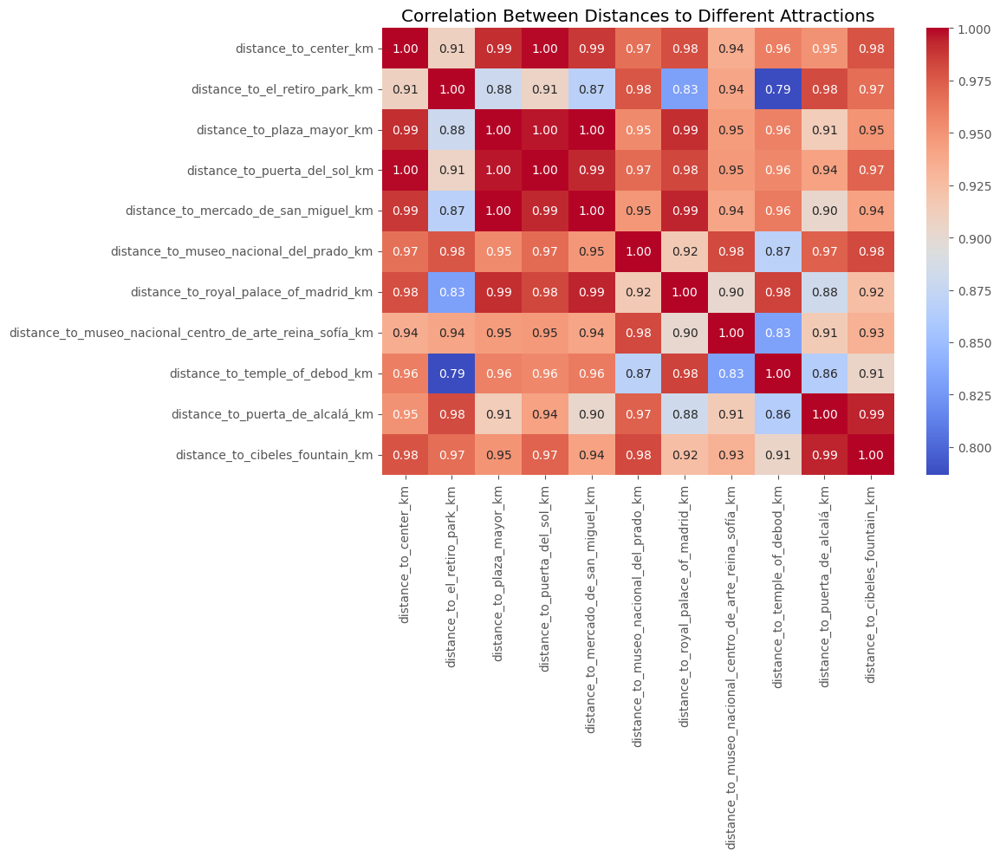

<Figure size 1200x600 with 0 Axes>

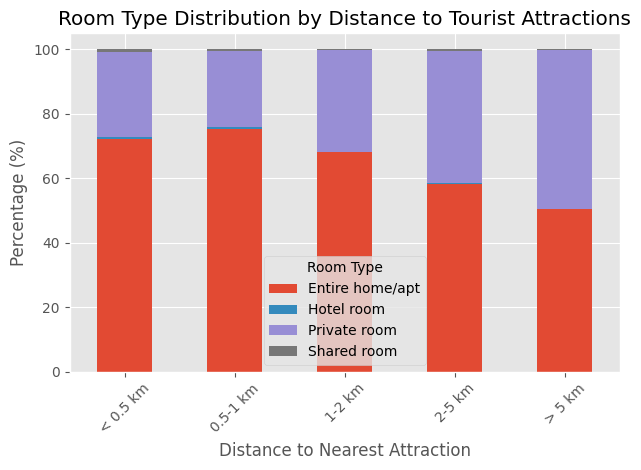

C:\Users\gmont\AppData\Local\Temp\ipykernel_25008\1073495400.py:128: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



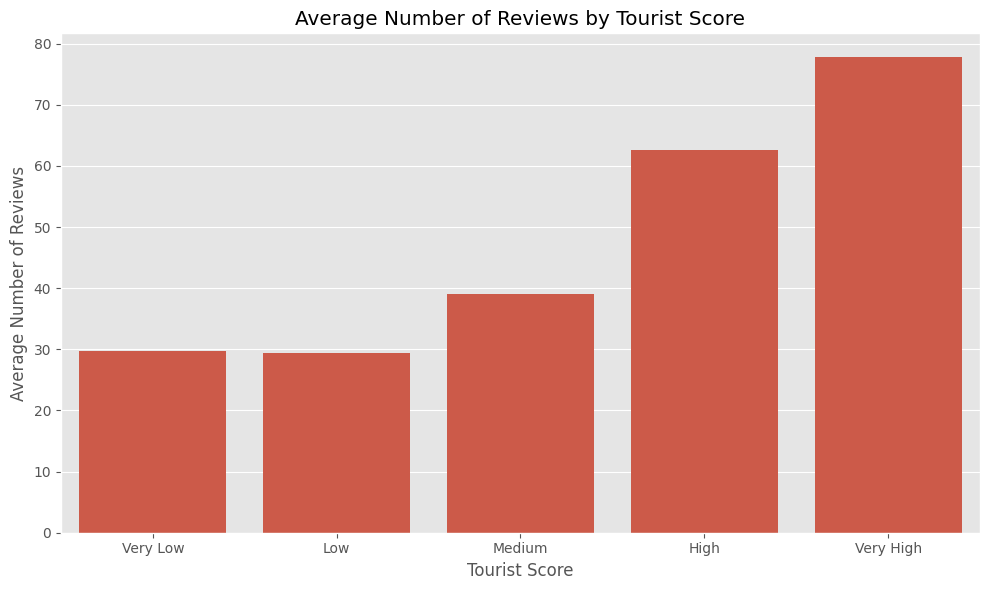

In [ ]:
from math import radians, cos, sin, asin, sqrt
import matplotlib.pyplot as plt
import seaborn as sns

tourist_attractions = pd.read_csv('C:\\Users\\gmont\\OneDrive\\Documentos\\TFM\\data\\caracteristicas_distritos\\lugares_turisticos_madrid_enriquecido.csv')

tourist_attractions.columns = tourist_attractions.columns.str.strip()

def haversine_distance(lat1, lon1, lat2, lon2):
    """
    Calculate the great circle distance between two points 
    on the earth (specified in decimal degrees)
    """
    lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])
    
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * asin(sqrt(a))
    
    r = 6371
    
    return c * r

top_attractions = tourist_attractions.dropna(subset=['reviews']).sort_values('reviews', ascending=False).head(10)
print(f"Top 10 attractions by review count: {list(top_attractions['nombre'])}")

for _, attraction in top_attractions.iterrows():
    attraction_name = attraction['nombre'].replace(' ', '_').lower()
    df[f'distance_to_{attraction_name}_km'] = df.apply(
        lambda row: haversine_distance(
            row['latitude'], row['longitude'],
            attraction['lat'], attraction['lon']
        ),
        axis=1
    )

df['min_distance_to_attraction_km'] = df[[col for col in df.columns if col.startswith('distance_to_') and col != 'distance_to_center_km']].min(axis=1)

attraction_distance_bins = [0, 0.5, 1, 2, 5, float('inf')]
attraction_distance_labels = ['< 0.5 km', '0.5-1 km', '1-2 km', '2-5 km', '> 5 km']

df['min_attraction_distance_category'] = pd.cut(
    df['min_distance_to_attraction_km'],
    bins=attraction_distance_bins,
    labels=attraction_distance_labels
)


df['tourist_score'] = 0
for _, attraction in top_attractions.iterrows():
    attraction_name = attraction['nombre'].replace(' ', '_').lower()
    df['tourist_score'] += np.exp(-df[f'distance_to_{attraction_name}_km'])

df['tourist_score'] = 100 * df['tourist_score'] / df['tourist_score'].max()

plt.figure(figsize=(10, 6))
plt.scatter(df['tourist_score'], df['price'], alpha=0.3)
plt.xlabel('Tourist Attraction Score (0-100)')
plt.ylabel('Price (€)')
plt.title('Price vs. Tourist Attraction Score')
plt.ylim(0, df['price'].quantile(0.95))  
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 6))
avg_price_by_attraction_distance = df.groupby('min_attraction_distance_category')['price'].mean()
sns.barplot(x=avg_price_by_attraction_distance.index, y=avg_price_by_attraction_distance.values)
plt.title('Average Price by Distance to Nearest Tourist Attraction')
plt.xlabel('Distance to Nearest Attraction')
plt.ylabel('Average Price (€)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

distance_columns = [col for col in df.columns if col.startswith('distance_to_')]
correlation_matrix = df[distance_columns].corr()

plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Between Distances to Different Attractions')
plt.tight_layout()
plt.show()

room_by_attraction_distance = pd.crosstab(
    df['min_attraction_distance_category'], 
    df['room_type'], 
    normalize='index'
) * 100

plt.figure(figsize=(12, 6))
room_by_attraction_distance.plot(kind='bar', stacked=True)
plt.title('Room Type Distribution by Distance to Tourist Attractions')
plt.xlabel('Distance to Nearest Attraction')
plt.ylabel('Percentage (%)')
plt.legend(title='Room Type')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

df['tourist_score_category'] = pd.qcut(df['tourist_score'], 5, labels=['Very Low', 'Low', 'Medium', 'High', 'Very High'])

avg_reviews_by_score = df.groupby('tourist_score_category')['number_of_reviews'].mean()

plt.figure(figsize=(10, 6))
sns.barplot(x=avg_reviews_by_score.index, y=avg_reviews_by_score.values)
plt.title('Average Number of Reviews by Tourist Score')
plt.xlabel('Tourist Score')
plt.ylabel('Average Number of Reviews')
plt.tight_layout()
plt.show()

In [ ]:
max_score = df['tourist_score'].max()
min_score = df['tourist_score'].min()

df['distance_to_major_attractions'] = 5 * (1 - (df['tourist_score'] - min_score) / (max_score - min_score))

df['tourist_density_index'] = 1 / (df['distance_to_major_attractions'] + 0.1)

Tourist Density Index - Min: 0.045
Tourist Density Index - Max: 9.376
Tourist Density Index - Mean: 1.130


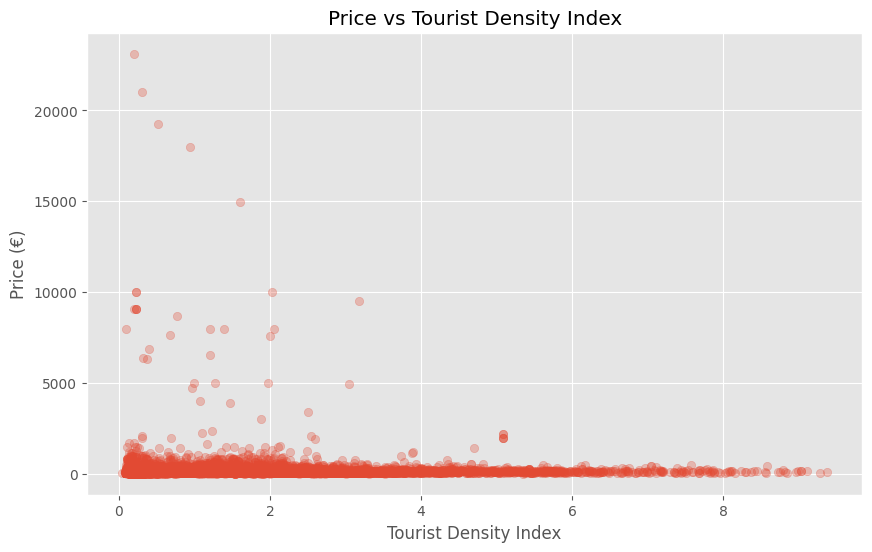

In [ ]:
df['distance_to_major_attractions'] = df['min_distance_to_attraction_km']
df['tourist_density_index'] = 1 / (df['distance_to_major_attractions'] + 0.1)

print(f"Tourist Density Index - Min: {df['tourist_density_index'].min():.3f}")
print(f"Tourist Density Index - Max: {df['tourist_density_index'].max():.3f}")
print(f"Tourist Density Index - Mean: {df['tourist_density_index'].mean():.3f}")

plt.figure(figsize=(10, 6))
plt.scatter(df['tourist_density_index'], df['price'], alpha=0.3)
plt.xlabel('Tourist Density Index')
plt.ylabel('Price (€)')
plt.title('Price vs Tourist Density Index')
plt.show()

In [ ]:
df.head(5)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,...,distance_to_museo_nacional_centro_de_arte_reina_sofía_km,distance_to_temple_of_debod_km,distance_to_puerta_de_alcalá_km,distance_to_cibeles_fountain_km,min_distance_to_attraction_km,min_attraction_distance_category,tourist_score,tourist_score_category,distance_to_major_attractions,tourist_density_index
0,21853,Bright and airy room,83531,Abdel,Latina,Cármenes,40.40381,-3.74130,Private room,29.0,...,3.984024,3.003251,4.800210,4.432213,2.773963,2-5 km,6.500409,Low,2.773963,0.347952
1,30320,Great Vacational Apartments,130907,Dana,Centro,Sol,40.41476,-3.70418,Entire home/apt,140.0,...,1.115157,1.544032,1.430964,1.068252,0.249392,< 0.5 km,94.597186,Very High,0.249392,2.862113
2,30959,Beautiful loft in Madrid Center,132883,Angela,Centro,Embajadores,40.41259,-3.70105,Entire home/apt,104.0,...,0.756811,1.902411,1.328171,1.008511,0.527995,0.5-1 km,84.983206,Very High,0.527995,1.592369
3,40916,Holiday Apartment Madrid Center,130907,Dana,Centro,Universidad,40.42247,-3.70577,Entire home/apt,122.0,...,1.876566,1.030305,1.467977,1.129271,0.642744,0.5-1 km,72.313697,High,0.642744,1.346358
4,62423,MAGIC ARTISTIC HOUSE IN THE CENTER OF MADRID,303845,Arturo,Centro,Justicia,40.41884,-3.69655,Private room,77.0,...,1.226765,1.886421,0.673698,0.298609,0.298609,< 0.5 km,88.412824,Very High,0.298609,2.508727


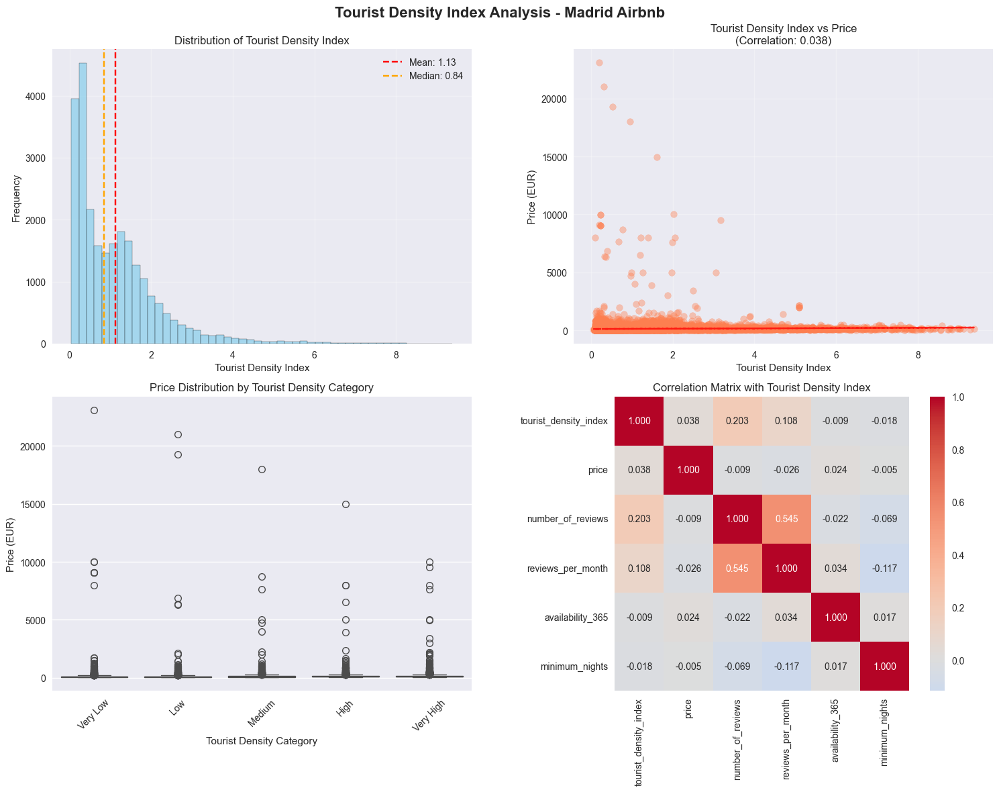

<Figure size 1600x1000 with 0 Axes>

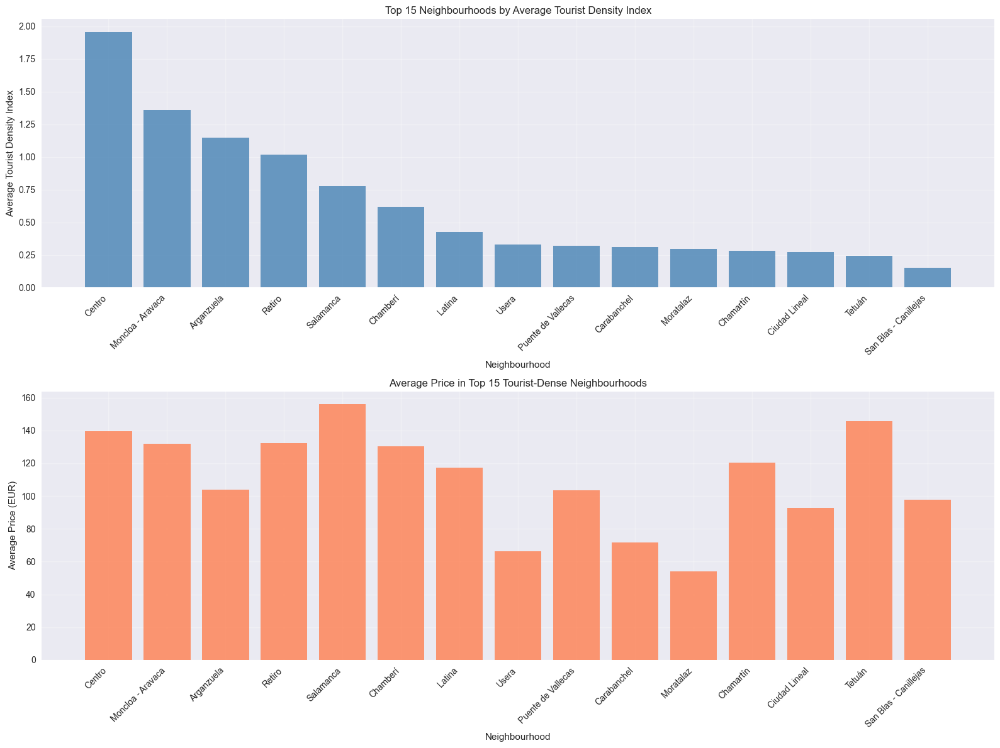

C:\Users\gmont\AppData\Local\Temp\ipykernel_25008\3809801371.py:104: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



Analysis completed successfully!
Charts saved as: tourist_density_analysis.png and tourist_density_by_neighbourhood.png
Data exported to: tourist_density_index_comprehensive_analysis.xlsx

Quick Summary:
   Total listings: 25,288
   Average Tourist Density Index: 1.130
   Correlation Density-Price: 0.038
   Number of neighborhoods analyzed: 21
   Highest density neighborhood: Centro

Top 5 Neighborhoods by Tourist Density:
                         Neighbourhood  Tourist_Density_Index_Mean  \
neighbourhood_group                                                  
Centro                          Centro                       1.957   
Moncloa - Aravaca    Moncloa - Aravaca                       1.359   
Arganzuela                  Arganzuela                       1.150   
Retiro                          Retiro                       1.017   
Salamanca                    Salamanca                       0.776   

                     Price_Mean_EUR  Listings_Count  
neighbourhood_group         

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

df['tourist_density_index'] = 1 / (df['min_distance_to_attraction_km'] + 0.1)

plt.style.use('seaborn-v0_8')
fig, axes = plt.subplots(2, 2, figsize=(15, 12))
fig.suptitle('Tourist Density Index Analysis - Madrid Airbnb', fontsize=16, fontweight='bold')

axes[0,0].hist(df['tourist_density_index'], bins=50, alpha=0.7, color='skyblue', edgecolor='black')
axes[0,0].axvline(df['tourist_density_index'].mean(), color='red', linestyle='--', 
                  label=f'Mean: {df["tourist_density_index"].mean():.2f}')
axes[0,0].axvline(df['tourist_density_index'].median(), color='orange', linestyle='--', 
                  label=f'Median: {df["tourist_density_index"].median():.2f}')
axes[0,0].set_xlabel('Tourist Density Index')
axes[0,0].set_ylabel('Frequency')
axes[0,0].set_title('Distribution of Tourist Density Index')
axes[0,0].legend()
axes[0,0].grid(True, alpha=0.3)

axes[0,1].scatter(df['tourist_density_index'], df['price'], alpha=0.4, color='coral')
z = np.polyfit(df['tourist_density_index'], df['price'], 1)
p = np.poly1d(z)
axes[0,1].plot(df['tourist_density_index'], p(df['tourist_density_index']), "r--", alpha=0.8)
correlation = np.corrcoef(df['tourist_density_index'], df['price'])[0,1]
axes[0,1].set_xlabel('Tourist Density Index')
axes[0,1].set_ylabel('Price (EUR)')
axes[0,1].set_title(f'Tourist Density Index vs Price\n(Correlation: {correlation:.3f})')
axes[0,1].grid(True, alpha=0.3)

df['tourist_density_category'] = pd.qcut(df['tourist_density_index'], 
                                        q=5, 
                                        labels=['Very Low', 'Low', 'Medium', 'High', 'Very High'])

sns.boxplot(data=df, x='tourist_density_category', y='price', ax=axes[1,0])
axes[1,0].set_xlabel('Tourist Density Category')
axes[1,0].set_ylabel('Price (EUR)')
axes[1,0].set_title('Price Distribution by Tourist Density Category')
axes[1,0].tick_params(axis='x', rotation=45)

correlation_vars = ['tourist_density_index', 'price', 'number_of_reviews', 
                   'reviews_per_month', 'availability_365', 'minimum_nights']
existing_vars = [var for var in correlation_vars if var in df.columns]
corr_matrix = df[existing_vars].corr()

sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0, 
            square=True, ax=axes[1,1], fmt='.3f')
axes[1,1].set_title('Correlation Matrix with Tourist Density Index')

plt.tight_layout()
plt.savefig('tourist_density_analysis.png', dpi=300, bbox_inches='tight')
plt.show()

plt.figure(figsize=(16, 10))

top_neighborhoods = df.groupby('neighbourhood_group')['tourist_density_index'].mean().sort_values(ascending=False).head(15)

fig, axes = plt.subplots(2, 1, figsize=(16, 12))

axes[0].bar(range(len(top_neighborhoods)), top_neighborhoods.values, color='steelblue', alpha=0.8)
axes[0].set_xlabel('Neighbourhood')
axes[0].set_ylabel('Average Tourist Density Index')
axes[0].set_title('Top 15 Neighbourhoods by Average Tourist Density Index')
axes[0].set_xticks(range(len(top_neighborhoods)))
axes[0].set_xticklabels(top_neighborhoods.index, rotation=45, ha='right')
axes[0].grid(True, alpha=0.3)

neighborhood_prices = df.groupby('neighbourhood_group')['price'].mean().loc[top_neighborhoods.index]
axes[1].bar(range(len(neighborhood_prices)), neighborhood_prices.values, color='coral', alpha=0.8)
axes[1].set_xlabel('Neighbourhood')
axes[1].set_ylabel('Average Price (EUR)')
axes[1].set_title('Average Price in Top 15 Tourist-Dense Neighbourhoods')
axes[1].set_xticks(range(len(neighborhood_prices)))
axes[1].set_xticklabels(neighborhood_prices.index, rotation=45, ha='right')
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('tourist_density_by_neighbourhood.png', dpi=300, bbox_inches='tight')
plt.show()

summary_by_category = df.groupby('tourist_density_category').agg({
    'tourist_density_index': ['count', 'mean', 'std', 'min', 'max'],
    'price': ['mean', 'median', 'std', 'min', 'max'],
    'number_of_reviews': ['mean', 'median'],
    'reviews_per_month': ['mean', 'median'],
    'availability_365': ['mean', 'median']
}).round(2)

summary_by_category.columns = ['_'.join(col).strip() for col in summary_by_category.columns]

neighborhood_stats = df.groupby('neighbourhood_group').agg({
    'tourist_density_index': ['mean', 'median', 'std', 'count'],
    'price': ['mean', 'median', 'std'],
    'min_distance_to_attraction_km': ['mean', 'median'],
    'number_of_reviews': ['mean', 'median'],
    'availability_365': ['mean', 'median']
}).round(3)

neighborhood_stats.columns = ['_'.join(col).strip() for col in neighborhood_stats.columns]
neighborhood_stats = neighborhood_stats.sort_values('tourist_density_index_mean', ascending=False)

top_10_neighborhoods = neighborhood_stats.head(10).copy()
bottom_10_neighborhoods = neighborhood_stats.tail(10).copy()

room_type_stats = df.groupby('room_type').agg({
    'tourist_density_index': ['mean', 'std', 'count'],
    'price': ['mean', 'median', 'std'],
    'min_distance_to_attraction_km': 'mean'
}).round(2)

room_type_stats.columns = ['_'.join(col).strip() for col in room_type_stats.columns]

quartile_analysis = df['tourist_density_index'].describe()
quartile_analysis = pd.DataFrame(quartile_analysis).T

top_density = df.nlargest(50, 'tourist_density_index')[['neighbourhood_group', 'room_type', 
                                                       'tourist_density_index', 'price', 
                                                       'min_distance_to_attraction_km', 'number_of_reviews']]

bottom_density = df.nsmallest(50, 'tourist_density_index')[['neighbourhood_group', 'room_type', 
                                                           'tourist_density_index', 'price', 
                                                           'min_distance_to_attraction_km', 'number_of_reviews']]

neighborhood_room_stats = df.groupby(['neighbourhood_group', 'room_type']).agg({
    'tourist_density_index': ['mean', 'count'],
    'price': ['mean', 'median'],
    'min_distance_to_attraction_km': 'mean'
}).round(3)

neighborhood_room_stats.columns = ['_'.join(col).strip() for col in neighborhood_room_stats.columns]
neighborhood_room_stats = neighborhood_room_stats.reset_index()

neighborhood_ranking = pd.DataFrame({
    'Rank': range(1, len(neighborhood_stats) + 1),
    'Neighbourhood': neighborhood_stats.index,
    'Tourist_Density_Index_Mean': neighborhood_stats['tourist_density_index_mean'],
    'Tourist_Density_Index_Median': neighborhood_stats['tourist_density_index_median'],
    'Price_Mean_EUR': neighborhood_stats['price_mean'],
    'Price_Median_EUR': neighborhood_stats['price_median'],
    'Listings_Count': neighborhood_stats['tourist_density_index_count'],
    'Distance_to_Attractions_Mean_km': neighborhood_stats['min_distance_to_attraction_km_mean']
})

excel_filename = 'tourist_density_index_comprehensive_analysis.xlsx'

with pd.ExcelWriter(excel_filename, engine='openpyxl') as writer:
    
    executive_summary = pd.DataFrame({
        'Metric': [
            'Total Listings',
            'Average Tourist Density Index',
            'Median Tourist Density Index', 
            'Max Tourist Density Index',
            'Min Tourist Density Index',
            'Standard Deviation Tourist Density Index',
            'Average Price EUR',
            'Median Price EUR',
            'Correlation Density vs Price',
            'Most Tourist Dense Neighborhood',
            'Least Tourist Dense Neighborhood',
            'Number of Neighborhoods',
            'Highest Price Neighborhood',
            'Lowest Price Neighborhood'
        ],
        'Value': [
            len(df),
            f"{df['tourist_density_index'].mean():.3f}",
            f"{df['tourist_density_index'].median():.3f}",
            f"{df['tourist_density_index'].max():.3f}",
            f"{df['tourist_density_index'].min():.3f}",
            f"{df['tourist_density_index'].std():.3f}",
            f"{df['price'].mean():.2f}",
            f"{df['price'].median():.2f}",
            f"{np.corrcoef(df['tourist_density_index'], df['price'])[0,1]:.3f}",
            neighborhood_stats.index[0],
            neighborhood_stats.index[-1],
            len(neighborhood_stats),
            neighborhood_stats.sort_values('price_mean', ascending=False).index[0],
            neighborhood_stats.sort_values('price_mean', ascending=False).index[-1]
        ]
    })
    executive_summary.to_excel(writer, sheet_name='Executive_Summary', index=False)
    
    neighborhood_ranking.to_excel(writer, sheet_name='Neighborhood_Ranking', index=False)
    neighborhood_stats.to_excel(writer, sheet_name='All_Neighborhoods_Stats')
    top_10_neighborhoods.to_excel(writer, sheet_name='Top_10_Neighborhoods')
    bottom_10_neighborhoods.to_excel(writer, sheet_name='Bottom_10_Neighborhoods')
    neighborhood_room_stats.to_excel(writer, sheet_name='Neighborhood_Room_Analysis', index=False)
    summary_by_category.to_excel(writer, sheet_name='Summary_by_Category')
    room_type_stats.to_excel(writer, sheet_name='Room_Type_Stats')
    quartile_analysis.to_excel(writer, sheet_name='Quartile_Analysis')
    top_density.to_excel(writer, sheet_name='Top_50_Properties', index=False)
    bottom_density.to_excel(writer, sheet_name='Bottom_50_Properties', index=False)
    
    sample_data = df[['neighbourhood_group', 'room_type', 'price', 'tourist_density_index', 
                     'tourist_density_category', 'min_distance_to_attraction_km', 
                     'number_of_reviews', 'availability_365']].head(2000)
    sample_data.to_excel(writer, sheet_name='Sample_Data', index=False)

print("Analysis completed successfully!")
print(f"Charts saved as: tourist_density_analysis.png and tourist_density_by_neighbourhood.png")
print(f"Data exported to: {excel_filename}")
print(f"\nQuick Summary:")
print(f"   Total listings: {len(df):,}")
print(f"   Average Tourist Density Index: {df['tourist_density_index'].mean():.3f}")
print(f"   Correlation Density-Price: {np.corrcoef(df['tourist_density_index'], df['price'])[0,1]:.3f}")
print(f"   Number of neighborhoods analyzed: {len(neighborhood_stats)}")
print(f"   Highest density neighborhood: {neighborhood_stats.index[0]}")

print(f"\nTop 5 Neighborhoods by Tourist Density:")
print(neighborhood_ranking.head()[['Neighbourhood', 'Tourist_Density_Index_Mean', 'Price_Mean_EUR', 'Listings_Count']])

print(f"\nStatistics by Tourist Density Category:")
print(summary_by_category[['tourist_density_index_count', 'tourist_density_index_mean', 'price_mean']].head())

C:\Users\gmont\AppData\Local\Temp\ipykernel_25008\3700378127.py:47: MatplotlibDeprecationWarning:

The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.



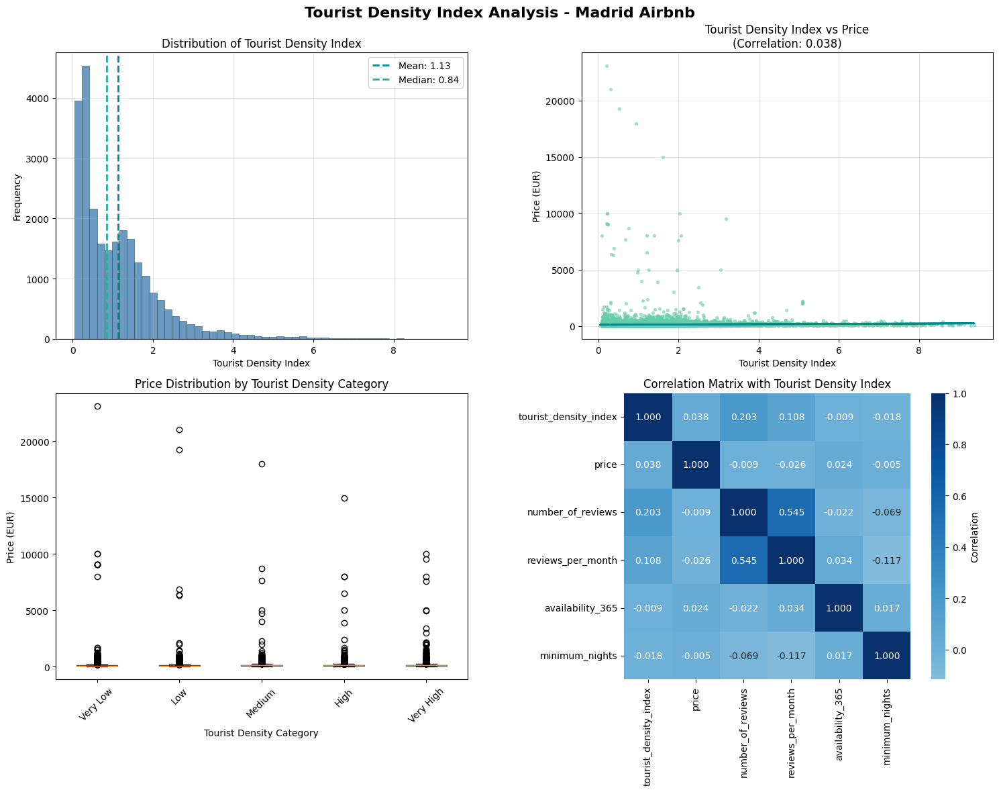

<Figure size 1600x1200 with 0 Axes>

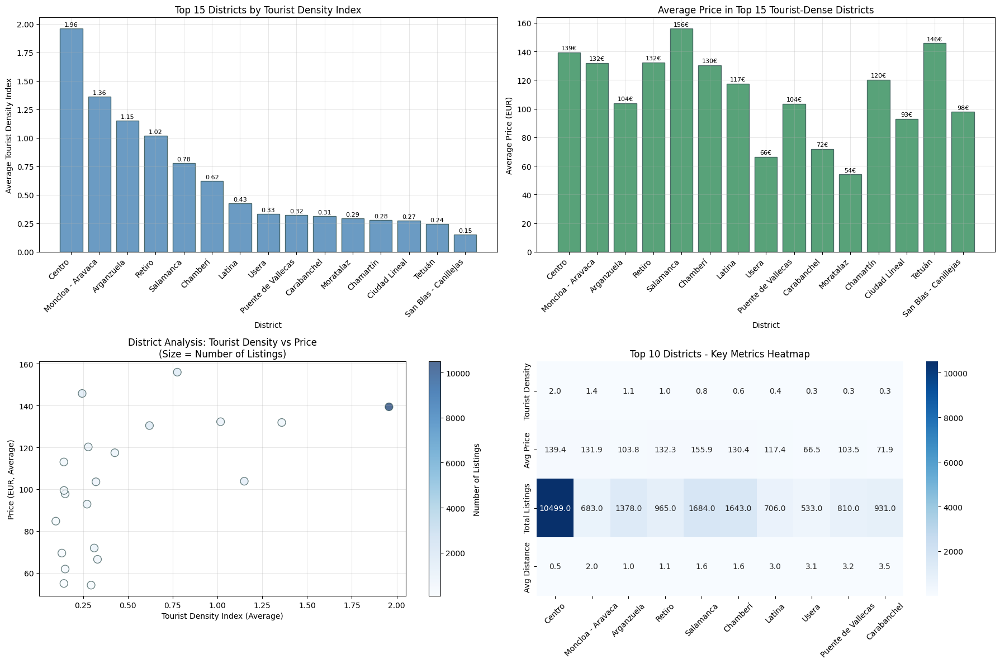

Analysis completed successfully!
Charts saved as: tourist_density_analysis.png and tourist_density_district_analysis.png
Power BI ready data exported to: tourist_density_powerbi_ready.xlsx

Power BI Data Summary:
   Districts analyzed: 21
   Total listings: 25,288
   Highest density district: Centro
   Coordinates included: Latitude and Longitude for mapping

Key columns for Power BI mapping:
   - District_Latitude, District_Longitude (for district-level maps)
   - Tourist_Density_Index_Avg (for color coding)
   - Price_Avg_EUR (for size or secondary color)
   - Total_Listings (for bubble size)

Preview of district data for Power BI:
        District_Name  District_Latitude  District_Longitude  \
3              Centro            40.4169             -3.7040   
10  Moncloa - Aravaca            40.4373             -3.7254   
0          Arganzuela            40.4015             -3.6993   
13             Retiro            40.4101             -3.6765   
14          Salamanca            40.42

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

df['tourist_density_index'] = 1 / (df['min_distance_to_attraction_km'] + 0.1)

blue_palette = ['#0A2F51', '#0E4B99', '#2E8B57', '#66CDAA', '#87CEEB', '#4682B4']
green_palette = ['#2F4F4F', '#008B8B', '#20B2AA', '#48D1CC', '#40E0D0', '#5F9EA0']

plt.style.use('default')
fig, axes = plt.subplots(2, 2, figsize=(15, 12))
fig.suptitle('Tourist Density Index Analysis - Madrid Airbnb', fontsize=16, fontweight='bold')

axes[0,0].hist(df['tourist_density_index'], bins=50, alpha=0.8, color='#4682B4', edgecolor='#2F4F4F', linewidth=0.5)
axes[0,0].axvline(df['tourist_density_index'].mean(), color='#008B8B', linestyle='--', linewidth=2,
                  label=f'Mean: {df["tourist_density_index"].mean():.2f}')
axes[0,0].axvline(df['tourist_density_index'].median(), color='#20B2AA', linestyle='--', linewidth=2,
                  label=f'Median: {df["tourist_density_index"].median():.2f}')
axes[0,0].set_xlabel('Tourist Density Index')
axes[0,0].set_ylabel('Frequency')
axes[0,0].set_title('Distribution of Tourist Density Index')
axes[0,0].legend()
axes[0,0].grid(True, alpha=0.3)

axes[0,1].scatter(df['tourist_density_index'], df['price'], alpha=0.5, color='#66CDAA', s=8)
z = np.polyfit(df['tourist_density_index'], df['price'], 1)
p = np.poly1d(z)
axes[0,1].plot(df['tourist_density_index'], p(df['tourist_density_index']), color='#008B8B', linewidth=2)
correlation = np.corrcoef(df['tourist_density_index'], df['price'])[0,1]
axes[0,1].set_xlabel('Tourist Density Index')
axes[0,1].set_ylabel('Price (EUR)')
axes[0,1].set_title(f'Tourist Density Index vs Price\n(Correlation: {correlation:.3f})')
axes[0,1].grid(True, alpha=0.3)

df['tourist_density_category'] = pd.qcut(df['tourist_density_index'], 
                                        q=5, 
                                        labels=['Very Low', 'Low', 'Medium', 'High', 'Very High'])

box_plot = axes[1,0].boxplot([df[df['tourist_density_category'] == cat]['price'].values 
                              for cat in df['tourist_density_category'].cat.categories],
                             patch_artist=True, labels=df['tourist_density_category'].cat.categories)

colors = ['#87CEEB', '#66CDAA', '#4682B4', '#2E8B57', '#008B8B']
for patch, color in zip(box_plot['boxes'], colors):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)

axes[1,0].set_xlabel('Tourist Density Category')
axes[1,0].set_ylabel('Price (EUR)')
axes[1,0].set_title('Price Distribution by Tourist Density Category')
axes[1,0].tick_params(axis='x', rotation=45)

correlation_vars = ['tourist_density_index', 'price', 'number_of_reviews', 
                   'reviews_per_month', 'availability_365', 'minimum_nights']
existing_vars = [var for var in correlation_vars if var in df.columns]
corr_matrix = df[existing_vars].corr()

sns.heatmap(corr_matrix, annot=True, cmap='Blues', center=0, 
            square=True, ax=axes[1,1], fmt='.3f', cbar_kws={'label': 'Correlation'})
axes[1,1].set_title('Correlation Matrix with Tourist Density Index')

plt.tight_layout()
plt.savefig('tourist_density_analysis.png', dpi=300, bbox_inches='tight')
plt.show()


district_analysis = df.groupby('neighbourhood_group').agg({
    'tourist_density_index': ['mean', 'median', 'std', 'min', 'max', 'count'],
    'price': ['mean', 'median', 'std', 'min', 'max'],
    'min_distance_to_attraction_km': ['mean', 'median', 'min'],
    'number_of_reviews': ['mean', 'median', 'sum'],
    'reviews_per_month': ['mean', 'median'],
    'availability_365': ['mean', 'median'],
    'latitude': ['mean'],  
    'longitude': ['mean']  
}).round(4)

district_analysis.columns = ['_'.join(col).strip() for col in district_analysis.columns]

district_analysis = district_analysis.reset_index()

district_powerbi = district_analysis.rename(columns={
    'neighbourhood_group': 'District_Name',
    'tourist_density_index_mean': 'Tourist_Density_Index_Avg',
    'tourist_density_index_median': 'Tourist_Density_Index_Median',
    'tourist_density_index_std': 'Tourist_Density_Index_StdDev',
    'tourist_density_index_min': 'Tourist_Density_Index_Min',
    'tourist_density_index_max': 'Tourist_Density_Index_Max',
    'tourist_density_index_count': 'Total_Listings',
    'price_mean': 'Price_Avg_EUR',
    'price_median': 'Price_Median_EUR',
    'price_std': 'Price_StdDev_EUR',
    'price_min': 'Price_Min_EUR',
    'price_max': 'Price_Max_EUR',
    'min_distance_to_attraction_km_mean': 'Avg_Distance_to_Attractions_km',
    'min_distance_to_attraction_km_median': 'Median_Distance_to_Attractions_km',
    'min_distance_to_attraction_km_min': 'Min_Distance_to_Attractions_km',
    'number_of_reviews_mean': 'Avg_Reviews_per_Listing',
    'number_of_reviews_median': 'Median_Reviews_per_Listing',
    'number_of_reviews_sum': 'Total_Reviews_District',
    'reviews_per_month_mean': 'Avg_Reviews_per_Month',
    'reviews_per_month_median': 'Median_Reviews_per_Month',
    'availability_365_mean': 'Avg_Availability_Days',
    'availability_365_median': 'Median_Availability_Days',
    'latitude_mean': 'District_Latitude',
    'longitude_mean': 'District_Longitude'
})

district_powerbi['Tourist_Density_Rank'] = district_powerbi['Tourist_Density_Index_Avg'].rank(ascending=False, method='dense').astype(int)
district_powerbi['Price_Rank'] = district_powerbi['Price_Avg_EUR'].rank(ascending=False, method='dense').astype(int)

district_powerbi['Tourist_Density_Category'] = pd.qcut(
    district_powerbi['Tourist_Density_Index_Avg'], 
    q=5, 
    labels=['Very Low', 'Low', 'Medium', 'High', 'Very High']
)

district_powerbi['Price_Category'] = pd.qcut(
    district_powerbi['Price_Avg_EUR'], 
    q=5, 
    labels=['Very Low', 'Low', 'Medium', 'High', 'Very High']
)

district_powerbi['Listings_Density_per_km2'] = district_powerbi['Total_Listings'] / 10  

powerbi_columns = [
    'District_Name', 'District_Latitude', 'District_Longitude',
    'Tourist_Density_Index_Avg', 'Tourist_Density_Index_Median', 'Tourist_Density_Category', 'Tourist_Density_Rank',
    'Price_Avg_EUR', 'Price_Median_EUR', 'Price_Category', 'Price_Rank',
    'Total_Listings', 'Listings_Density_per_km2',
    'Avg_Distance_to_Attractions_km', 'Min_Distance_to_Attractions_km',
    'Total_Reviews_District', 'Avg_Reviews_per_Listing', 'Avg_Reviews_per_Month',
    'Avg_Availability_Days', 'Tourist_Density_Index_StdDev', 'Price_StdDev_EUR'
]

district_powerbi_final = district_powerbi[powerbi_columns].sort_values('Tourist_Density_Rank')

listing_powerbi = df[['id', 'latitude', 'longitude', 'neighbourhood_group', 'room_type', 
                     'price', 'tourist_density_index', 'tourist_density_category',
                     'min_distance_to_attraction_km', 'number_of_reviews', 
                     'reviews_per_month', 'availability_365', 'minimum_nights']].copy()

listing_powerbi = listing_powerbi.rename(columns={
    'id': 'Listing_ID',
    'latitude': 'Listing_Latitude',
    'longitude': 'Listing_Longitude',
    'neighbourhood_group': 'District_Name',
    'room_type': 'Room_Type',
    'price': 'Price_EUR',
    'tourist_density_index': 'Tourist_Density_Index',
    'tourist_density_category': 'Tourist_Density_Category',
    'min_distance_to_attraction_km': 'Distance_to_Attractions_km',
    'number_of_reviews': 'Total_Reviews',
    'reviews_per_month': 'Reviews_per_Month',
    'availability_365': 'Availability_Days',
    'minimum_nights': 'Minimum_Nights'
})

plt.figure(figsize=(16, 12))

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

top_15_districts = district_powerbi_final.head(15)
bars1 = axes[0,0].bar(range(len(top_15_districts)), top_15_districts['Tourist_Density_Index_Avg'], 
                      color='#4682B4', alpha=0.8, edgecolor='#2F4F4F')
axes[0,0].set_xlabel('District')
axes[0,0].set_ylabel('Average Tourist Density Index')
axes[0,0].set_title('Top 15 Districts by Tourist Density Index')
axes[0,0].set_xticks(range(len(top_15_districts)))
axes[0,0].set_xticklabels(top_15_districts['District_Name'], rotation=45, ha='right')
axes[0,0].grid(True, alpha=0.3)

for i, bar in enumerate(bars1):
    height = bar.get_height()
    axes[0,0].text(bar.get_x() + bar.get_width()/2., height + 0.01,
                   f'{height:.2f}', ha='center', va='bottom', fontsize=8)

bars2 = axes[0,1].bar(range(len(top_15_districts)), top_15_districts['Price_Avg_EUR'], 
                      color='#2E8B57', alpha=0.8, edgecolor='#2F4F4F')
axes[0,1].set_xlabel('District')
axes[0,1].set_ylabel('Average Price (EUR)')
axes[0,1].set_title('Average Price in Top 15 Tourist-Dense Districts')
axes[0,1].set_xticks(range(len(top_15_districts)))
axes[0,1].set_xticklabels(top_15_districts['District_Name'], rotation=45, ha='right')
axes[0,1].grid(True, alpha=0.3)

for i, bar in enumerate(bars2):
    height = bar.get_height()
    axes[0,1].text(bar.get_x() + bar.get_width()/2., height + 1,
                   f'{height:.0f}€', ha='center', va='bottom', fontsize=8)

scatter = axes[1,0].scatter(district_powerbi_final['Tourist_Density_Index_Avg'], 
                           district_powerbi_final['Price_Avg_EUR'],
                           c=district_powerbi_final['Total_Listings'], 
                           cmap='Blues', s=100, alpha=0.7, edgecolors='#2F4F4F')
axes[1,0].set_xlabel('Tourist Density Index (Average)')
axes[1,0].set_ylabel('Price (EUR, Average)')
axes[1,0].set_title('District Analysis: Tourist Density vs Price\n(Size = Number of Listings)')
axes[1,0].grid(True, alpha=0.3)
plt.colorbar(scatter, ax=axes[1,0], label='Number of Listings')

top_10_for_heatmap = district_powerbi_final.head(10)
heatmap_data = top_10_for_heatmap[['Tourist_Density_Index_Avg', 'Price_Avg_EUR', 
                                  'Total_Listings', 'Avg_Distance_to_Attractions_km']].T

sns.heatmap(heatmap_data, annot=True, fmt='.1f', cmap='Blues', 
            xticklabels=top_10_for_heatmap['District_Name'],
            yticklabels=['Tourist Density', 'Avg Price', 'Total Listings', 'Avg Distance'],
            ax=axes[1,1])
axes[1,1].set_title('Top 10 Districts - Key Metrics Heatmap')
axes[1,1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.savefig('tourist_density_district_analysis.png', dpi=300, bbox_inches='tight')
plt.show()

excel_filename = 'tourist_density_powerbi_ready.xlsx'

with pd.ExcelWriter(excel_filename, engine='openpyxl') as writer:
    
    district_powerbi_final.to_excel(writer, sheet_name='District_Data_PowerBI', index=False)
    
    listing_sample = listing_powerbi.sample(n=min(5000, len(listing_powerbi)), random_state=42)
    listing_sample.to_excel(writer, sheet_name='Listing_Data_PowerBI', index=False)
    
    metadata = pd.DataFrame({
        'Field_Name': district_powerbi_final.columns,
        'Data_Type': [str(district_powerbi_final[col].dtype) for col in district_powerbi_final.columns],
        'Description': [
            'Name of the district/neighborhood',
            'Central latitude coordinate of district', 
            'Central longitude coordinate of district',
            'Average tourist density index for district',
            'Median tourist density index for district',
            'Category based on tourist density quintiles',
            'Ranking by tourist density (1=highest)',
            'Average price in EUR for district',
            'Median price in EUR for district', 
            'Category based on price quintiles',
            'Ranking by price (1=highest)',
            'Total number of Airbnb listings',
            'Approximate listings per km2',
            'Average distance to tourist attractions',
            'Minimum distance to tourist attractions',
            'Total reviews across all listings',
            'Average reviews per listing',
            'Average reviews per month',
            'Average availability days per year',
            'Standard deviation of tourist density',
            'Standard deviation of prices'
        ]
    })
    metadata.to_excel(writer, sheet_name='Metadata', index=False)
    
    executive_summary = pd.DataFrame({
        'Metric': [
            'Total Districts Analyzed',
            'Total Listings Analyzed',
            'Highest Tourist Density District',
            'Lowest Tourist Density District',
            'Highest Price District',
            'Lowest Price District',
            'Average Tourist Density Index',
            'Average Price EUR',
            'Correlation Tourist Density vs Price'
        ],
        'Value': [
            len(district_powerbi_final),
            district_powerbi_final['Total_Listings'].sum(),
            district_powerbi_final.iloc[0]['District_Name'],
            district_powerbi_final.iloc[-1]['District_Name'],
            district_powerbi_final.sort_values('Price_Avg_EUR', ascending=False).iloc[0]['District_Name'],
            district_powerbi_final.sort_values('Price_Avg_EUR', ascending=False).iloc[-1]['District_Name'],
            f"{district_powerbi_final['Tourist_Density_Index_Avg'].mean():.3f}",
            f"{district_powerbi_final['Price_Avg_EUR'].mean():.2f}",
            f"{np.corrcoef(district_powerbi_final['Tourist_Density_Index_Avg'], district_powerbi_final['Price_Avg_EUR'])[0,1]:.3f}"
        ]
    })
    executive_summary.to_excel(writer, sheet_name='Executive_Summary', index=False)

print("Analysis completed successfully!")
print(f"Charts saved as: tourist_density_analysis.png and tourist_density_district_analysis.png")
print(f"Power BI ready data exported to: {excel_filename}")
print(f"\nPower BI Data Summary:")
print(f"   Districts analyzed: {len(district_powerbi_final)}")
print(f"   Total listings: {district_powerbi_final['Total_Listings'].sum():,}")
print(f"   Highest density district: {district_powerbi_final.iloc[0]['District_Name']}")
print(f"   Coordinates included: Latitude and Longitude for mapping")
print(f"\nKey columns for Power BI mapping:")
print("   - District_Latitude, District_Longitude (for district-level maps)")
print("   - Tourist_Density_Index_Avg (for color coding)")
print("   - Price_Avg_EUR (for size or secondary color)")
print("   - Total_Listings (for bubble size)")

print(f"\nPreview of district data for Power BI:")
print(district_powerbi_final[['District_Name', 'District_Latitude', 'District_Longitude', 
                             'Tourist_Density_Index_Avg', 'Price_Avg_EUR', 'Total_Listings']].head())

## Pattern Detection

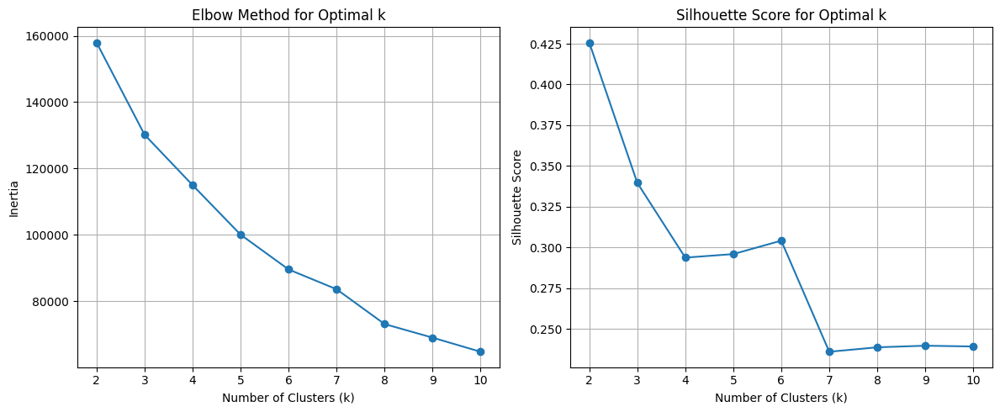

Cluster Centers:
         distance_to_museo_nacional_del_prado_km  \
cluster                                            
0                                           1.48   
1                                           8.02   
2                                           3.99   
3                                           1.34   

         distance_to_royal_palace_of_madrid_km  \
cluster                                          
0                                         1.49   
1                                         8.62   
2                                         4.41   
3                                         1.40   

         distance_to_museo_nacional_centro_de_arte_reina_sofía_km  \
cluster                                                             
0                                                     1.63          
1                                                     8.32          
2                                                     4.17          
3                       

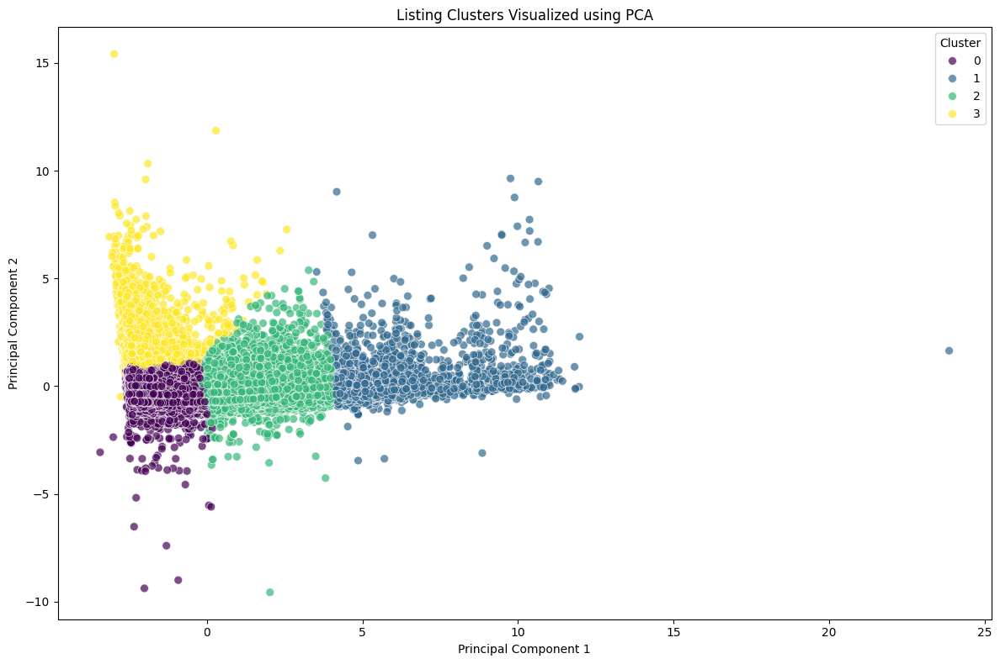

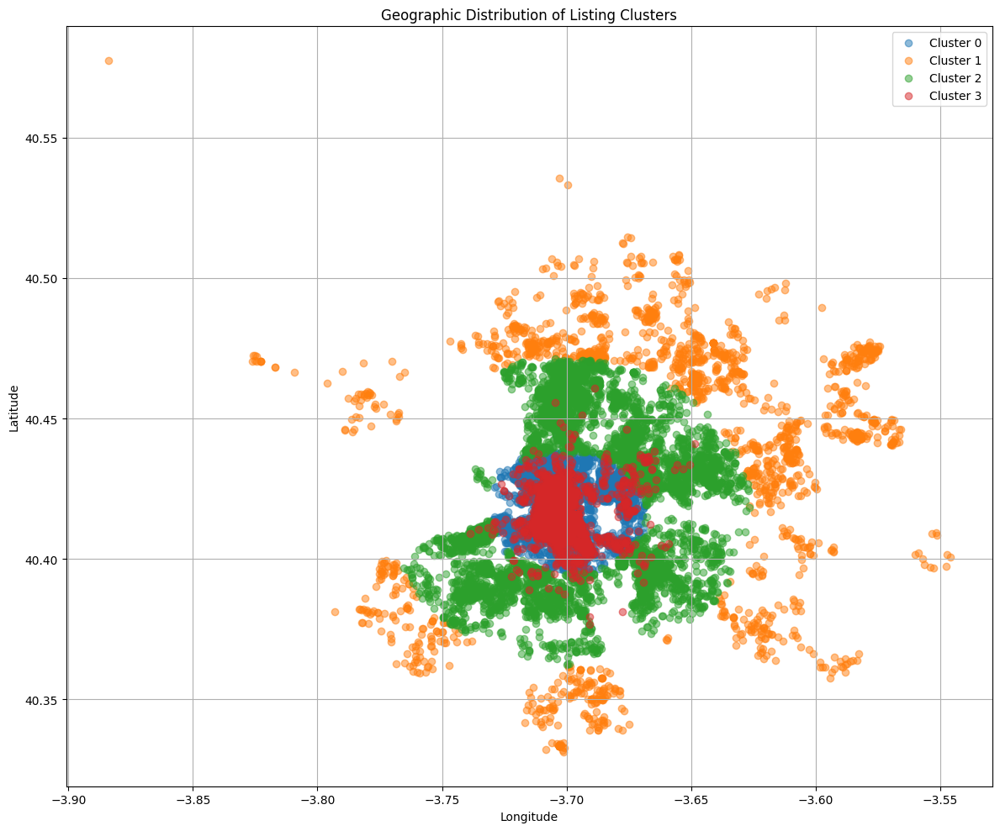

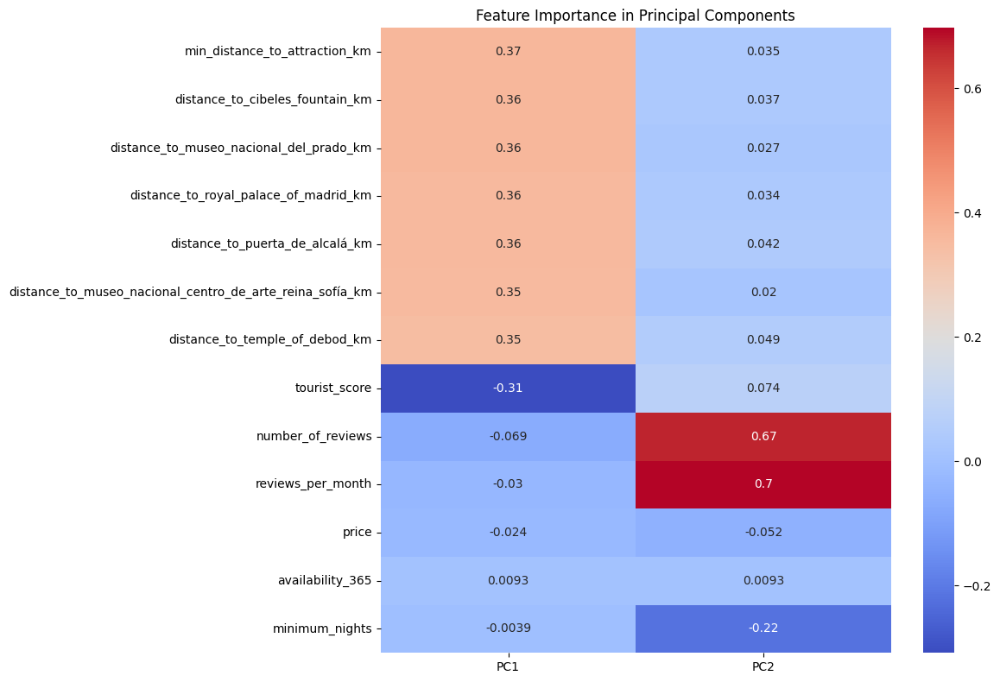

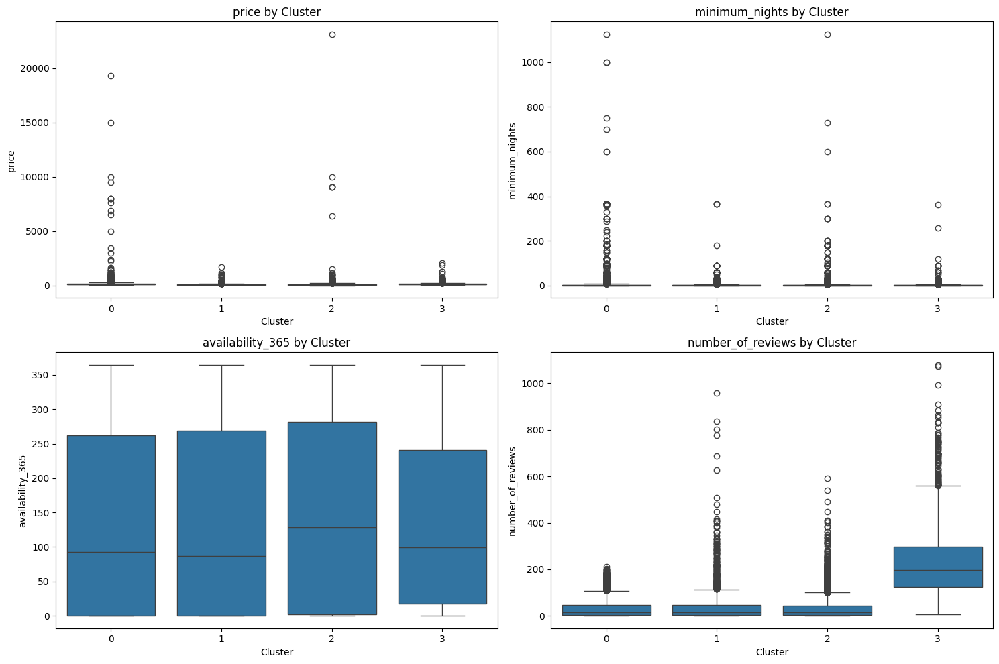

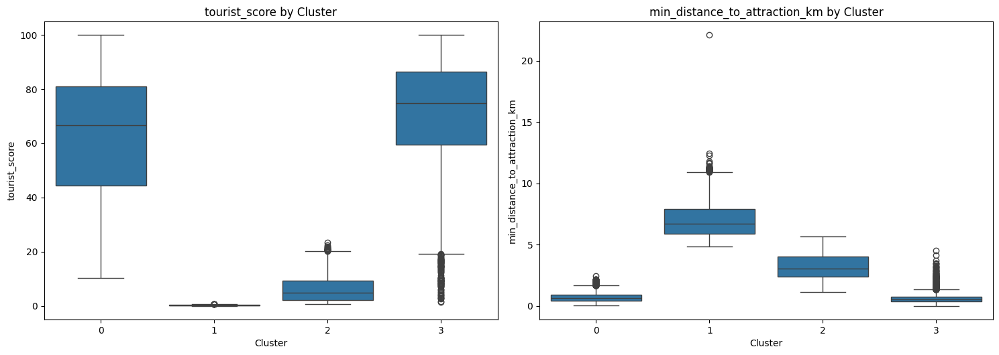

<Figure size 1200x600 with 0 Axes>

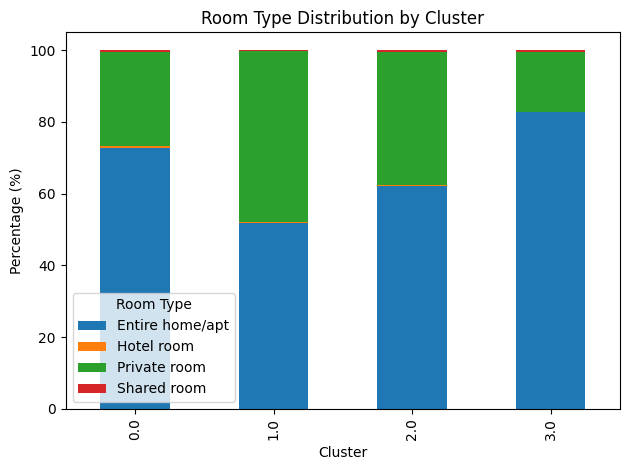

<Figure size 1400x600 with 0 Axes>

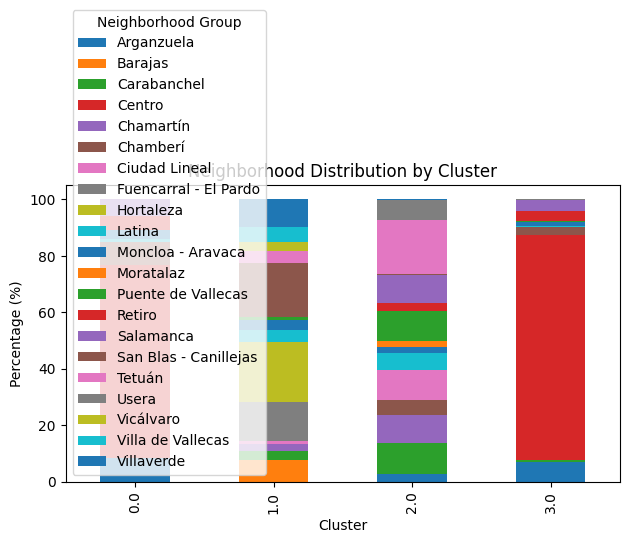

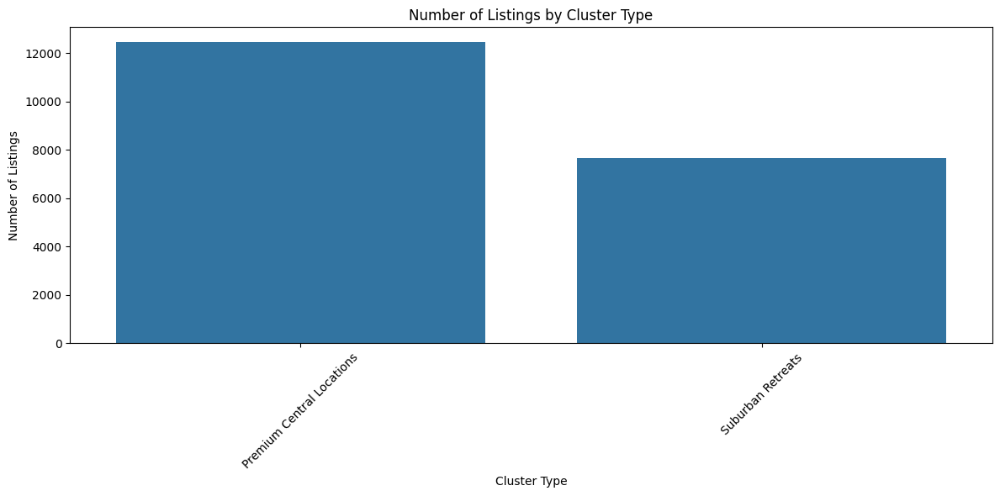


Cluster Profiles:
              price  tourist_score  min_distance_to_attraction_km  \
cluster                                                             
0        140.496803      62.625561                       0.696225   
1         80.118663       0.170062                       7.161102   
2        100.066484       6.392598                       3.194671   
3        123.645742      69.559635                       0.612610   

         availability_365  minimum_nights dominant_room_type  \
cluster                                                        
0              134.406105        8.485098    Entire home/apt   
1              133.963788        5.414485    Entire home/apt   
2              151.355495        7.102717    Entire home/apt   
3              130.578239        3.101892    Entire home/apt   

        dominant_neighbourhood_group                      label  
cluster                                                          
0                             Centro  Premium Cen

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score

location_features = [
    'distance_to_museo_nacional_del_prado_km',
    'distance_to_royal_palace_of_madrid_km',
    'distance_to_museo_nacional_centro_de_arte_reina_sofía_km',
    'distance_to_temple_of_debod_km',
    'distance_to_puerta_de_alcalá_km',
    'distance_to_cibeles_fountain_km',
    'min_distance_to_attraction_km',
    'tourist_score'
]

listing_features = [
    'price',
    'minimum_nights',
    'number_of_reviews',
    'reviews_per_month',
    'availability_365'
]

features = location_features + listing_features

cluster_df = df[features].copy()

cluster_df = cluster_df.dropna()

scaler = StandardScaler()
scaled_features = scaler.fit_transform(cluster_df)

inertia = []
silhouette_scores = []
k_range = range(2, 11)

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(scaled_features)
    inertia.append(kmeans.inertia_)
    
    labels = kmeans.labels_
    silhouette_scores.append(silhouette_score(scaled_features, labels))

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(k_range, inertia, 'o-')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal k')
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(k_range, silhouette_scores, 'o-')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for Optimal k')
plt.grid(True)

plt.tight_layout()
plt.show()

optimal_k = 4

kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
cluster_labels = kmeans.fit_predict(scaled_features)

cluster_df['cluster'] = cluster_labels
df_clustered = df.copy()
df_clustered.loc[cluster_df.index, 'cluster'] = cluster_labels

cluster_summary = cluster_df.groupby('cluster')[features].mean().round(2)
print("Cluster Centers:")
print(cluster_summary)

pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_features)

pca_df = pd.DataFrame(data=pca_result, columns=['PC1', 'PC2'])
pca_df['cluster'] = cluster_labels

plt.figure(figsize=(12, 8))
sns.scatterplot(x='PC1', y='PC2', hue='cluster', data=pca_df, palette='viridis', s=50, alpha=0.7)
plt.title('Listing Clusters Visualized using PCA')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster')
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 10))
for cluster_id in range(optimal_k):
    cluster_data = df_clustered[df_clustered['cluster'] == cluster_id]
    plt.scatter(
        cluster_data['longitude'], 
        cluster_data['latitude'], 
        alpha=0.5,
        label=f'Cluster {cluster_id}'
    )

plt.title('Geographic Distribution of Listing Clusters')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

pca_components = pd.DataFrame(
    pca.components_.T,
    columns=['PC1', 'PC2'],
    index=features
)

pca_components['PC1_abs'] = abs(pca_components['PC1'])
pca_components = pca_components.sort_values('PC1_abs', ascending=False)

plt.figure(figsize=(12, 8))
sns.heatmap(pca_components[['PC1', 'PC2']], cmap='coolwarm', annot=True)
plt.title('Feature Importance in Principal Components')
plt.tight_layout()
plt.show()

feature_groups = [
    ['price', 'minimum_nights', 'availability_365', 'number_of_reviews'],
    ['tourist_score', 'min_distance_to_attraction_km']
]

for i, group in enumerate(feature_groups):
    plt.figure(figsize=(15, 10))
    for j, feature in enumerate(group):
        plt.subplot(2, 2, j+1)
        sns.boxplot(x='cluster', y=feature, data=cluster_df)
        plt.title(f'{feature} by Cluster')
        plt.xlabel('Cluster')
        plt.ylabel(feature)
    plt.tight_layout()
    plt.show()

room_type_by_cluster = pd.crosstab(
    df_clustered['cluster'], 
    df_clustered['room_type'], 
    normalize='index'
) * 100

plt.figure(figsize=(12, 6))
room_type_by_cluster.plot(kind='bar', stacked=True)
plt.title('Room Type Distribution by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Percentage (%)')
plt.legend(title='Room Type')
plt.tight_layout()
plt.show()

neighborhood_by_cluster = pd.crosstab(
    df_clustered['cluster'], 
    df_clustered['neighbourhood_group'], 
    normalize='index'
) * 100

plt.figure(figsize=(14, 6))
neighborhood_by_cluster.plot(kind='bar', stacked=True)
plt.title('Neighborhood Distribution by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Percentage (%)')
plt.legend(title='Neighborhood Group')
plt.tight_layout()
plt.show()

cluster_profile = pd.DataFrame()

for feature in features:
    cluster_profile[feature] = cluster_df.groupby('cluster')[feature].mean()

for categorical in ['room_type', 'neighbourhood_group']:
    distribution = pd.crosstab(
        df_clustered['cluster'], 
        df_clustered[categorical], 
        normalize='index'
    )
    
    dominant_category = distribution.idxmax(axis=1)
    cluster_profile[f'dominant_{categorical}'] = dominant_category
    
    dominant_pct = distribution.max(axis=1) * 100
    cluster_profile[f'dominant_{categorical}_pct'] = dominant_pct.round(1)

def determine_cluster_labels(profile):
    labels = {}
    
    for cluster_id in profile.index:
        price = profile.loc[cluster_id, 'price']
        tourist_score = profile.loc[cluster_id, 'tourist_score']
        min_distance = profile.loc[cluster_id, 'min_distance_to_attraction_km']
        availability = profile.loc[cluster_id, 'availability_365']
        min_nights = profile.loc[cluster_id, 'minimum_nights']
        
        if tourist_score > 75 and price > cluster_profile['price'].median():
            labels[cluster_id] = "Premium Tourist Hotspots"
        elif tourist_score > 75 and price <= cluster_profile['price'].median():
            labels[cluster_id] = "Value Tourist Accommodations"
        elif min_distance < 1 and price > cluster_profile['price'].median():
            labels[cluster_id] = "Premium Central Locations"
        elif min_distance > 2:
            labels[cluster_id] = "Suburban Retreats"
        elif min_nights > 7:
            labels[cluster_id] = "Long-term Stay Options"
        elif availability < 90:
            labels[cluster_id] = "Limited Availability Rentals"
        else:
            labels[cluster_id] = f"Cluster {cluster_id}"
            
    return labels

cluster_labels = determine_cluster_labels(cluster_profile)
cluster_profile['label'] = pd.Series(cluster_labels)

df_clustered['cluster_label'] = df_clustered['cluster'].map(cluster_labels)

plt.figure(figsize=(12, 6))
cluster_counts = df_clustered['cluster_label'].value_counts()
sns.barplot(x=cluster_counts.index, y=cluster_counts.values)
plt.title('Number of Listings by Cluster Type')
plt.xlabel('Cluster Type')
plt.ylabel('Number of Listings')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print("\nCluster Profiles:")
print(cluster_profile[['price', 'tourist_score', 'min_distance_to_attraction_km', 
                      'availability_365', 'minimum_nights', 
                      'dominant_room_type', 'dominant_neighbourhood_group', 'label']])

In [ ]:
df_clustered.to_csv('madrid_airbnb_clustered.csv', index=False) # Para PowerBI

Cluster Centers:
         distance_to_museo_nacional_del_prado_km  \
cluster                                            
0                                           1.48   
1                                           8.02   
2                                           3.99   
3                                           1.34   

         distance_to_royal_palace_of_madrid_km  \
cluster                                          
0                                         1.49   
1                                         8.62   
2                                         4.41   
3                                         1.40   

         distance_to_museo_nacional_centro_de_arte_reina_sofía_km  \
cluster                                                             
0                                                     1.63          
1                                                     8.32          
2                                                     4.17          
3                       

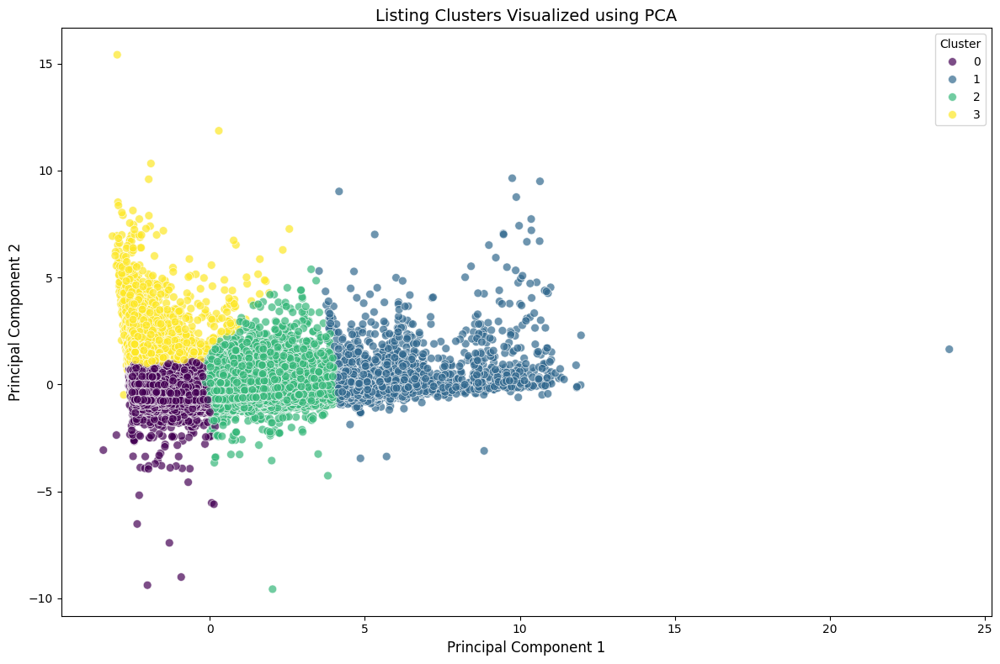

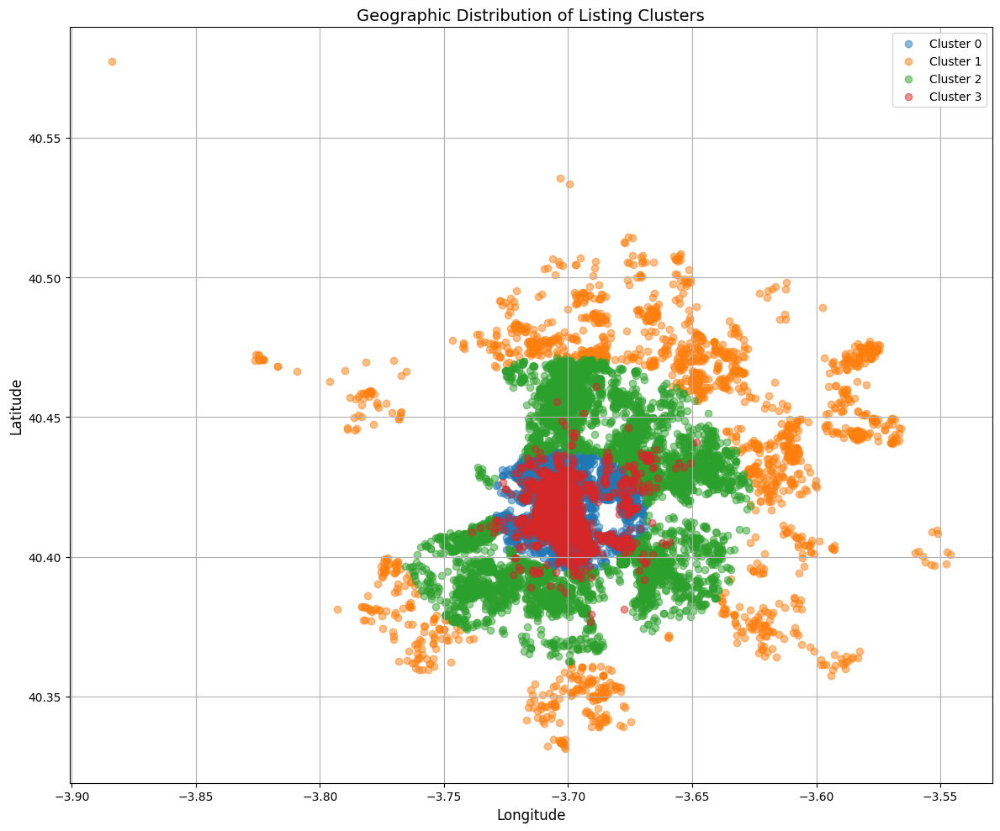

<Figure size 1200x600 with 0 Axes>

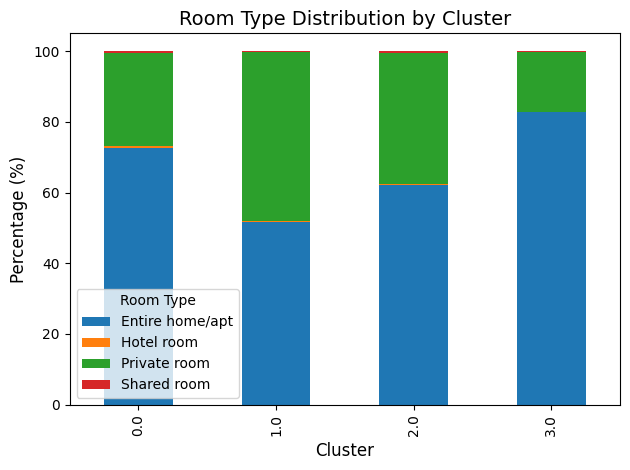

<Figure size 1400x600 with 0 Axes>

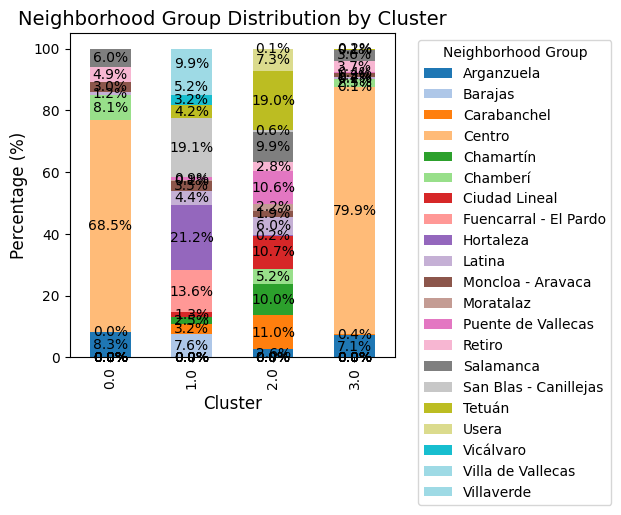

<Figure size 1400x600 with 0 Axes>

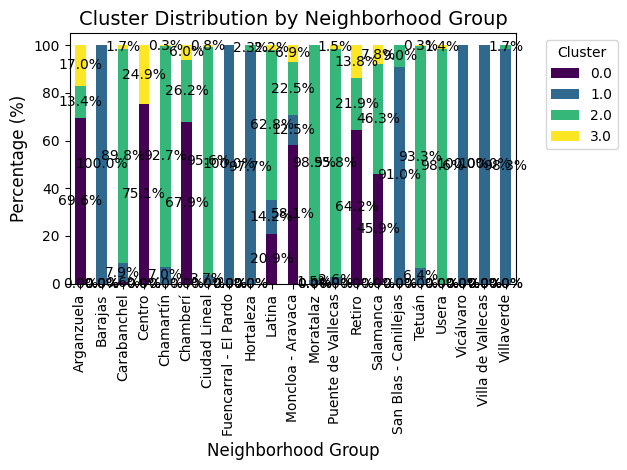

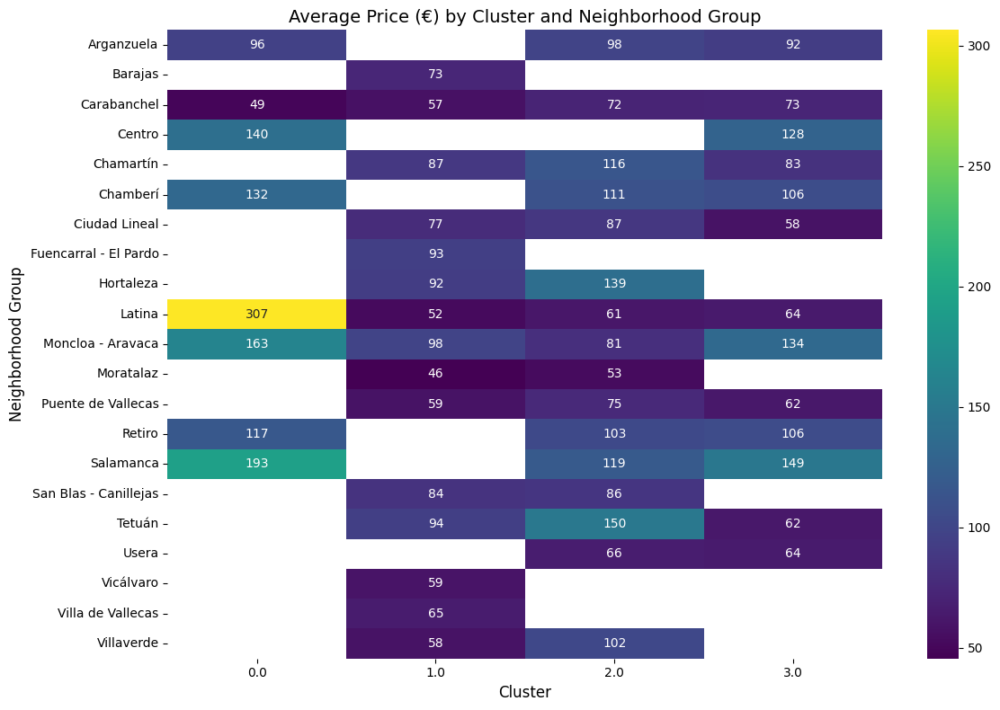

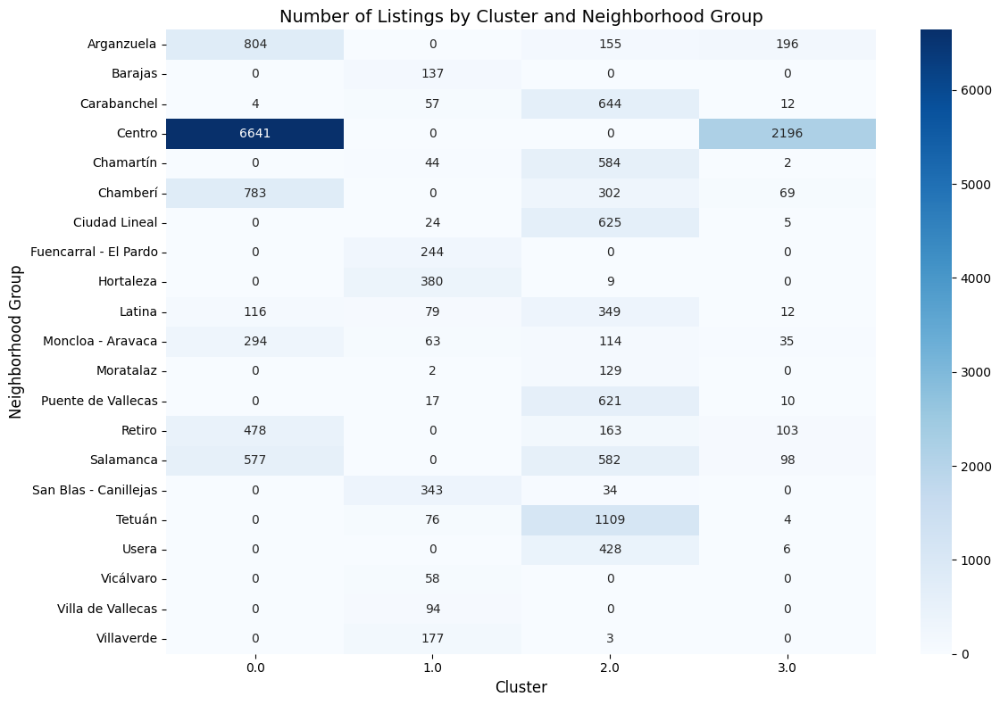

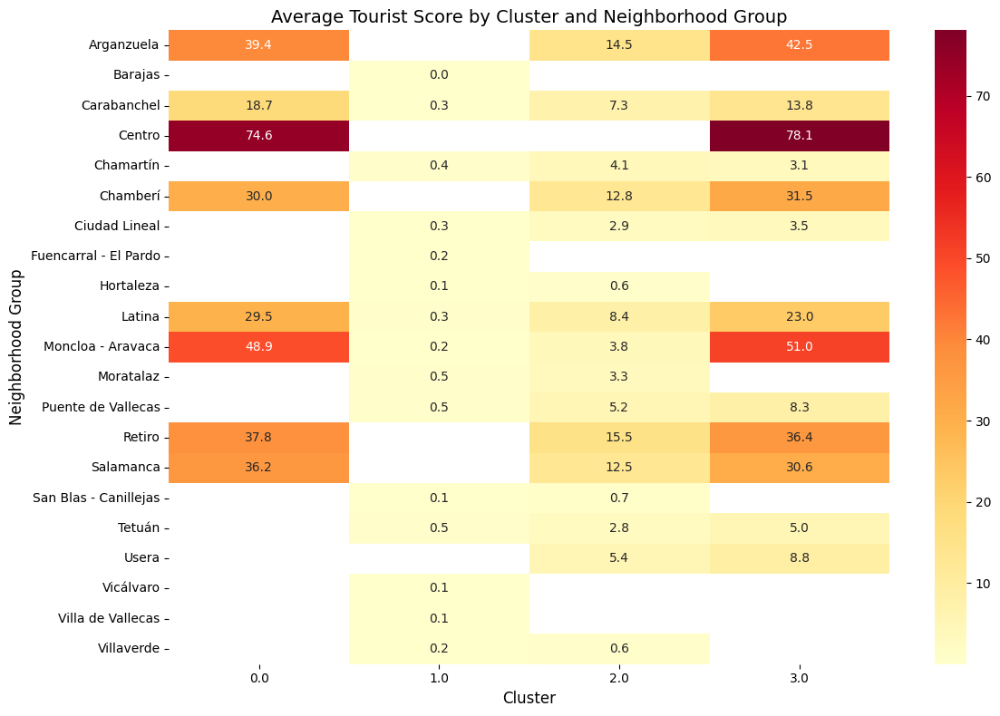

<Figure size 1400x1000 with 0 Axes>

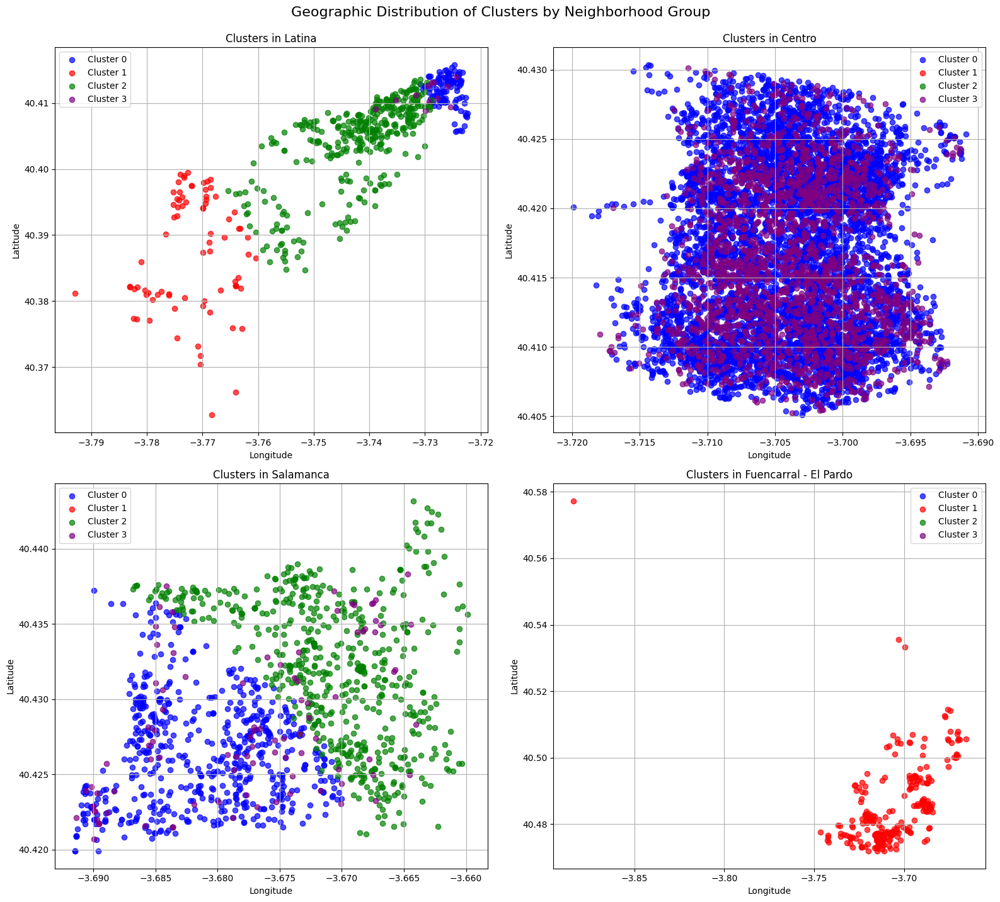

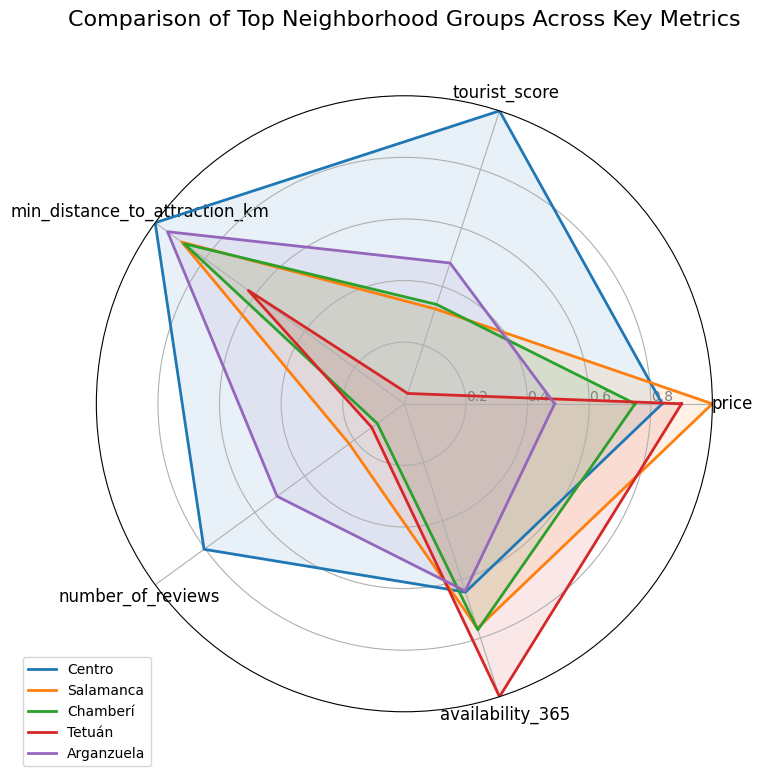


Cluster Profiles:
              price  tourist_score  min_distance_to_attraction_km  \
cluster                                                             
0.0      140.496803      62.625561                       0.696225   
1.0       80.118663       0.170062                       7.161102   
2.0      100.066484       6.392598                       3.194671   
3.0      123.645742      69.559635                       0.612610   

         availability_365  minimum_nights                      label  
cluster                                                               
0.0            134.406105        8.485098  Premium Central Locations  
1.0            133.963788        5.414485          Suburban Retreats  
2.0            151.355495        7.102717          Suburban Retreats  
3.0            130.578239        3.101892  Premium Central Locations  


<Figure size 1400x800 with 0 Axes>

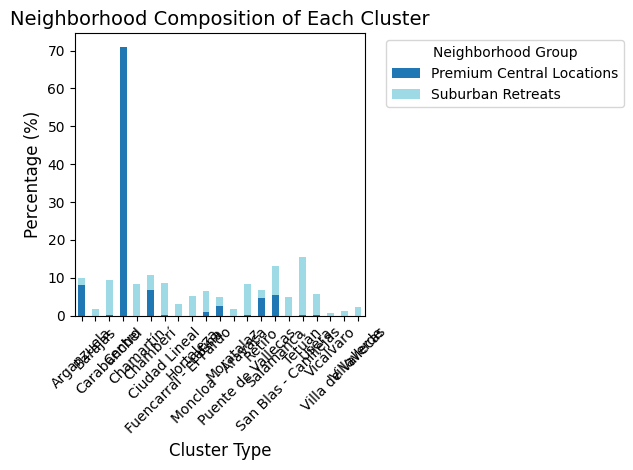

In [ ]:
location_features = [
    'distance_to_museo_nacional_del_prado_km',
    'distance_to_royal_palace_of_madrid_km',
    'distance_to_museo_nacional_centro_de_arte_reina_sofía_km',
    'distance_to_temple_of_debod_km',
    'distance_to_puerta_de_alcalá_km',
    'distance_to_cibeles_fountain_km',
    'min_distance_to_attraction_km',
    'tourist_score'
]

listing_features = [
    'price',
    'minimum_nights',
    'number_of_reviews',
    'reviews_per_month',
    'availability_365'
]

features = location_features + listing_features

cluster_df = df[features].copy()

cluster_df = cluster_df.dropna()

scaler = StandardScaler()
scaled_features = scaler.fit_transform(cluster_df)

optimal_k = 4

kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
cluster_labels = kmeans.fit_predict(scaled_features)

cluster_df['cluster'] = cluster_labels
df_clustered = df.copy()
df_clustered.loc[cluster_df.index, 'cluster'] = cluster_labels

cluster_summary = cluster_df.groupby('cluster')[features].mean().round(2)
print("Cluster Centers:")
print(cluster_summary)

pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_features)

pca_df = pd.DataFrame(data=pca_result, columns=['PC1', 'PC2'])
pca_df['cluster'] = cluster_labels

plt.figure(figsize=(12, 8))
sns.scatterplot(x='PC1', y='PC2', hue='cluster', data=pca_df, palette='viridis', s=50, alpha=0.7)
plt.title('Listing Clusters Visualized using PCA', fontsize=14)
plt.xlabel('Principal Component 1', fontsize=12)
plt.ylabel('Principal Component 2', fontsize=12)
plt.legend(title='Cluster')
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 10))
for cluster_id in range(optimal_k):
    cluster_data = df_clustered[df_clustered['cluster'] == cluster_id]
    plt.scatter(
        cluster_data['longitude'], 
        cluster_data['latitude'], 
        alpha=0.5,
        label=f'Cluster {cluster_id}'
    )

plt.title('Geographic Distribution of Listing Clusters', fontsize=14)
plt.xlabel('Longitude', fontsize=12)
plt.ylabel('Latitude', fontsize=12)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

room_type_by_cluster = pd.crosstab(
    df_clustered['cluster'], 
    df_clustered['room_type'], 
    normalize='index'
) * 100

plt.figure(figsize=(12, 6))
room_type_by_cluster.plot(kind='bar', stacked=True)
plt.title('Room Type Distribution by Cluster', fontsize=14)
plt.xlabel('Cluster', fontsize=12)
plt.ylabel('Percentage (%)', fontsize=12)
plt.legend(title='Room Type')
plt.tight_layout()
plt.show()


neighborhood_by_cluster = pd.crosstab(
    df_clustered['cluster'], 
    df_clustered['neighbourhood_group'], 
    normalize='index'
) * 100

plt.figure(figsize=(14, 6))
ax = neighborhood_by_cluster.plot(kind='bar', stacked=True, colormap='tab20')
plt.title('Neighborhood Group Distribution by Cluster', fontsize=14)
plt.xlabel('Cluster', fontsize=12)
plt.ylabel('Percentage (%)', fontsize=12)
plt.legend(title='Neighborhood Group', bbox_to_anchor=(1.05, 1), loc='upper left')

for container in ax.containers:
    ax.bar_label(container, fmt='%.1f%%', label_type='center')

plt.tight_layout()
plt.show()

cluster_by_neighborhood = pd.crosstab(
    df_clustered['neighbourhood_group'], 
    df_clustered['cluster'], 
    normalize='index'
) * 100

plt.figure(figsize=(14, 6))
ax = cluster_by_neighborhood.plot(kind='bar', stacked=True, colormap='viridis')
plt.title('Cluster Distribution by Neighborhood Group', fontsize=14)
plt.xlabel('Neighborhood Group', fontsize=12)
plt.ylabel('Percentage (%)', fontsize=12)
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')

for container in ax.containers:
    ax.bar_label(container, fmt='%.1f%%', label_type='center')

plt.tight_layout()
plt.show()

price_by_cluster_neighborhood = df_clustered.pivot_table(
    values='price',
    index='neighbourhood_group',
    columns='cluster',
    aggfunc='mean'
)

plt.figure(figsize=(12, 8))
sns.heatmap(price_by_cluster_neighborhood, annot=True, fmt='.0f', cmap='viridis')
plt.title('Average Price (€) by Cluster and Neighborhood Group', fontsize=14)
plt.xlabel('Cluster', fontsize=12)
plt.ylabel('Neighborhood Group', fontsize=12)
plt.tight_layout()
plt.show()

count_by_cluster_neighborhood = pd.crosstab(
    df_clustered['neighbourhood_group'], 
    df_clustered['cluster']
)

plt.figure(figsize=(12, 8))
sns.heatmap(count_by_cluster_neighborhood, annot=True, fmt='d', cmap='Blues')
plt.title('Number of Listings by Cluster and Neighborhood Group', fontsize=14)
plt.xlabel('Cluster', fontsize=12)
plt.ylabel('Neighborhood Group', fontsize=12)
plt.tight_layout()
plt.show()

tourist_score_by_cluster_neighborhood = df_clustered.pivot_table(
    values='tourist_score',
    index='neighbourhood_group',
    columns='cluster',
    aggfunc='mean'
)

plt.figure(figsize=(12, 8))
sns.heatmap(tourist_score_by_cluster_neighborhood, annot=True, fmt='.1f', cmap='YlOrRd')
plt.title('Average Tourist Score by Cluster and Neighborhood Group', fontsize=14)
plt.xlabel('Cluster', fontsize=12)
plt.ylabel('Neighborhood Group', fontsize=12)
plt.tight_layout()
plt.show()

plt.figure(figsize=(14, 10))

cluster_colors = {0: 'blue', 1: 'red', 2: 'green', 3: 'purple'}

neighborhood_groups = df_clustered['neighbourhood_group'].unique()

fig, axes = plt.subplots(2, 2, figsize=(16, 14))
axes = axes.flatten()

for i, neighborhood in enumerate(neighborhood_groups[:4]):  
    ax = axes[i]
    neighborhood_data = df_clustered[df_clustered['neighbourhood_group'] == neighborhood]
    
    for cluster_id in range(optimal_k):
        cluster_data = neighborhood_data[neighborhood_data['cluster'] == cluster_id]
        ax.scatter(
            cluster_data['longitude'], 
            cluster_data['latitude'], 
            color=cluster_colors[cluster_id],
            alpha=0.7,
            label=f'Cluster {cluster_id}'
        )
    
    ax.set_title(f'Clusters in {neighborhood}', fontsize=12)
    ax.set_xlabel('Longitude', fontsize=10)
    ax.set_ylabel('Latitude', fontsize=10)
    ax.legend()
    ax.grid(True)

plt.tight_layout()
plt.suptitle('Geographic Distribution of Clusters by Neighborhood Group', fontsize=16, y=1.02)
plt.show()

from matplotlib.path import Path
from matplotlib.spines import Spine
from matplotlib.transforms import Affine2D

def radar_chart(df, groups, metrics, title):
    N = len(metrics)
    
    angles = [n / float(N) * 2 * np.pi for n in range(N)]
    angles += angles[:1]  
    
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, polar=True)
    
    plt.xticks(angles[:-1], metrics, size=12)
    
    ax.set_rlabel_position(0)
    plt.yticks([0.2, 0.4, 0.6, 0.8], ["0.2", "0.4", "0.6", "0.8"], color="grey", size=10)
    plt.ylim(0, 1)
    
    for i, group in enumerate(groups):
        values = df.loc[group].values.flatten().tolist()
        values += values[:1]  # Close the loop
        ax.plot(angles, values, linewidth=2, linestyle='solid', label=group)
        ax.fill(angles, values, alpha=0.1)
    
    plt.legend(loc='upper right', bbox_to_anchor=(0.1, 0.1))
    plt.title(title, size=16, y=1.1)
    
    return fig, ax

radar_metrics = ['price', 'tourist_score', 'min_distance_to_attraction_km', 'number_of_reviews', 'availability_365']
neighborhood_metrics = df_clustered.groupby('neighbourhood_group')[radar_metrics].mean()

normalized_metrics = (neighborhood_metrics - neighborhood_metrics.min()) / (neighborhood_metrics.max() - neighborhood_metrics.min())

normalized_metrics['min_distance_to_attraction_km'] = 1 - normalized_metrics['min_distance_to_attraction_km']

top_neighborhoods = df_clustered['neighbourhood_group'].value_counts().head(5).index.tolist()

radar_chart(normalized_metrics, top_neighborhoods, radar_metrics, 'Comparison of Top Neighborhood Groups Across Key Metrics')
plt.show()

def determine_cluster_labels(df_clustered):
    cluster_profile = df_clustered.groupby('cluster').agg({
        'price': 'mean',
        'tourist_score': 'mean',
        'min_distance_to_attraction_km': 'mean',
        'availability_365': 'mean',
        'minimum_nights': 'mean'
    })
    
    labels = {}
    
    for cluster_id in range(optimal_k):
        price = cluster_profile.loc[cluster_id, 'price']
        tourist_score = cluster_profile.loc[cluster_id, 'tourist_score']
        min_distance = cluster_profile.loc[cluster_id, 'min_distance_to_attraction_km']
        availability = cluster_profile.loc[cluster_id, 'availability_365']
        min_nights = cluster_profile.loc[cluster_id, 'minimum_nights']
        
        if tourist_score > 75 and price > cluster_profile['price'].median():
            labels[cluster_id] = "Premium Tourist Hotspots"
        elif tourist_score > 75 and price <= cluster_profile['price'].median():
            labels[cluster_id] = "Value Tourist Accommodations"
        elif min_distance < 1 and price > cluster_profile['price'].median():
            labels[cluster_id] = "Premium Central Locations"
        elif min_distance > 2:
            labels[cluster_id] = "Suburban Retreats"
        elif min_nights > 7:
            labels[cluster_id] = "Long-term Stay Options"
        elif availability < 90:
            labels[cluster_id] = "Limited Availability Rentals"
        else:
            labels[cluster_id] = f"Cluster {cluster_id}"
            
    return labels

cluster_labels = determine_cluster_labels(df_clustered)

df_clustered['cluster_label'] = df_clustered['cluster'].map(cluster_labels)

df_clustered.to_csv('madrid_airbnb_clustered.csv', index=False)

print("\nCluster Profiles:")
cluster_profile = df_clustered.groupby('cluster').agg({
    'price': 'mean',
    'tourist_score': 'mean',
    'min_distance_to_attraction_km': 'mean',
    'availability_365': 'mean',
    'minimum_nights': 'mean'
})
cluster_profile['label'] = pd.Series(cluster_labels)
print(cluster_profile)

plt.figure(figsize=(14, 8))
neighborhood_cluster_counts = pd.crosstab(df_clustered['neighbourhood_group'], df_clustered['cluster_label'])
neighborhood_cluster_counts_pct = neighborhood_cluster_counts.div(neighborhood_cluster_counts.sum(axis=0), axis=1) * 100
ax = neighborhood_cluster_counts_pct.plot(kind='bar', stacked=True, colormap='tab20')
plt.title('Neighborhood Composition of Each Cluster', fontsize=14)
plt.xlabel('Cluster Type', fontsize=12)
plt.ylabel('Percentage (%)', fontsize=12)
plt.legend(title='Neighborhood Group', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

CONTEO DE LISTINGS POR CLUSTER

Número de listings por cluster:
Cluster 0.0: 9,697 listings
Cluster 1.0: 1,795 listings
Cluster 2.0: 5,851 listings
Cluster 3.0: 2,748 listings

Total de listings analizados: 25,288

Porcentaje por cluster:
Cluster 0.0: 38.3%
Cluster 1.0: 7.1%
Cluster 2.0: 23.1%
Cluster 3.0: 10.9%

CONTEO CON LABELS DESCRIPTIVOS

Número de listings por tipo de cluster:
Premium Central Locations: 12,445 listings (49.2%)
Suburban Retreats: 7,646 listings (30.2%)

TABLA RESUMEN COMPLETA
 Cluster_ID  Listings_Count  Percentage             Cluster_Label
        0.0            9697        38.3 Premium Central Locations
        1.0            1795         7.1         Suburban Retreats
        2.0            5851        23.1         Suburban Retreats
        3.0            2748        10.9 Premium Central Locations


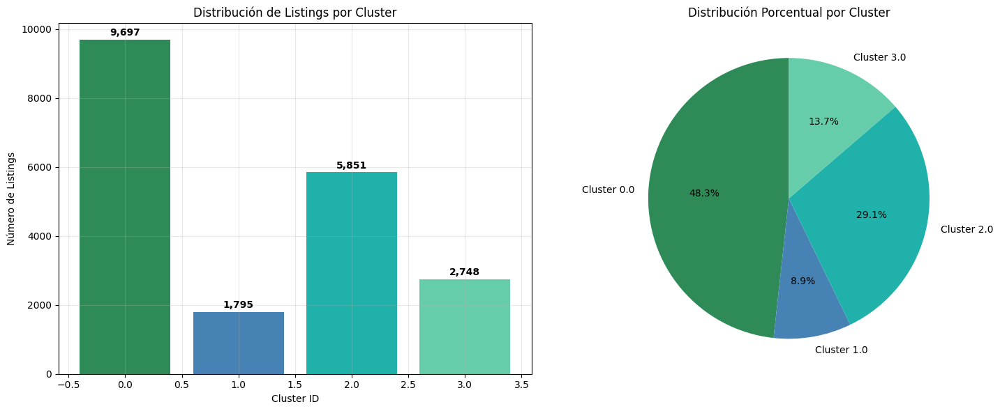


DISTRIBUCIÓN POR BARRIO Y CLUSTER (TOP 10 BARRIOS)

Top 10 barrios con más listings:

Centro: 8,837 listings
  - Cluster 0: 6,641 (75.1%)
  - Cluster 3: 2,196 (24.9%)

Salamanca: 1,257 listings
  - Cluster 0: 577 (45.9%)
  - Cluster 2: 582 (46.3%)
  - Cluster 3: 98 (7.8%)

Tetuán: 1,189 listings
  - Cluster 1: 76 (6.4%)
  - Cluster 2: 1,109 (93.3%)
  - Cluster 3: 4 (0.3%)

Arganzuela: 1,155 listings
  - Cluster 0: 804 (69.6%)
  - Cluster 2: 155 (13.4%)
  - Cluster 3: 196 (17.0%)

Chamberí: 1,154 listings
  - Cluster 0: 783 (67.9%)
  - Cluster 2: 302 (26.2%)
  - Cluster 3: 69 (6.0%)

Retiro: 744 listings
  - Cluster 0: 478 (64.2%)
  - Cluster 2: 163 (21.9%)
  - Cluster 3: 103 (13.8%)

Carabanchel: 717 listings
  - Cluster 0: 4 (0.6%)
  - Cluster 1: 57 (7.9%)
  - Cluster 2: 644 (89.8%)
  - Cluster 3: 12 (1.7%)

Ciudad Lineal: 654 listings
  - Cluster 1: 24 (3.7%)
  - Cluster 2: 625 (95.6%)
  - Cluster 3: 5 (0.8%)

Puente de Vallecas: 648 listings
  - Cluster 1: 17 (2.6%)
  - Cluster 2: 

In [ ]:
print("="*50)
print("CONTEO DE LISTINGS POR CLUSTER")
print("="*50)

cluster_counts = df_clustered['cluster'].value_counts().sort_index()
print("\nNúmero de listings por cluster:")
for cluster_id, count in cluster_counts.items():
    print(f"Cluster {cluster_id}: {count:,} listings")

total_listings = len(df_clustered)
print(f"\nTotal de listings analizados: {total_listings:,}")
print("\nPorcentaje por cluster:")
for cluster_id, count in cluster_counts.items():
    percentage = (count / total_listings) * 100
    print(f"Cluster {cluster_id}: {percentage:.1f}%")

print("\n" + "="*60)
print("CONTEO CON LABELS DESCRIPTIVOS")
print("="*60)

cluster_label_counts = df_clustered['cluster_label'].value_counts()
print("\nNúmero de listings por tipo de cluster:")
for label, count in cluster_label_counts.items():
    percentage = (count / total_listings) * 100
    print(f"{label}: {count:,} listings ({percentage:.1f}%)")

print("\n" + "="*80)
print("TABLA RESUMEN COMPLETA")
print("="*80)

cluster_labels_mapping = df_clustered.groupby('cluster')['cluster_label'].first().to_dict()

summary_table = pd.DataFrame({
    'Cluster_ID': cluster_counts.index,
    'Listings_Count': cluster_counts.values,
    'Percentage': [(count/total_listings)*100 for count in cluster_counts.values],
    'Cluster_Label': [cluster_labels_mapping.get(i, f'Cluster {i}') for i in cluster_counts.index]
})

summary_table = summary_table.round(1)
print(summary_table.to_string(index=False))

fig, axes = plt.subplots(1, 2, figsize=(15, 6))

axes[0].bar(cluster_counts.index, cluster_counts.values, 
           color=['#2E8B57', '#4682B4', '#20B2AA', '#66CDAA'])
axes[0].set_xlabel('Cluster ID')
axes[0].set_ylabel('Número de Listings')
axes[0].set_title('Distribución de Listings por Cluster')
axes[0].grid(True, alpha=0.3)

for i, v in enumerate(cluster_counts.values):
    axes[0].text(i, v + 50, f'{v:,}', ha='center', va='bottom', fontweight='bold')

colors = ['#2E8B57', '#4682B4', '#20B2AA', '#66CDAA']
wedges, texts, autotexts = axes[1].pie(cluster_counts.values, 
                                      labels=[f'Cluster {i}' for i in cluster_counts.index],
                                      autopct='%1.1f%%',
                                      colors=colors,
                                      startangle=90)
axes[1].set_title('Distribución Porcentual por Cluster')

plt.tight_layout()
plt.show()

print("\n" + "="*80)
print("DISTRIBUCIÓN POR BARRIO Y CLUSTER (TOP 10 BARRIOS)")
print("="*80)

neighborhood_cluster_counts = pd.crosstab(df_clustered['neighbourhood_group'], 
                                         df_clustered['cluster'])

top_neighborhoods = neighborhood_cluster_counts.sum(axis=1).nlargest(10)
print("\nTop 10 barrios con más listings:")

for neighborhood in top_neighborhoods.index:
    total = top_neighborhoods[neighborhood]
    print(f"\n{neighborhood}: {total:,} listings")
    for cluster_id in [0, 1, 2, 3]:
        if cluster_id in neighborhood_cluster_counts.columns:
            count = neighborhood_cluster_counts.loc[neighborhood, cluster_id]
            if count > 0:
                percentage = (count / total) * 100
                print(f"  - Cluster {cluster_id}: {count:,} ({percentage:.1f}%)")


summary_table.to_csv('cluster_distribution_summary.csv', index=False)
print(f"\n✓ Tabla resumen guardada en: cluster_distribution_summary.csv")

neighborhood_cluster_counts.to_csv('neighborhood_cluster_distribution.csv')
print(f"✓ Distribución por barrio guardada en: neighborhood_cluster_distribution.csv")

print(f"\n{'='*50}")
print("ANÁLISIS COMPLETADO")
print(f"{'='*50}")

## Further analysis

1. Tourist Concentration vs. Price Analysis

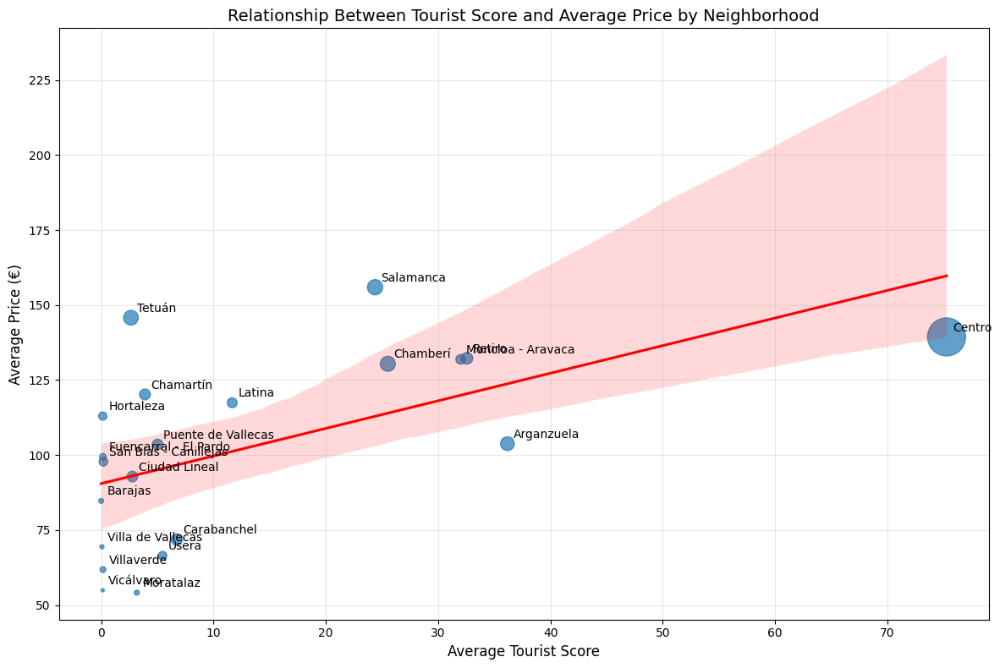

Correlation between tourist score and average price: 0.56
For each 10-point increase in tourist score, prices increase by approximately €9.20


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.linear_model import LinearRegression

neighborhood_metrics = df.groupby('neighbourhood_group').agg({
    'price': 'mean',
    'tourist_score': 'mean',
    'id': 'count'
}).reset_index()

neighborhood_metrics.columns = ['neighbourhood_group', 'avg_price', 'avg_tourist_score', 'listing_count']

neighborhood_metrics['listing_density'] = neighborhood_metrics['listing_count'] / neighborhood_metrics['listing_count'].sum()

plt.figure(figsize=(12, 8))
sns.regplot(x='avg_tourist_score', y='avg_price', data=neighborhood_metrics, 
            scatter_kws={'s': neighborhood_metrics['listing_count']/10, 'alpha': 0.7},
            line_kws={'color': 'red'})

for i, row in neighborhood_metrics.iterrows():
    plt.annotate(row['neighbourhood_group'], 
                 xy=(row['avg_tourist_score'], row['avg_price']),
                 xytext=(5, 5), textcoords='offset points')

plt.title('Relationship Between Tourist Score and Average Price by Neighborhood', fontsize=14)
plt.xlabel('Average Tourist Score', fontsize=12)
plt.ylabel('Average Price (€)', fontsize=12)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

correlation = neighborhood_metrics['avg_tourist_score'].corr(neighborhood_metrics['avg_price'])
print(f"Correlation between tourist score and average price: {correlation:.2f}")

X = neighborhood_metrics['avg_tourist_score'].values.reshape(-1, 1)
y = neighborhood_metrics['avg_price'].values
model = LinearRegression()
model.fit(X, y)

print(f"For each 10-point increase in tourist score, prices increase by approximately €{model.coef_[0]*10:.2f}")

2. Entire Home vs. Private Room Analysis

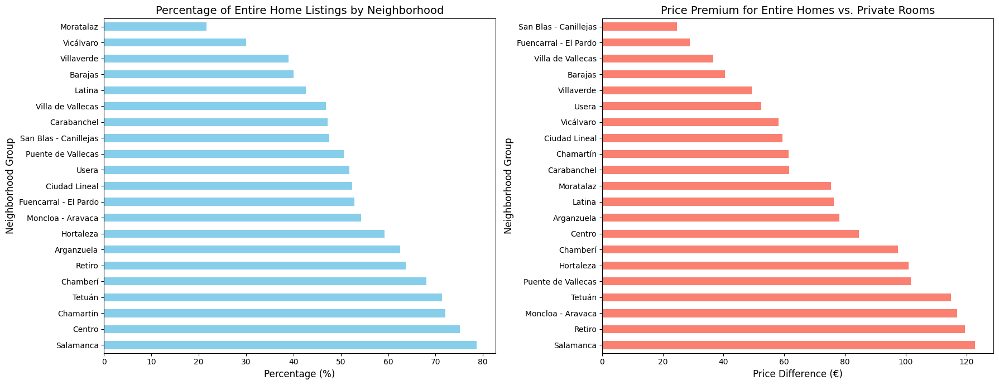

Number of entire homes with high availability (>180 days/year): 7145
Percentage of total listings: 28.25%


In [ ]:
room_type_by_neighborhood = pd.crosstab(
    df['neighbourhood_group'], 
    df['room_type'],
    normalize='index'
) * 100

price_by_room_neighborhood = df.pivot_table(
    values='price',
    index='neighbourhood_group',
    columns='room_type',
    aggfunc='mean'
)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 7))

room_type_by_neighborhood['Entire home/apt'].sort_values(ascending=False).plot(
    kind='barh', ax=ax1, color='skyblue')
ax1.set_title('Percentage of Entire Home Listings by Neighborhood', fontsize=14)
ax1.set_xlabel('Percentage (%)', fontsize=12)
ax1.set_ylabel('Neighborhood Group', fontsize=12)

price_diff = price_by_room_neighborhood['Entire home/apt'] - price_by_room_neighborhood['Private room']
price_diff.sort_values(ascending=False).plot(kind='barh', ax=ax2, color='salmon')
ax2.set_title('Price Premium for Entire Homes vs. Private Rooms', fontsize=14)
ax2.set_xlabel('Price Difference (€)', fontsize=12)
ax2.set_ylabel('Neighborhood Group', fontsize=12)

plt.tight_layout()
plt.show()

entire_homes = df[df['room_type'] == 'Entire home/apt']
high_availability_homes = entire_homes[entire_homes['availability_365'] > 180]
potential_long_term_rentals = high_availability_homes.shape[0]

print(f"Number of entire homes with high availability (>180 days/year): {potential_long_term_rentals}")
print(f"Percentage of total listings: {potential_long_term_rentals/df.shape[0]*100:.2f}%")

3. Professional Host Impact

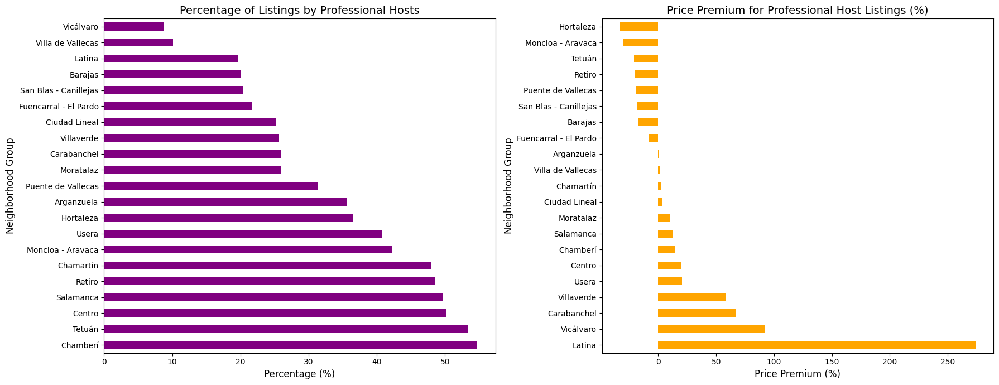

In [ ]:
host_listing_counts = df.groupby('host_id').size().reset_index(name='listing_count')
professional_hosts = host_listing_counts[host_listing_counts['listing_count'] >= 5]['host_id']

df['professional_host'] = df['host_id'].isin(professional_hosts)

professional_by_neighborhood = df.groupby('neighbourhood_group')['professional_host'].mean() * 100

price_by_host_type = df.groupby(['neighbourhood_group', 'professional_host'])['price'].mean().unstack()
price_by_host_type.columns = ['Individual Hosts', 'Professional Hosts']

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 7))

professional_by_neighborhood.sort_values(ascending=False).plot(
    kind='barh', ax=ax1, color='purple')
ax1.set_title('Percentage of Listings by Professional Hosts', fontsize=14)
ax1.set_xlabel('Percentage (%)', fontsize=12)
ax1.set_ylabel('Neighborhood Group', fontsize=12)

price_premium = ((price_by_host_type['Professional Hosts'] / price_by_host_type['Individual Hosts']) - 1) * 100
price_premium.dropna().sort_values(ascending=False).plot(
    kind='barh', ax=ax2, color='orange')
ax2.set_title('Price Premium for Professional Host Listings (%)', fontsize=14)
ax2.set_xlabel('Price Premium (%)', fontsize=12)
ax2.set_ylabel('Neighborhood Group', fontsize=12)

plt.tight_layout()
plt.show()

4. Cluster Analysis Implications for Housing Market

C:\Users\gmont\AppData\Local\Temp\ipykernel_25008\3324679948.py:39: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




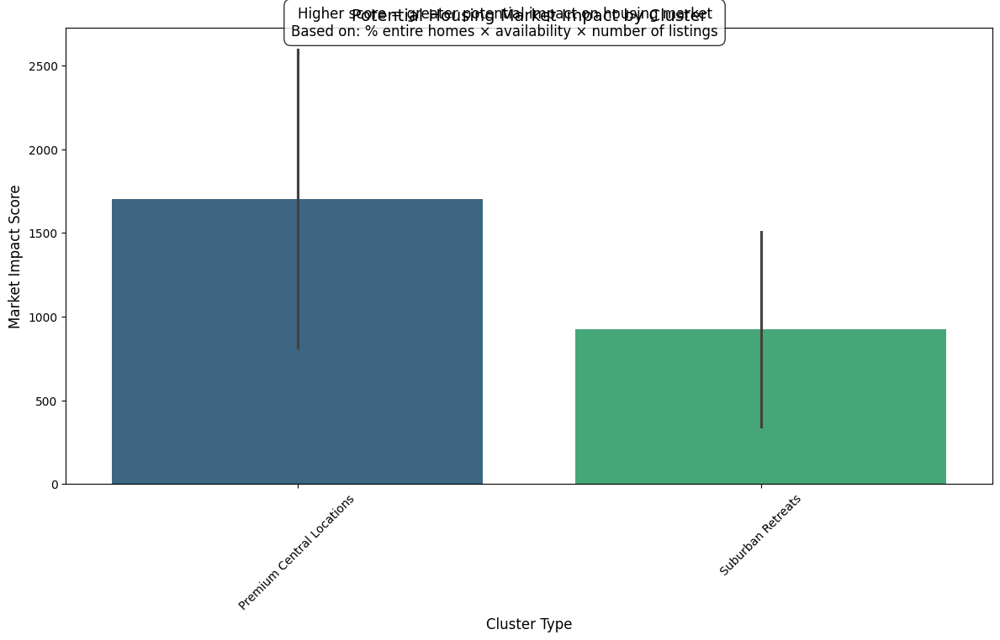

C:\Users\gmont\AppData\Local\Temp\ipykernel_25008\3324679948.py:82: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




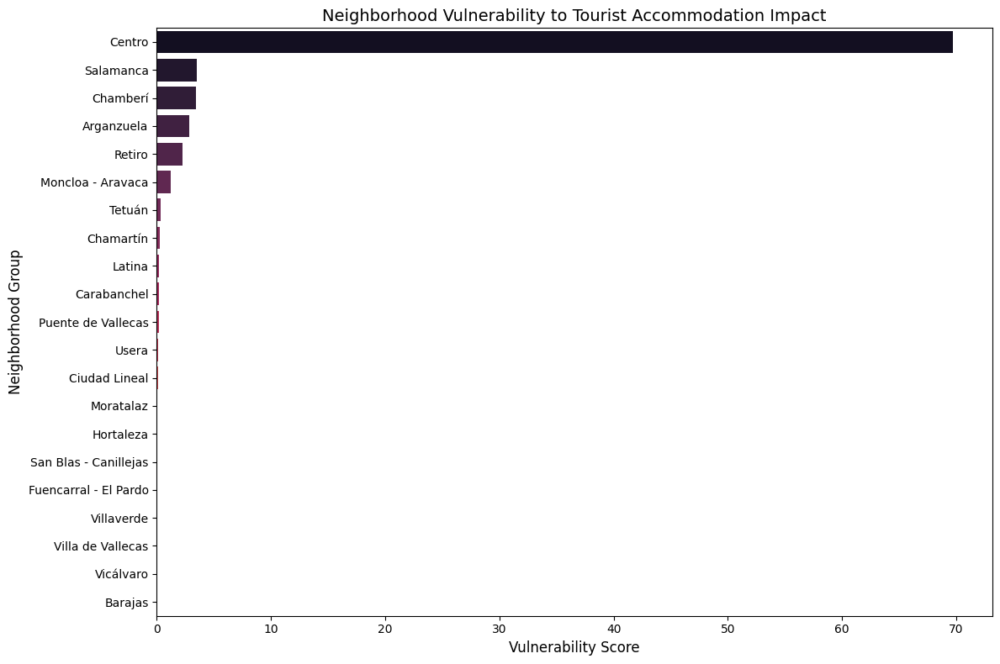

In [ ]:
cluster_housing_impact = df_clustered.groupby('cluster').agg({
    'price': 'mean',
    'room_type': lambda x: (x == 'Entire home/apt').mean() * 100,
    'availability_365': 'mean',
    'tourist_score': 'mean',
    'id': 'count'
}).reset_index()

cluster_housing_impact.columns = ['cluster', 'avg_price', 'pct_entire_homes', 
                                 'avg_availability', 'avg_tourist_score', 'listing_count']

if 'cluster_label' in df_clustered.columns:
    cluster_labels = df_clustered.groupby('cluster')['cluster_label'].first()
    cluster_housing_impact['cluster_label'] = cluster_housing_impact['cluster'].map(cluster_labels)
else:
    cluster_names = {
        0: "Premium Central Locations",
        1: "Suburban Retreats",
        2: "Tourist Hotspots",
        3: "Premium Central Locations"
    }
    cluster_housing_impact['cluster_label'] = cluster_housing_impact['cluster'].map(cluster_names)

cluster_housing_impact['market_impact_score'] = (
    cluster_housing_impact['pct_entire_homes'] / 100 * 
    cluster_housing_impact['avg_availability'] / 365 * 
    cluster_housing_impact['listing_count']
)

plt.figure(figsize=(12, 8))
sns.barplot(x='cluster_label', y='market_impact_score', data=cluster_housing_impact, 
            palette='viridis')
plt.title('Potential Housing Market Impact by Cluster', fontsize=14)
plt.xlabel('Cluster Type', fontsize=12)
plt.ylabel('Market Impact Score', fontsize=12)
plt.xticks(rotation=45)

plt.annotate('Higher score = greater potential impact on housing market\n'
             'Based on: % entire homes × availability × number of listings', 
             xy=(0.5, 0.9), xycoords='figure fraction', 
             ha='center', fontsize=12, bbox=dict(boxstyle="round,pad=0.5", fc="white", alpha=0.8))
plt.tight_layout()
plt.show()

if 'professional_host' not in df_clustered.columns:
    host_listing_counts = df_clustered.groupby('host_id').size().reset_index(name='listing_count')
    professional_hosts = host_listing_counts[host_listing_counts['listing_count'] >= 3]['host_id'].tolist()
    df_clustered['professional_host'] = df_clustered['host_id'].isin(professional_hosts)

neighborhood_vulnerability = df_clustered.groupby('neighbourhood_group').agg({
    'id': 'count',
    'room_type': lambda x: (x == 'Entire home/apt').mean() * 100,
    'professional_host': 'mean',
    'tourist_score': 'mean',
    'price': 'mean'
}).reset_index()

neighborhood_vulnerability['vulnerability_score'] = (
    (neighborhood_vulnerability['room_type'] / 100) * 
    (neighborhood_vulnerability['professional_host'] * 100) *
    (neighborhood_vulnerability['tourist_score'] / 50) *
    (neighborhood_vulnerability['id'] / neighborhood_vulnerability['id'].max())
)

neighborhood_vulnerability = neighborhood_vulnerability.sort_values('vulnerability_score', ascending=False)

plt.figure(figsize=(12, 8))
sns.barplot(x='vulnerability_score', y='neighbourhood_group', data=neighborhood_vulnerability,
            palette='rocket')
plt.title('Neighborhood Vulnerability to Tourist Accommodation Impact', fontsize=14)
plt.xlabel('Vulnerability Score', fontsize=12)
plt.ylabel('Neighborhood Group', fontsize=12)
plt.tight_layout()
plt.show()

In [53]:
df.head(5)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,...,distance_to_puerta_de_alcalá_km,distance_to_cibeles_fountain_km,min_distance_to_attraction_km,min_attraction_distance_category,tourist_score,tourist_score_category,distance_to_major_attractions,tourist_density_index,tourist_density_category,professional_host
0,21853,Bright and airy room,83531,Abdel,Latina,Cármenes,40.40381,-3.74130,Private room,29.0,...,4.800210,4.432213,2.773963,2-5 km,6.500409,Low,2.773963,0.347952,Low,False
1,30320,Great Vacational Apartments,130907,Dana,Centro,Sol,40.41476,-3.70418,Entire home/apt,140.0,...,1.430964,1.068252,0.249392,< 0.5 km,94.597186,Very High,0.249392,2.862113,Very High,False
2,30959,Beautiful loft in Madrid Center,132883,Angela,Centro,Embajadores,40.41259,-3.70105,Entire home/apt,104.0,...,1.328171,1.008511,0.527995,0.5-1 km,84.983206,Very High,0.527995,1.592369,High,False
3,40916,Holiday Apartment Madrid Center,130907,Dana,Centro,Universidad,40.42247,-3.70577,Entire home/apt,122.0,...,1.467977,1.129271,0.642744,0.5-1 km,72.313697,High,0.642744,1.346358,High,False
4,62423,MAGIC ARTISTIC HOUSE IN THE CENTER OF MADRID,303845,Arturo,Centro,Justicia,40.41884,-3.69655,Private room,77.0,...,0.673698,0.298609,0.298609,< 0.5 km,88.412824,Very High,0.298609,2.508727,Very High,False
